In [1]:
cd ..

m:\OneDrive\Projects\federated_imputation_pc1


## Loading

In [3]:
%load_ext autoreload
%autoreload
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from src.modules.data_spliting import split_train_test
from src.modules.data_preprocessing import load_data
import random
from src.modules.data_partition import data_partition
from src.fed_imp.sub_modules.missing_simulate.missing_adder_new import add_missing
from src.fed_imp.sub_modules.client.client_factory import ClientsFactory
from src.fed_imp.sub_modules.strategy.strategy_imp import StrategyImputation
from src.fed_imp.sub_modules.server.load_server import load_server
from src.fed_imp.sub_modules.client.simple_client import SimpleClient
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from dython.nominal import correlation_ratio
import missingno as msno
from src.fed_imp.sub_modules.missing_simulate.missing_adder_new import simulate_nan_new
from src.modules.evaluation.imputation_quality import rmse, ws_cols, sliced_ws


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
def visualize_ms(clients_ms_datas:list, sort_patterns: bool = False):
    n_cols = 5
    n_clients = len(clients_ms_datas)
    n_rows = (n_clients + 4)//n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*4, n_rows*3), squeeze=False)
    for i in range(n_clients):
        ax = axes[i//n_cols, i%n_cols]
        d = pd.DataFrame(clients_ms_datas[i])
        d = d.sort_values(by=d.columns[-1])
        if sort_patterns:
            msno.matrix(d, ax=ax, sparkline=False, sort='ascending')
        else:
            msno.matrix(d, ax=ax, sparkline=False)
        ax.set_title('Client {}'.format(i))
    plt.tight_layout()

def correlation(original_data, centralized_data):
    original_df = pd.DataFrame(original_data)
    target_col = original_df.columns[-1]
    correlation_ret = original_df.corrwith(original_df[target_col], method=correlation_ratio).sort_values(ascending=False)
    print(correlation_ret)

    centralized_df = pd.DataFrame(centralized_data)
    target_col = centralized_df.columns[-1]
    correlation_ret = centralized_df.corrwith(original_df[target_col], method=correlation_ratio).sort_values(ascending=False)
    print(correlation_ret)

def run_pred(clf_name, X_train, y_train, X_test, y_test):
    accus = []
    for i in range(5):
        seed = 21 + i*93940
        if clf_name == 'LR':
            clf = LogisticRegression(random_state=seed, max_iter=1000)
        elif clf_name == 'MLP':
            clf = MLPClassifier(
                [32, 32], batch_size = 128, random_state=seed, alpha = 0.001, max_iter = 1000)
        else:
            raise ValueError('clf_name should be LR or MLP')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        accus.append(metrics.accuracy_score(y_test, y_pred))
    return np.mean(accus), np.std(accus)

def sklearn_evaluation(rets):

    original_data = rets['data']['origin_data'].reshape(-1, rets['data']['origin_data'].shape[-1])
    centralized_data = rets['data']['imputed_data'].reshape(-1, rets['data']['origin_data'].shape[-1])
    test_data = rets['data']['test_data']

    X_train = centralized_data[:, :-1]
    y_train = centralized_data[:, -1]
    X_test = test_data[:, :-1]
    y_test = test_data[:, -1]
    accu, std = run_pred('MLP', X_train, y_train, X_test, y_test)
    print("Accuracy imputed centralized MLP:{:.4f} ({:.3f})".format(accu, std))

    accu, std = run_pred('LR', X_train, y_train, X_test, y_test)
    print("Accuracy imputed centralized LR:{:.4f} ({:.3f})".format(accu, std))

    X_train = original_data[:, :-1]
    y_train = original_data[:, -1]
    X_test = test_data[:, :-1]
    y_test = test_data[:, -1]
    accu, std = run_pred('MLP', X_train, y_train, X_test, y_test)
    print("Accuracy orignal centralized MLP:{:.4f} ({:.3f})".format(accu, std))

    accu, std = run_pred('LR', X_train, y_train, X_test, y_test)
    print("Accuracy orignal centralized MLP:{:.4f} ({:.3f})".format(accu, std))


def vis_imp(ret):
    x = list(range(len(ret['client_imp_history'])))
    client_ids = list(ret['client_imp_history'][0][2]['metrics'].keys())

    fig, ax = plt.subplots(1, 3, figsize=(15, 4))
    for client_id in client_ids:
        for idx, metric in enumerate(['imp@rmse', 'imp@w2', 'imp@sliced_ws']):
            y = [ret['client_imp_history'][i][2]['metrics'][client_id][metric] for i in x]
            ax[idx].plot(x, y, label=client_id)
            ax[idx].set_title(metric)
    plt.show()

In [9]:
experiment_config_template = {
  "num_clients": 20,
  "data": {
    "dataset_name": "ijcnn_balanced_pca",
    "normalize": True
  },
  "data_partition": {
    "strategy": "sample@p=0.01",
    "params": {}
  },
  "missing_simulate": {
    "mr_strategy": "fixed",
    "mf_strategy": "all",
    "mm_strategy": "mary_lr"
  },
  "imputation": {
    "initial_strategy_num": "mean",
    "initial_strategy_cat": "mode",
    "estimator_num": "ridge_cv",
    "estimator_cat": "logistic_cv",
    "imp_evaluation_model": "logistic",
    "imp_evaluation_params": {
      "tune_params": "gridsearch"
    },
    "clip": False
  },
  "agg_strategy_imp": {
    "strategy": "fedavg-s",
    "params": {
      "ms_field": "missing_cell_pct",
      "beta": 0.7
    }
  },
  "server_type": "fedavg_pytorch",
  "server": {
    "impute_mode": "instant",
    "imp_round": 20,
    "imp_local_epochs": 0,
    "pred_round": 0,
    "pred_local_epochs": 0,
    "model_fit_mode": "one_shot"
  },
  "pred_model": {
    "model_params": {
      "model": "2nn",
      "num_hiddens": 128,
      "model_init_config": None,
      "model_other_params": None
    },
    "train_params": {
      "batch_size": 128,
      "learning_rate": 0.001,
      "weight_decay": 0.0001,
      "pred_round": 200,
      "pred_local_epochs": 3
    }
  },
  "experiment": {
    "n_rounds": 1,
    "seed": 102931466,
    "mtp": False,
    "random_seed": 50,
    "num_process": 3,
    "test_size": 0.1,
    "track": True
  },
  "tune_params": False,
  "track": False,
  "tune_params": True,
  "prediction": False,
  "save_state": False,
  "test_size": 0.1,
  "algo_params": {
    "local": {},
    "fedavg-s": {},
    "fedwavg": {
      "alpha": 0.9
    },
    "fedmechw": {
      "client_thres": 1.0,
      "alpha": 0.8,
      "beta": 0.15
    },
    "fedmechclw": {
      "client_thres": 0.2,
      "thres1": 0.2,
      "alpha": 0.5
    },
    'testavg':{
        
    },
    'testavg2':{
        
    },
    'testavg3':{
        
    },
    "scale_factor": 4
  }
}

In [6]:
server_config_tmpl = {
    "server_name": 'fedavg_mlp_pytorch_pred',
    "server_pred_config": {
        "model_params": {
            "model": "2nn",
            "num_hiddens": 32,
            "model_init_config": None,
            "model_other_params": None
        },
        "train_params": {
            "batch_size": 128,
            "learning_rate": 0.001,
            "weight_decay": 0.001,
            "pred_round": 1000,
            "pred_local_epochs": 5,
            'local_epoch': 5,
            'sample_pct': 1
        }
    },
    "server_config": {
        'pred_rounds': 1,
        'seed': 21
    }
}

In [7]:
trackers = {}
rets ={}

## MNAR LR

### Local

sample {'p': '280'}
0.010859026565832848 25785


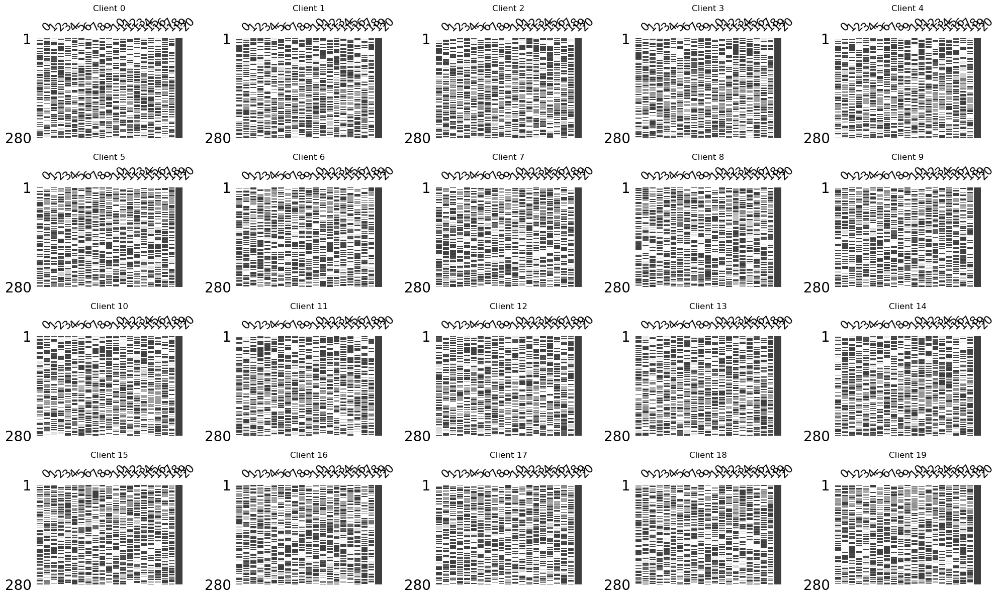

In [10]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_sigmoid_lr@sp=extreme_r=0.05'
config2['data_partition']['strategy'] = 'sample@p=280'
config2['agg_strategy_imp']['strategy'] = 'fedavg-s'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients2)

<Axes: ylabel='Count'>

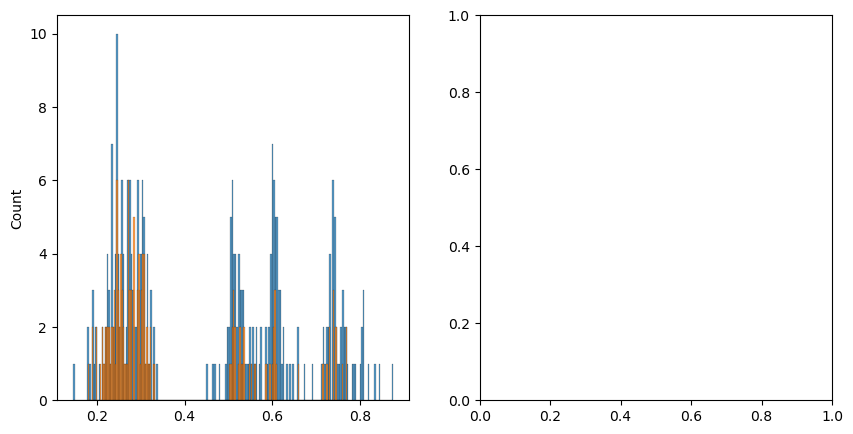

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.histplot(x = clients[0].X_train[:, 3], bins = 200, ax = ax[0])
sns.histplot(x = clients[0].X_train[:, 3][clients[0].missing_mask[:,3]], bins = 200, ax = ax[0])

In [50]:
configuration['agg_strategy_imp']['strategy'] = 'local'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret0 = server.run()
trackers['mnar_lr_local'] = server.stats_tracker
rets['mnar_lr_local'] = ret0

2023-07-21 02:35:21.363 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 122.05880950007122


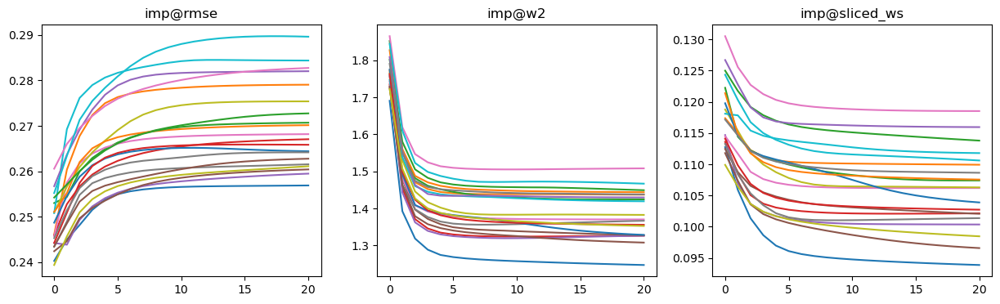

{'imp@rmse': 0.2698312035734405,
 'imp@ws': 1.386060079715998,
 'imp@sliced_ws': 0.10599868247090427}

In [51]:
vis_imp(ret0)
ret0['imp_result']

### Simple Averaging

sample {'p': '500'}
0.01939111886755866 25785


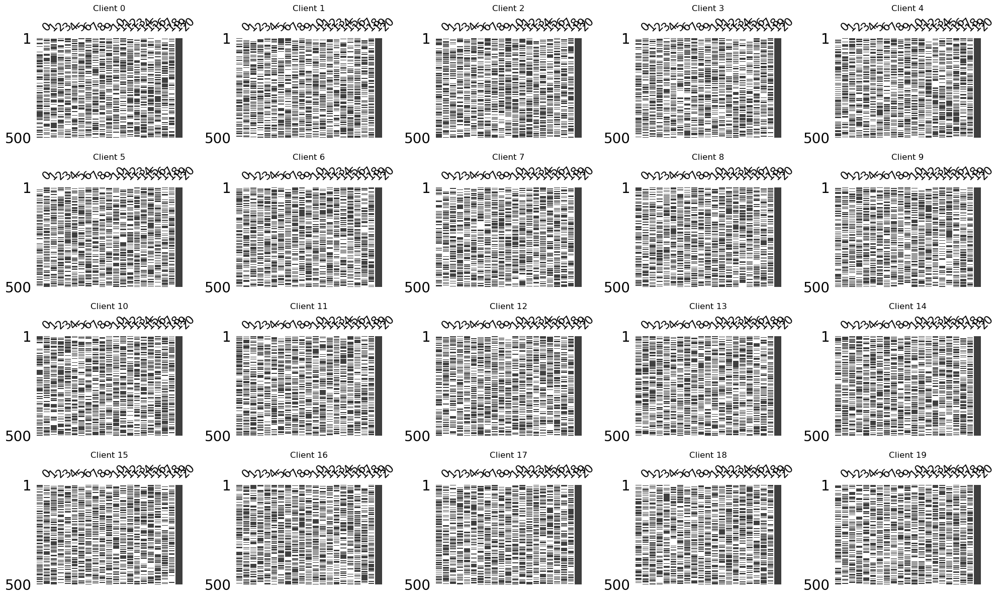

In [51]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_sigmoid_lr@sp=extreme_r=0.25'
config2['data_partition']['strategy'] = 'sample@p=500'
config2['agg_strategy_imp']['strategy'] = 'fedavg-s'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients2)

In [52]:
configuration['agg_strategy_imp']['strategy'] = 'fedavg-s'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret2 = server.run()
trackers['mnar_lr_simpleavg'] = server.stats_tracker
rets['mnar_lr_simpleavg'] = ret2

2023-07-21 03:51:42.919 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 129.39867550006602


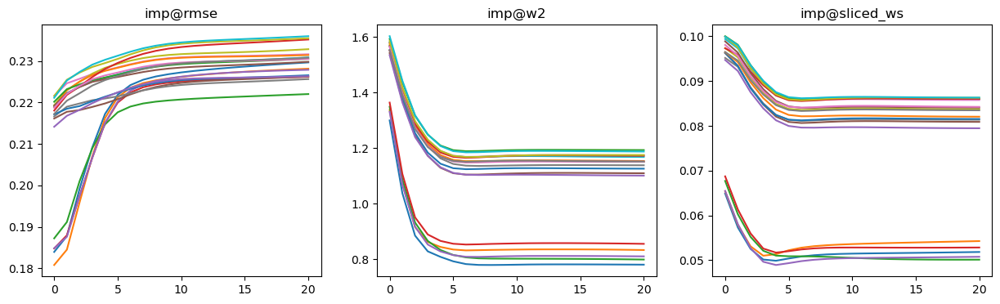

{'imp@rmse': 0.22945771300443984,
 'imp@ws': 1.0690665524283378,
 'imp@sliced_ws': 0.0758527659149168}

In [53]:
vis_imp(ret2)
ret2['imp_result']

In [54]:
sklearn_evaluation(ret2)

Accuracy imputed centralized MLP:0.8221 (0.013)
Accuracy imputed centralized LR:0.8190 (0.000)
Accuracy orignal centralized MLP:0.9439 (0.005)
Accuracy orignal centralized MLP:0.8717 (0.000)


In [65]:
clients_ = {}
data_imp = ret2['data']['imputed_data']
missing_mask = ret2['data']['missing_mask']
data_true = ret2['data']['origin_data']
n_clients = ret2['data']['origin_data'].shape[0]
test_data = ret2['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret2 = server.prediction()

2023-07-19 09:28:36.629 | INFO     | src.fed_imp.sub_modules.server.server_fedavg:prediction:154 - Round: 50, test_accu: 0.7662, test_f1: 0.7657, val_loss: 0.6019, val_accu: 0.6462, val_f1: 0.6455
2023-07-19 09:29:03.612 | INFO     | src.fed_imp.sub_modules.server.server_fedavg:prediction:154 - Round: 100, test_accu: 0.7636, test_f1: 0.7635, val_loss: 0.5723, val_accu: 0.6654, val_f1: 0.6651
2023-07-19 09:29:29.434 | INFO     | src.fed_imp.sub_modules.server.server_fedavg:prediction:154 - Round: 150, test_accu: 0.7690, test_f1: 0.7689, val_loss: 0.5644, val_accu: 0.6673, val_f1: 0.6672
2023-07-19 09:29:55.311 | INFO     | src.fed_imp.sub_modules.server.server_fedavg:prediction:154 - Round: 200, test_accu: 0.7784, test_f1: 0.7784, val_loss: 0.5641, val_accu: 0.6692, val_f1: 0.6687


### Complementary Models

In [59]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_sigmoid_lr@sp=extreme_r=0.05'
config2['data_partition']['strategy'] = 'sample@p=280'
config2['agg_strategy_imp']['strategy'] = 'testavg3'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)

sample {'p': '280'}
0.010859026565832848 25785


In [60]:
configuration['agg_strategy_imp']['strategy'] = 'testavg3'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret4 = server.run()
rets['mnar_lr_complementary'] = ret4
trackers['mnar_lr_complementary'] = server.stats_tracker

testavg3


2023-07-21 02:44:16.641 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 110.1462695999071


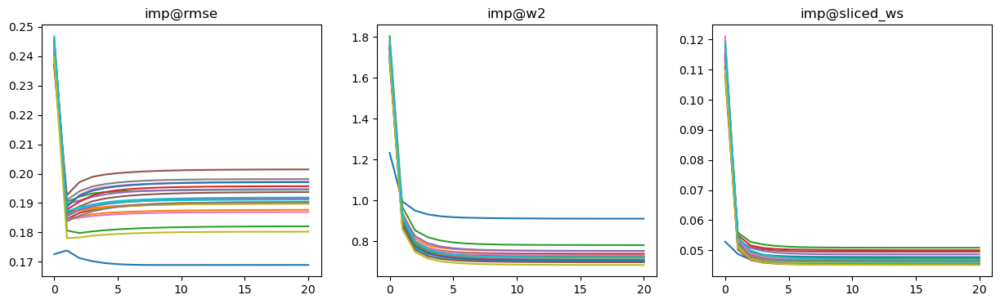

{'imp@rmse': 0.1906628325249464,
 'imp@ws': 0.7313292878389128,
 'imp@sliced_ws': 0.047169837302404066}

In [61]:
vis_imp(ret4)
ret4['imp_result']

In [760]:
sklearn_evaluation(ret4)

Accuracy imputed centralized MLP:0.9048 (0.002)
Accuracy imputed centralized LR:0.8589 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


In [42]:
clients_ = {}
data_imp2 = ret4['data']['imputed_data']
missing_mask2 = ret4['data']['missing_mask']
data_true2 = ret4['data']['origin_data']
n_clients = ret4['data']['origin_data'].shape[0]
test_data4 = ret4['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp2[client_id],
        missing_mask=missing_mask2[client_id],
        data_true=data_true2[client_id],
        data_test=test_data4
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data4
    )

pred_ret2 = server_.prediction()

2023-07-19 02:52:00.793 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8297, test_f1: 0.8296, val_loss: 0.5619, val_accu: 0.7192, val_f1: 0.7187
2023-07-19 02:53:38.154 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8409, test_f1: 0.8409, val_loss: 0.5360, val_accu: 0.7330, val_f1: 0.7328
2023-07-19 02:55:16.488 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8520, test_f1: 0.8519, val_loss: 0.5298, val_accu: 0.7394, val_f1: 0.7394
2023-07-19 02:56:53.952 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8548, test_f1: 0.8546, val_loss: 0.5265, val_accu: 0.7401, val_f1: 0.7401
2023-07-19 02:58:31.282 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8617, test_f1: 0.861

### Our Method

In [47]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_sigmoid_lr@sp=extreme_r=0.25'
config2['data_partition']['strategy'] = 'sample@p=500'
config2['agg_strategy_imp']['strategy'] = 'testavg3'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)

sample {'p': '500'}
0.01939111886755866 25785


In [48]:
configuration['agg_strategy_imp']['strategy'] = 'fedmechw'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True
configuration['algo_params']["fedmechw"] = {
    "client_thres": 0.4,
    "alpha": 1.0,
    "beta": 0
}

configuration['algo_params']["scale_factor"] = 4

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret9 = server.run()
trackers['mnar_lr_fedmechw'] = server.stats_tracker
rets['mnar_lr_fedmechw'] = ret9

2023-07-21 03:48:10.362 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 147.34417539997958


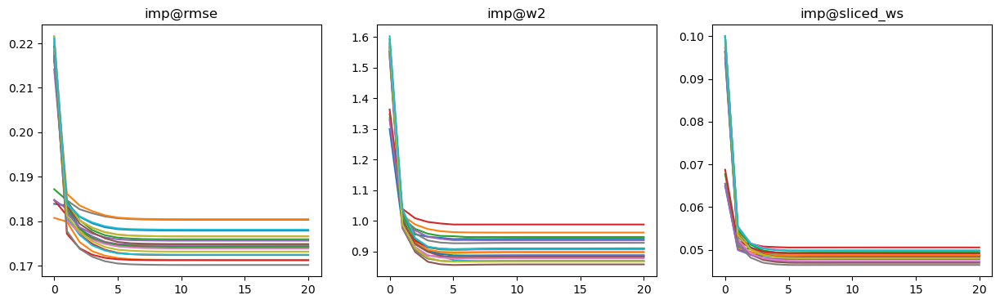

{'imp@rmse': 0.17495550207181995,
 'imp@ws': 0.9070919364494834,
 'imp@sliced_ws': 0.048433257335684876}

In [49]:
vis_imp(ret9)
ret9['imp_result']

In [46]:
sklearn_evaluation(ret9)

Accuracy imputed centralized MLP:0.8479 (0.013)
Accuracy imputed centralized LR:0.8528 (0.000)
Accuracy orignal centralized MLP:0.9439 (0.005)
Accuracy orignal centralized MLP:0.8717 (0.000)


In [45]:
clients_ = {}
data_imp = ret9['data']['imputed_data']
missing_mask = ret9['data']['missing_mask']
data_true = ret9['data']['origin_data']
n_clients = ret9['data']['origin_data'].shape[0]
test_data = ret9['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret2 = server_.prediction()

2023-07-19 08:45:22.275 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.7733, test_f1: 0.7713, val_loss: 0.5815, val_accu: 0.7029, val_f1: 0.7029
2023-07-19 08:46:02.047 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8008, test_f1: 0.7994, val_loss: 0.5362, val_accu: 0.7106, val_f1: 0.7104
2023-07-19 08:46:40.222 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8182, test_f1: 0.8175, val_loss: 0.5268, val_accu: 0.7212, val_f1: 0.7211
2023-07-19 08:47:19.003 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8268, test_f1: 0.8264, val_loss: 0.5236, val_accu: 0.7298, val_f1: 0.7298
2023-07-19 08:47:58.036 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8299, test_f1: 0.829

## MNAR RL

### Local

sample {'p': '0.01'}
['mnar_quantile_right' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


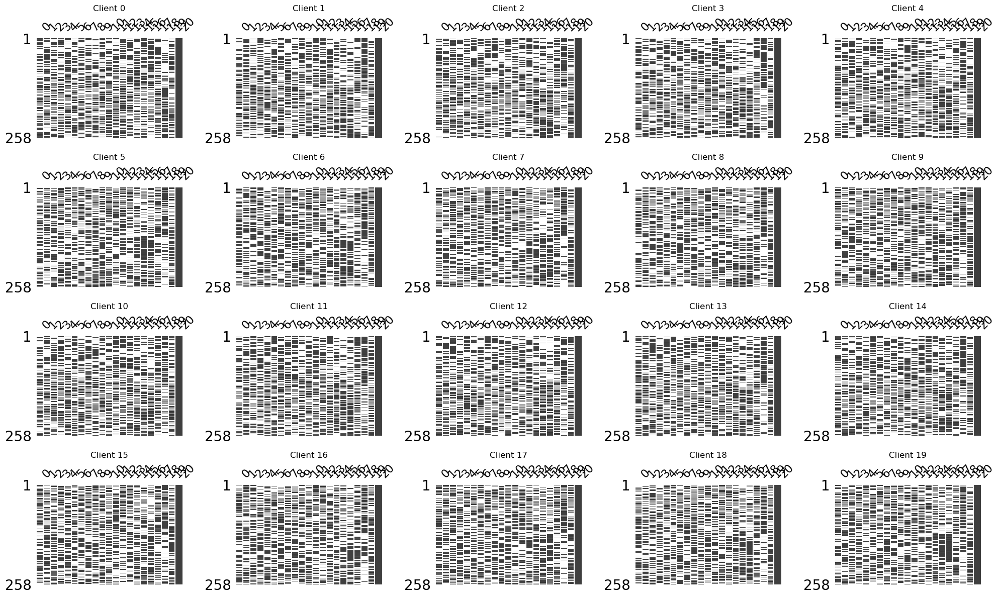

In [763]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_rl@sp=extreme2'
config2['data_partition']['strategy'] = 'sample@p=0.01'
config2['agg_strategy_imp']['strategy'] = 'fedavg-s'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients2)

In [764]:
configuration['agg_strategy_imp']['strategy'] = 'local'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret03 = server.run()
trackers['mnar_rl_local'] = server.stats_tracker
rets['mnar_rl_local'] = ret03

2023-07-20 18:36:50.066 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 107.61499370005913


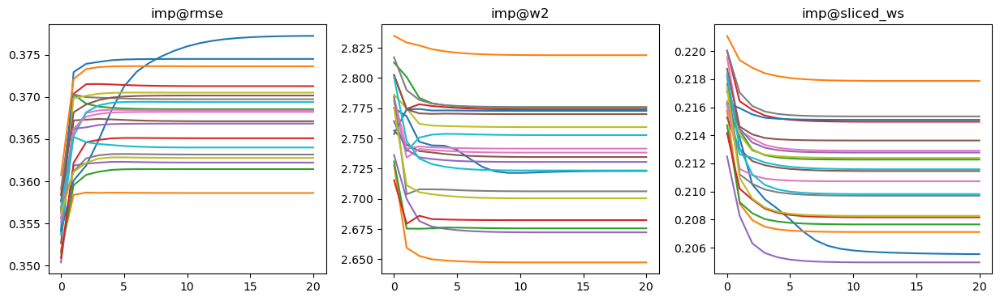

{'imp@rmse': 0.3676408282680112,
 'imp@ws': 2.7337592951397522,
 'imp@sliced_ws': 0.21111153099025848}

In [765]:
vis_imp(ret03)
ret03['imp_result']

### Simple Averaging

sample {'p': '280'}
0.010859026565832848 25785


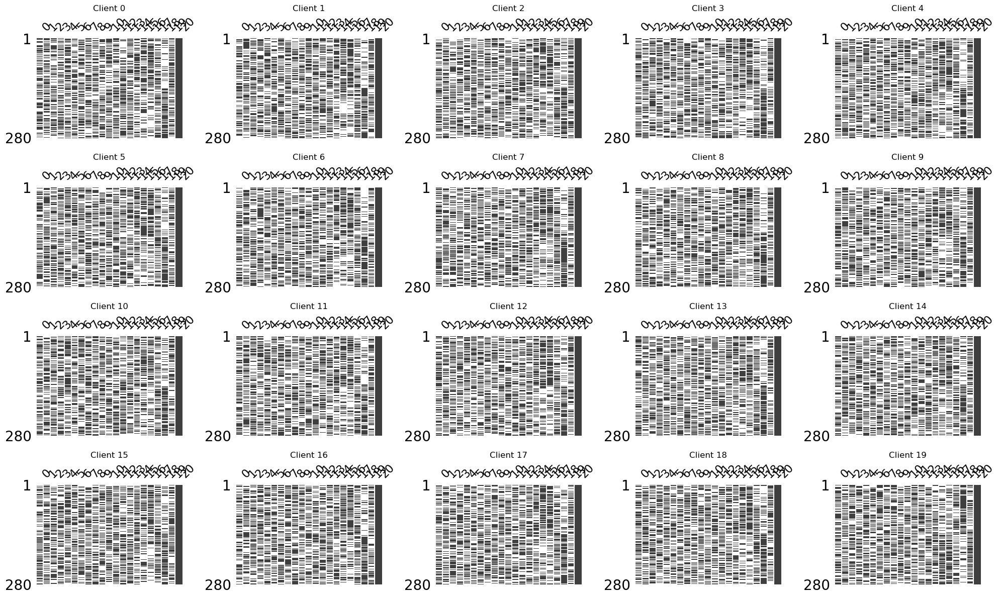

In [17]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_rl@sp=extreme_r=0.95'
config2['data_partition']['strategy'] = 'sample@p=280'
config2['agg_strategy_imp']['strategy'] = 'fedavg-s'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)

visualize_ms(data_ms_clients2)

In [18]:
configuration['agg_strategy_imp']['strategy'] = 'fedavg-s'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret5 = server.run()
trackers['mnar_rl_simpleavg'] = server.stats_tracker
rets['mnar_rl_simpleavg'] = ret5

2023-07-21 03:20:15.974 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 106.8431438000407


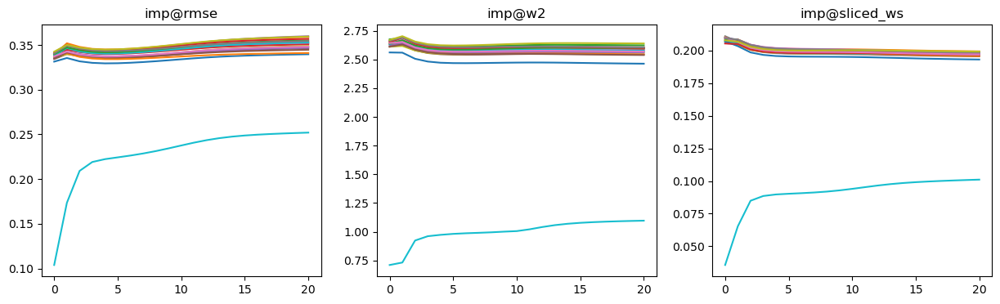

{'imp@rmse': 0.3453223290389702, 'imp@ws': 2.5043021181580696, 'imp@sliced_ws': 0.19280970920888177}


In [20]:
vis_imp(ret5)
print(ret5['imp_result'])

In [21]:
sklearn_evaluation(ret5)

Accuracy imputed centralized MLP:0.6607 (0.016)
Accuracy imputed centralized LR:0.7533 (0.000)
Accuracy orignal centralized MLP:0.9406 (0.005)
Accuracy orignal centralized MLP:0.8703 (0.000)


In [71]:
clients_ = {}
data_imp = ret5['data']['imputed_data']
missing_mask = ret5['data']['missing_mask']
data_true = ret5['data']['origin_data']
n_client = ret5['data']['origin_data'].shape[0]
test_data = ret5['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret5 = server_.prediction()

2023-07-19 09:42:30.559 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.6611, test_f1: 0.6589, val_loss: 0.6815, val_accu: 0.6000, val_f1: 0.5966
2023-07-19 09:43:09.122 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.7392, test_f1: 0.7336, val_loss: 0.6450, val_accu: 0.6433, val_f1: 0.6403
2023-07-19 09:43:47.742 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.7366, test_f1: 0.7296, val_loss: 0.6323, val_accu: 0.6452, val_f1: 0.6413
2023-07-19 09:44:25.684 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.7431, test_f1: 0.7367, val_loss: 0.6263, val_accu: 0.6548, val_f1: 0.6535
2023-07-19 09:45:04.481 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.7385, test_f1: 0.732

### Complementary Models without exchanging initialization

In [770]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_rl@sp=extreme2'
config2['data_partition']['strategy'] = 'sample@p=0.01'
config2['agg_strategy_imp']['strategy'] = 'testavg3'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)

sample {'p': '0.01'}
['mnar_quantile_right' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left' 'mnar_quantile_left'
 'mnar_quantile_left' 'mnar_quantile_left']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


In [771]:
configuration['agg_strategy_imp']['strategy'] = 'testavg3'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret6 = server.run()
trackers['mnar_rl_complementary'] = copy.deepcopy(server.stats_tracker)
rets['mnar_rl_complementary'] = ret6

testavg3


2023-07-20 18:41:52.047 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 108.81526020006277


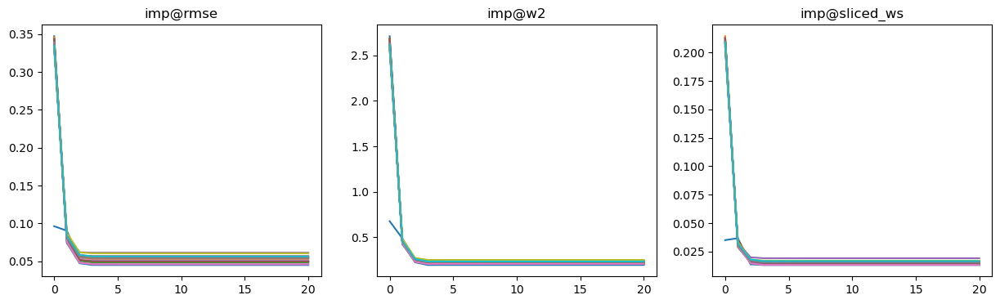

{'imp@rmse': 0.052287365541322676,
 'imp@ws': 0.2237490117649314,
 'imp@sliced_ws': 0.015184065911711812}

In [772]:
vis_imp(ret6)
ret6['imp_result']

In [773]:
sklearn_evaluation(ret6)

Accuracy imputed centralized MLP:0.9082 (0.007)
Accuracy imputed centralized LR:0.8602 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


In [774]:
clients_ = {}
data_imp = ret6['data']['imputed_data']
missing_mask = ret6['data']['missing_mask']
data_true = ret6['data']['origin_data']
n_clients = ret6['data']['origin_data'].shape[0]
test_data = ret6['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret6 = server_.prediction()

2023-07-20 18:43:37.026 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8391, test_f1: 0.8387, val_loss: 0.4549, val_accu: 0.8135, val_f1: 0.8130
2023-07-20 18:44:16.040 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8465, test_f1: 0.8463, val_loss: 0.4144, val_accu: 0.8231, val_f1: 0.8228


KeyboardInterrupt: 

### Our Method

In [22]:
config2 = experiment_config_template.copy()
config2['data']['dataset_name'] = 'ijcnn_balanced_pca'
config2['num_clients'] = 20
config2['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config2['missing_simulate']['mf_strategy'] = 'all'
config2['missing_simulate']['mm_strategy'] = 'mnar_rl@sp=extreme_r=0.95'
config2['data_partition']['strategy'] = 'sample@p=280'
config2['agg_strategy_imp']['strategy'] = 'fedmechw'

configuration = config2
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients2 = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients2, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)

sample {'p': '280'}
0.010859026565832848 25785


In [23]:
configuration['agg_strategy_imp']['strategy'] = 'fedmechw'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True
configuration['algo_params']["fedmechw"] = {
    "client_thres": 1.0,
    "alpha": 1.0,
    "beta": 0
}
configuration['algo_params']["scale_factor"] = 4

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret10 = server.run()
trackers['mnar_rl_fedmechw'] = copy.deepcopy(server.stats_tracker)
rets['mnar_rl_fedmechw'] = ret10

2023-07-21 03:24:24.167 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 114.35314090002794


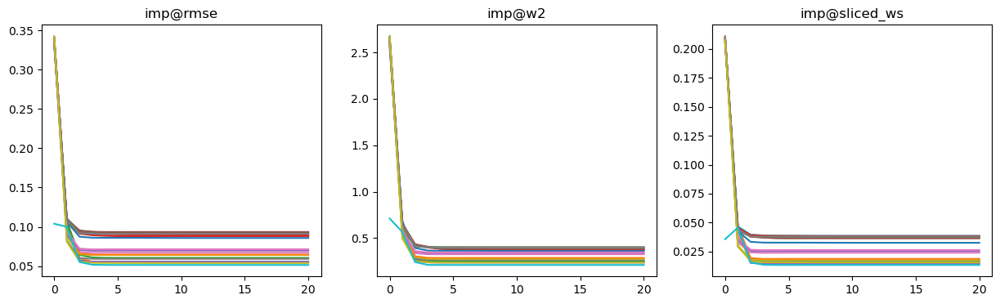

{'imp@rmse': 0.0725836725468757,
 'imp@ws': 0.3178721616750826,
 'imp@sliced_ws': 0.025867515758821878}

In [24]:
vis_imp(ret10)
ret10['imp_result']

In [25]:
sklearn_evaluation(ret10)

Accuracy imputed centralized MLP:0.9069 (0.011)
Accuracy imputed centralized LR:0.8630 (0.000)
Accuracy orignal centralized MLP:0.9406 (0.005)
Accuracy orignal centralized MLP:0.8703 (0.000)


In [58]:
clients_ = {}
data_imp = ret10['data']['imputed_data']
missing_mask = ret10['data']['missing_mask']
data_true = ret10['data']['origin_data']
n_clients = ret10['data']['origin_data'].shape[0]
test_data = ret10['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 1000
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret2 = server_.prediction()

2023-07-19 09:07:52.502 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8014, test_f1: 0.8013, val_loss: 0.5364, val_accu: 0.7423, val_f1: 0.7391
2023-07-19 09:08:30.196 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8416, test_f1: 0.8416, val_loss: 0.4812, val_accu: 0.7702, val_f1: 0.7684
2023-07-19 09:09:08.298 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8473, test_f1: 0.8472, val_loss: 0.4659, val_accu: 0.7779, val_f1: 0.7764
2023-07-19 09:09:47.071 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8489, test_f1: 0.8488, val_loss: 0.4586, val_accu: 0.7846, val_f1: 0.7836
2023-07-19 09:10:24.968 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8478, test_f1: 0.847

## MARY Sigmoid LR - more patterns

### Local

sample {'p': '0.01'}
['mary_sigmoid_left' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


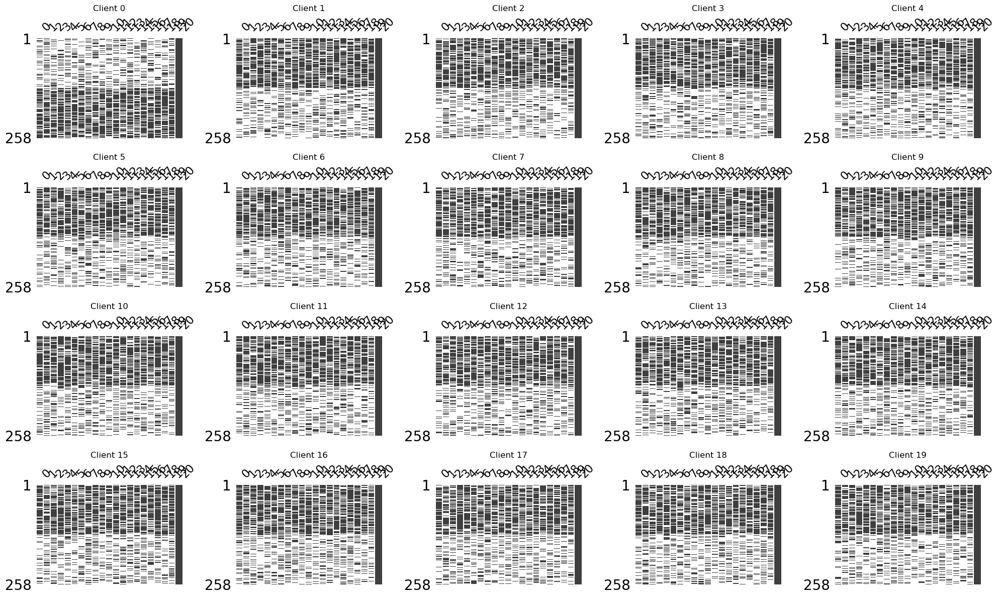

In [779]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_lr@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [780]:
configuration['agg_strategy_imp']['strategy'] = 'local'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret02 = server.run()
trackers['mary_sigmoid_lr_local'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_lr_local'] = ret02

2023-07-20 18:49:50.518 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 105.52946370001882


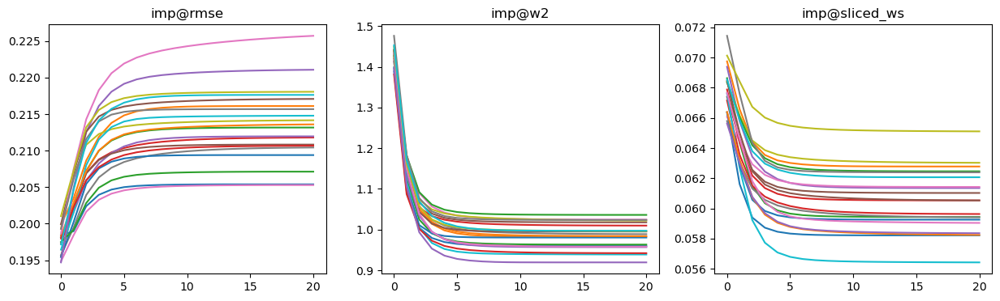

{'imp@rmse': 0.2134757510392935,
 'imp@ws': 0.9847937592601183,
 'imp@sliced_ws': 0.06053988545548172}

In [781]:
vis_imp(ret02)
ret02['imp_result']

In [782]:
sklearn_evaluation(ret02)

Accuracy imputed centralized MLP:0.5969 (0.012)
Accuracy imputed centralized LR:0.8212 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


### Simple Averaging

sample {'p': '0.01'}
['mary_sigmoid_left' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


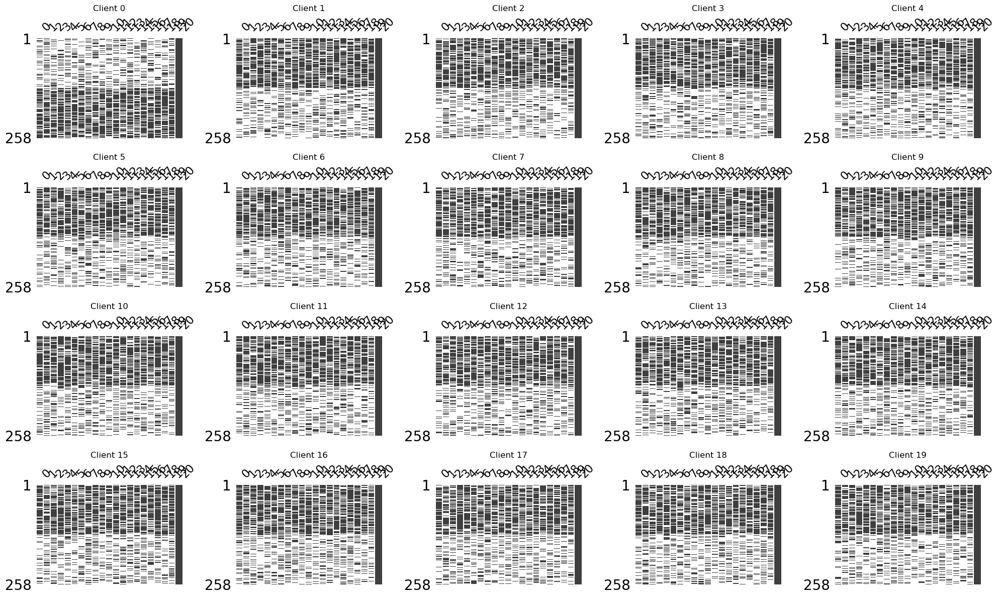

In [783]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_lr@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [784]:
configuration['agg_strategy_imp']['strategy'] = 'fedavg-s'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret7 = server.run()
trackers['mary_sigmoid_lr_simpleavg'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_lr_simpleavg'] = ret7

2023-07-20 18:52:56.595 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 104.52831229998264


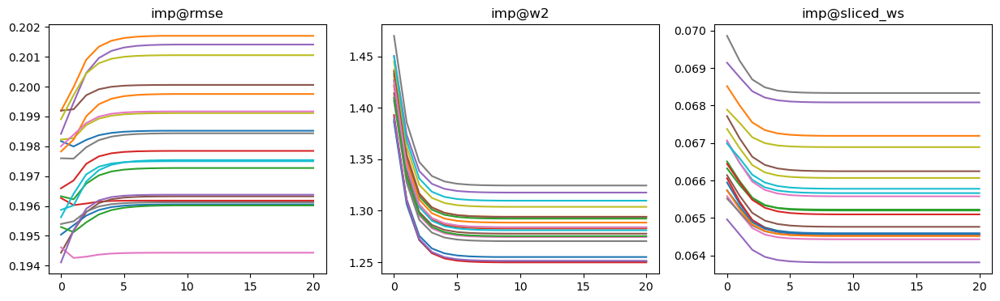

{'imp@rmse': 0.1980437185775697,
 'imp@ws': 1.2830864393036916,
 'imp@sliced_ws': 0.0655569356345535}

In [785]:
vis_imp(ret7)
ret7['imp_result']

In [786]:
sklearn_evaluation(ret7)

Accuracy imputed centralized MLP:0.5898 (0.007)
Accuracy imputed centralized LR:0.8319 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


In [787]:
clients_ = {}
data_imp = ret7['data']['imputed_data']
missing_mask = ret7['data']['missing_mask']
data_true = ret7['data']['origin_data']
n_client = ret7['data']['origin_data'].shape[0]
test_data = ret7['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 500
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret7 = server_.prediction()

KeyboardInterrupt: 

### Complementary models

sample {'p': '0.01'}
['mary_sigmoid_left' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


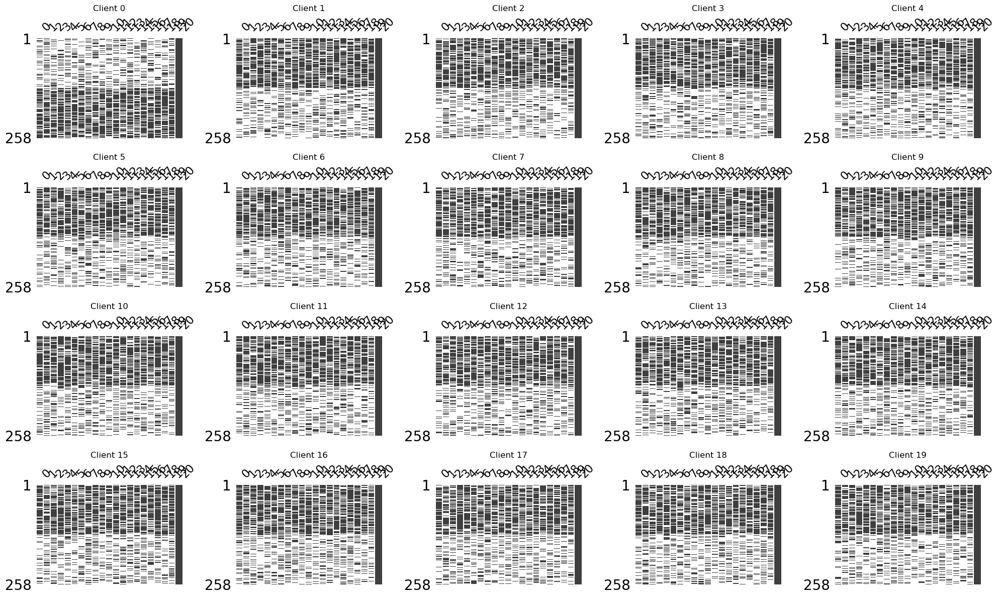

In [788]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_lr@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [789]:
configuration['agg_strategy_imp']['strategy'] = 'testavg3'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret8 = server.run()
trackers['mary_sigmoid_lr_complementary'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_lr_complementary'] = ret8

testavg3


2023-07-20 18:56:13.517 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 106.99592469993513


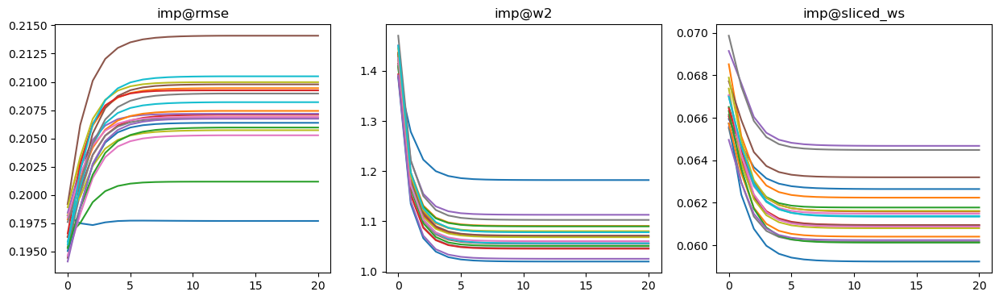

{'imp@rmse': 0.20722819286765076,
 'imp@ws': 1.0720626951872048,
 'imp@sliced_ws': 0.06151272332522049}

In [790]:
vis_imp(ret8)
ret8['imp_result']

In [791]:
sklearn_evaluation(ret8)

Accuracy imputed centralized MLP:0.5868 (0.022)
Accuracy imputed centralized LR:0.8029 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


In [84]:
clients_ = {}
data_imp = ret8['data']['imputed_data']
missing_mask = ret8['data']['missing_mask']
data_true = ret8['data']['origin_data']
n_client = ret8['data']['origin_data'].shape[0]
test_data = ret8['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 500
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret8 = server_.prediction()

2023-07-19 10:08:25.350 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.5934, test_f1: 0.5212, val_loss: 0.4161, val_accu: 0.8163, val_f1: 0.8163
2023-07-19 10:09:01.946 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.6116, test_f1: 0.5467, val_loss: 0.3697, val_accu: 0.8317, val_f1: 0.8314
2023-07-19 10:09:37.857 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.6151, test_f1: 0.5520, val_loss: 0.3569, val_accu: 0.8394, val_f1: 0.8391
2023-07-19 10:10:14.146 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.6091, test_f1: 0.5416, val_loss: 0.3519, val_accu: 0.8442, val_f1: 0.8438
2023-07-19 10:10:53.064 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.5961, test_f1: 0.519

### Our Method

sample {'p': '0.01'}
['mary_sigmoid_left' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right' 'mary_sigmoid_right'
 'mary_sigmoid_right' 'mary_sigmoid_right']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


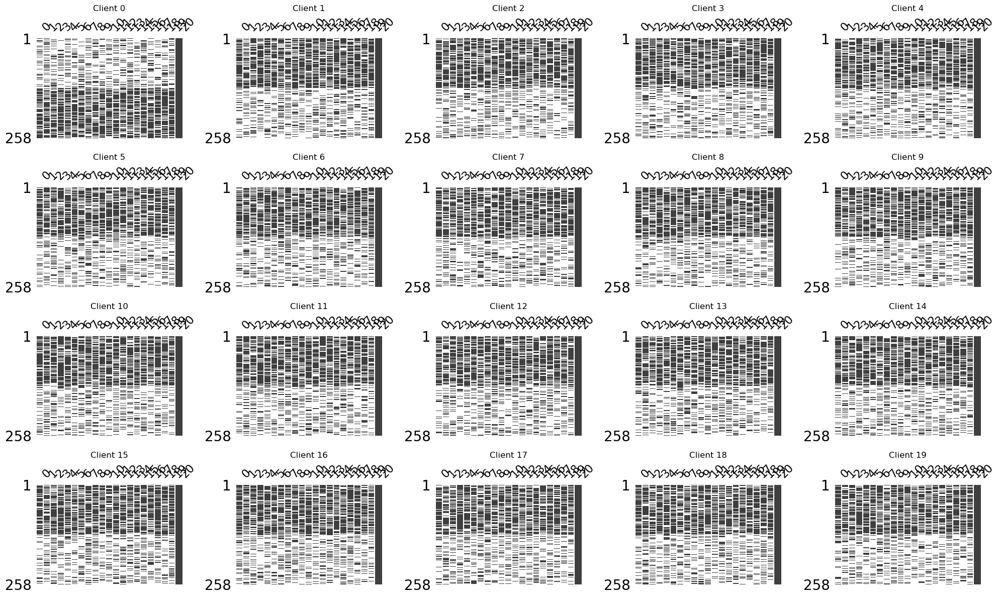

In [792]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_lr@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [793]:
configuration['agg_strategy_imp']['strategy'] = 'fedmechw'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

configuration['algo_params']["fedmechw"] = {
    "client_thres": 1.0,
    "alpha": 1.0,
    "beta": 0
}

configuration['algo_params']["scale_factor"] = 6

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret12 = server.run()
trackers['mary_sigmoid_lr_fedmechw'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_lr_fedmechw'] = ret12

2023-07-20 18:59:19.863 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 107.92160450003576


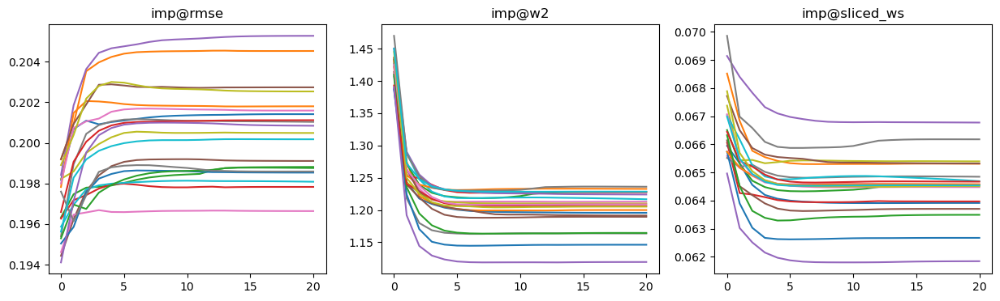

{'imp@rmse': 0.20049727928498584,
 'imp@ws': 1.2003998078797116,
 'imp@sliced_ws': 0.06450341944279935}

In [794]:
vis_imp(ret12)
ret12['imp_result']

In [795]:
sklearn_evaluation(ret12)

Accuracy imputed centralized MLP:0.5762 (0.017)
Accuracy imputed centralized LR:0.8297 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


In [89]:
clients_ = {}
data_imp = ret12['data']['imputed_data']
missing_mask = ret12['data']['missing_mask']
data_true = ret12['data']['origin_data']
n_client = ret12['data']['origin_data'].shape[0]
test_data = ret12['data']['test_data']
for client_id in range(n_clients):
    clients_[client_id] = SimpleClient(
        client_id=client_id,
        data_imp=data_imp[client_id],
        missing_mask=missing_mask[client_id],
        data_true=data_true[client_id],
        data_test=test_data
    )

pred_config = server_config_tmpl.copy()
server_name = 'fedavg_mlp_pytorch_pred'
server_pred_config = pred_config['server_pred_config']
server_pred_config['train_params']['pred_round'] = 500
server_config = pred_config['server_config']
server_ = load_server(
        server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
        test_data=test_data
    )

pred_ret8 = server_.prediction()

2023-07-19 10:16:31.428 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.5978, test_f1: 0.5278, val_loss: 0.4120, val_accu: 0.8202, val_f1: 0.8201
2023-07-19 10:17:07.093 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.6108, test_f1: 0.5458, val_loss: 0.3640, val_accu: 0.8346, val_f1: 0.8345
2023-07-19 10:17:44.731 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.6123, test_f1: 0.5477, val_loss: 0.3509, val_accu: 0.8423, val_f1: 0.8421
2023-07-19 10:18:23.222 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.6040, test_f1: 0.5331, val_loss: 0.3423, val_accu: 0.8452, val_f1: 0.8451
2023-07-19 10:19:03.200 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.6100, test_f1: 0.542

## MARY Quantile

sample {'p': '0.01'}
['mary_left' 'mary_left' 'mary_right' 'mary_right' 'mary_right'
 'mary_right' 'mary_right' 'mary_right' 'mary_right' 'mary_right'
 'mary_right' 'mary_right' 'mary_right' 'mary_right' 'mary_right'
 'mary_right' 'mary_right' 'mary_right' 'mary_right' 'mary_right']


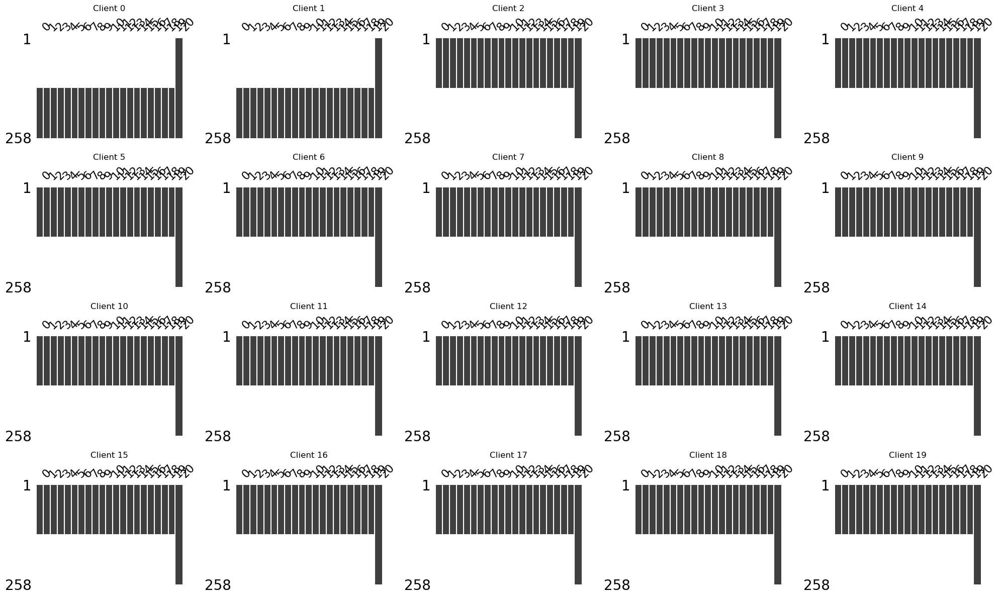

In [80]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_lr@sp=extreme'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

### Simple Averaging

In [81]:
configuration['agg_strategy_imp']['strategy'] = 'fedavg-s'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret13 = server.run()

2023-07-19 21:26:51.080 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 109.99541610002052


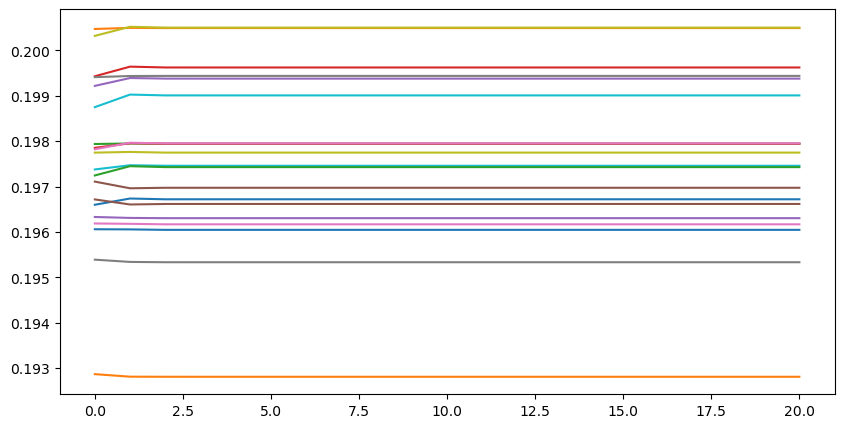

In [82]:
x = list(range(len(ret13['client_imp_history'])))
client_ids = list(ret13['client_imp_history'][0][2]['metrics'].keys())

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
for client_id in client_ids:
    y = [ret13['client_imp_history'][i][2]['metrics'][client_id]['imp@rmse'] for i in x]
    ax.plot(x, y, label=client_id)
plt.show()

### Complentary Models

In [92]:
configuration['agg_strategy_imp']['strategy'] = 'testavg2'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret14 = server.run()

testavg2


2023-07-19 10:25:52.682 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 101.22823510004673


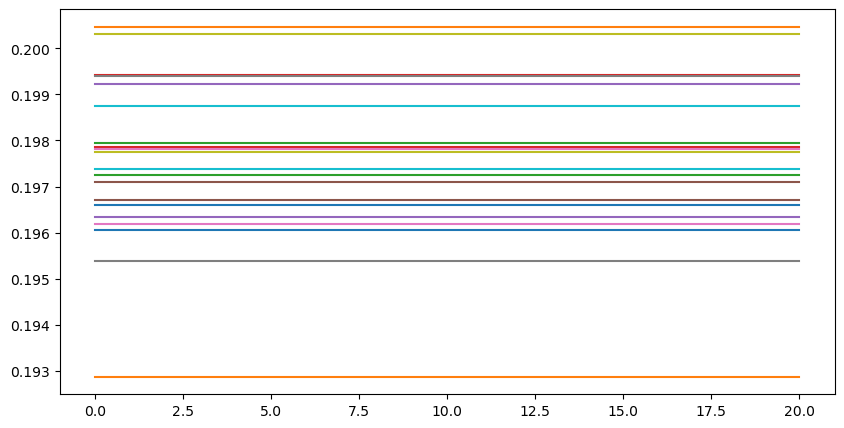

In [94]:
x = list(range(len(ret14['client_imp_history'])))
client_ids = list(ret14['client_imp_history'][0][2]['metrics'].keys())

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
for client_id in client_ids:
    y = [ret14['client_imp_history'][i][2]['metrics'][client_id]['imp@rmse'] for i in x]
    ax.plot(x, y, label=client_id)
plt.show()

## MARY RL

sample {'p': '0.01'}
['mary_sigmoid_right' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left']


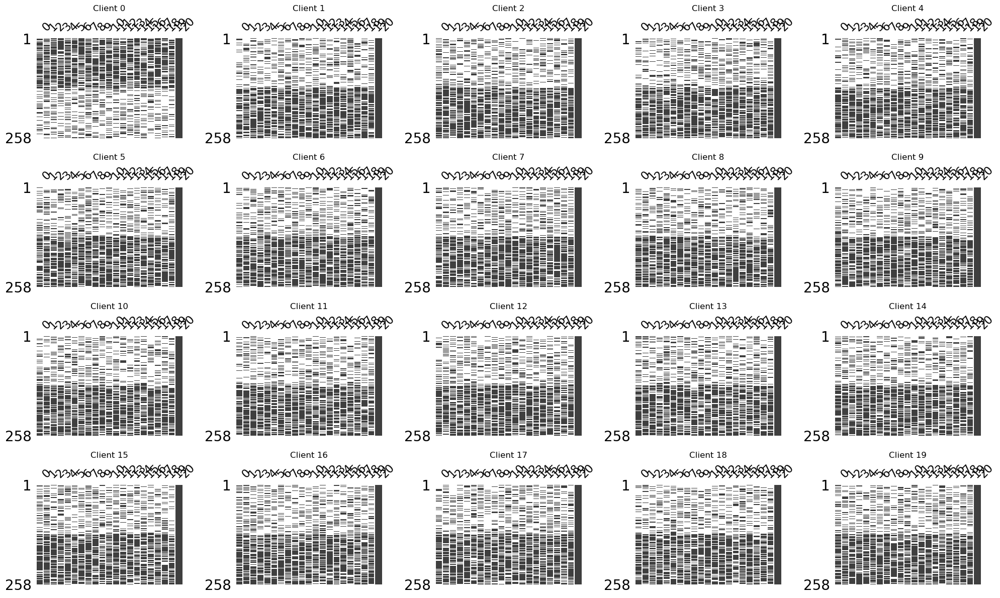

In [83]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_rl@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

### Simple Averaging

In [84]:
configuration['agg_strategy_imp']['strategy'] = 'fedavg-s'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret15 = server.run()
trackers['mary_sigmoid_rl_simpleavg'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_rl_simpleavg'] = ret15

2023-07-19 21:28:59.850 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 110.28940940002212


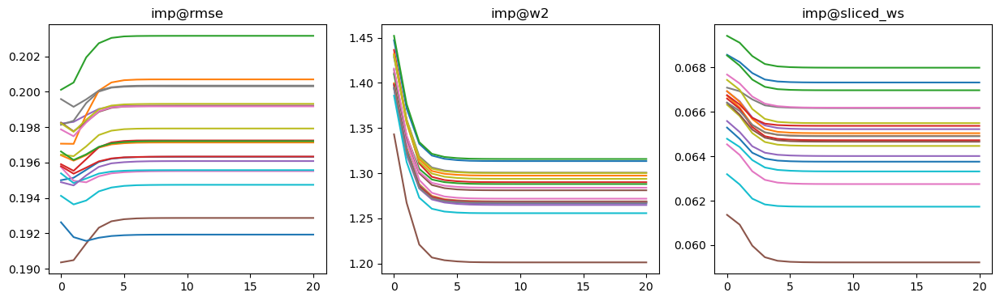

{'imp@rmse': 0.19751578716505871,
 'imp@ws': 1.2782467416192942,
 'imp@sliced_ws': 0.0647108497892338}

In [85]:
vis_imp(ret15)
ret15['imp_result']

In [86]:
sklearn_evaluation(ret15)

Accuracy imputed centralized MLP:0.6225 (0.013)
Accuracy imputed centralized LR:0.7930 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


### Complementary Models

sample {'p': '0.01'}
['mary_sigmoid_right' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left']


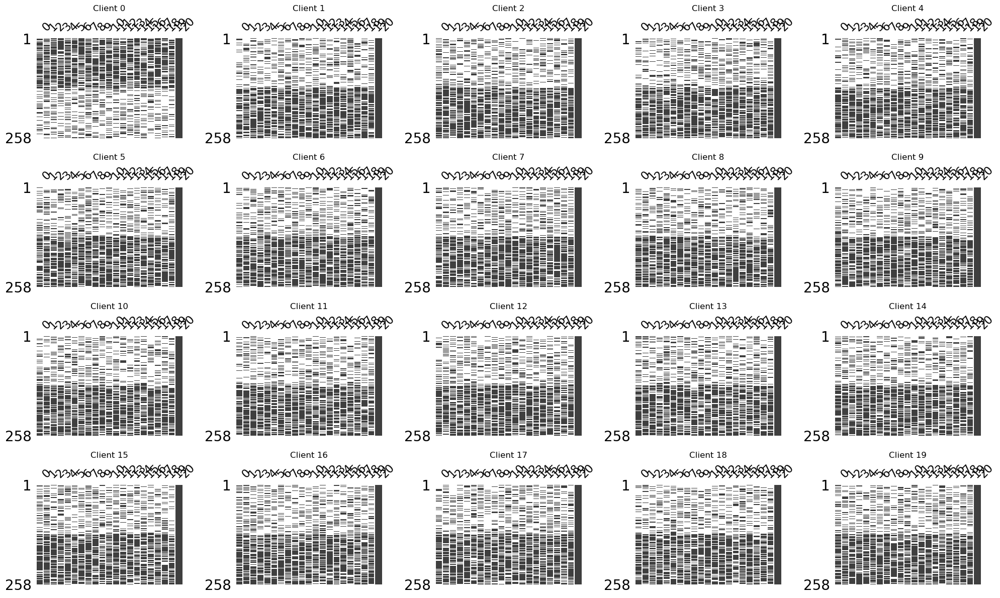

In [87]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_rl@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [88]:
configuration['agg_strategy_imp']['strategy'] = 'testavg3'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret16 = server.run()
trackers['mary_sigmoid_rl_complementary'] = copy.deepcopy(server.stats_tracker)
rets['mary_sigmoid_rl_complementary'] = ret16

testavg3


2023-07-19 21:32:16.375 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 112.34481119998964


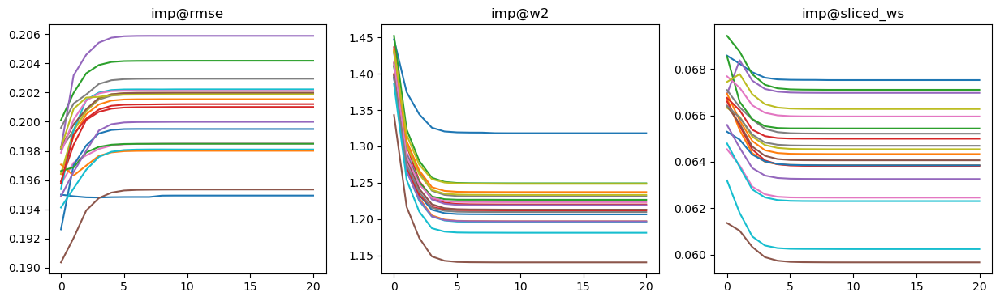

In [89]:
vis_imp(ret16)

In [90]:
sklearn_evaluation(ret16)

Accuracy imputed centralized MLP:0.6080 (0.009)
Accuracy imputed centralized LR:0.8442 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


### Our Method

sample {'p': '0.01'}
['mary_sigmoid_right' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left' 'mary_sigmoid_left'
 'mary_sigmoid_left' 'mary_sigmoid_left']
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv
ridge logistic_cv


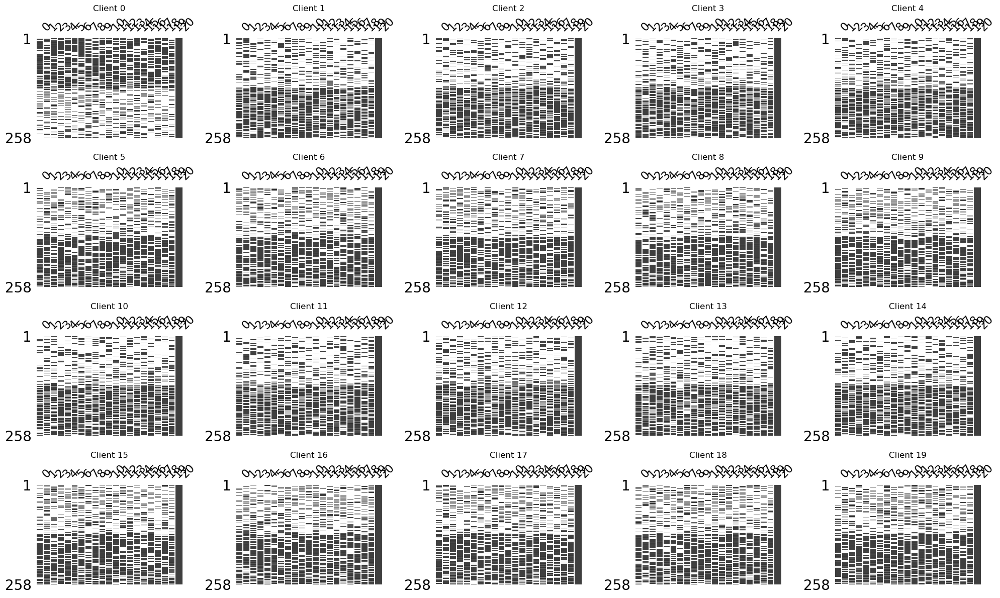

In [796]:
config = experiment_config_template.copy()
config['data']['dataset_name'] = 'ijcnn_balanced_pca'
config['num_clients'] = 20
config['missing_simulate']['mr_strategy'] = 'fixed@mr=0.5'
config['missing_simulate']['mf_strategy'] = 'all'
config['missing_simulate']['mm_strategy'] = 'mary_sigmoid_rl@sp=extreme2'
config['data_partition']['strategy'] = 'sample@p=0.01'

configuration = config
num_clients = configuration['num_clients']
# set random seed
seed = configuration['experiment']['seed']
mtp = configuration['experiment']['mtp']
tune_params = configuration['tune_params']
random.seed(seed)  # seed for split data

# load data
dataset_params = configuration['data']
data, data_config = load_data(**dataset_params)
regression = data_config['task_type'] == 'regression'

n_rounds = configuration['experiment']['n_rounds']
test_size = configuration['experiment'].get('test_size', 0.1)
if n_rounds == 1:
    n_rounds_data = split_train_test(data, n_folds=2, seed=seed, test_size=test_size, regression=regression)
else:
    n_rounds_data = split_train_test(
        data, n_folds=n_rounds, seed=seed, test_size=test_size, regression=regression
        )

# n rounds average
train_data, test_data = n_rounds_data[0]

new_seed = (seed + 10087 * 0) % (2 ^ 23)
regression = data_config['task_type'] == 'regression'
data_partition_params = configuration['data_partition']
data_partitions = data_partition(
    **data_partition_params, data=train_data.values, n_clients=num_clients, seed=new_seed,
    regression=regression
)
missing_params = configuration['missing_simulate']
cols = np.arange(0, train_data.shape[1] - 1)
scenario = missing_params
data_ms_clients = add_missing(
    train_data_list=data_partitions, scenario=scenario, cols=cols, seed=new_seed
)

client_factory = ClientsFactory(debug=False)
clients = client_factory.generate_clients(
    num_clients, data_partitions, data_ms_clients, test_data.values, data_config,
    configuration['imputation'], seed=new_seed
)
visualize_ms(data_ms_clients)

In [797]:
configuration['agg_strategy_imp']['strategy'] = 'fedmechw'
configuration['server_type'] = 'fedavg_pytorch'
configuration['prediction'] = False
configuration['save_state'] = True
configuration['track'] = True
configuration['algo_params']["fedmechw"] = {
    "client_thres": 1.0,
    "alpha": 1.0,
    "beta": 0
}
configuration['algo_params']["scale_factor"] = 4

# Create Imputation Strategy
imp_strategy = configuration['agg_strategy_imp']['strategy']
params = configuration['algo_params'][imp_strategy]

strategy_imp = StrategyImputation(strategy=imp_strategy, params=params)

# Create Server
server_type = configuration['server_type']
server_config = configuration['server']
server_config["n_cols"] = test_data.shape[1] - 1

pred_config = configuration['pred_model']
pred_config['model_params']['input_feature_dim'] = test_data.shape[1] - 1
pred_config['model_params']['output_classes_dim'] = len(np.unique(test_data.iloc[:, -1].values))

server = load_server(
    server_type,
    clients=clients,
    strategy_imp=strategy_imp,
    server_config=server_config,
    pred_config=pred_config,
    test_data=test_data.values,
    seed=new_seed,
    track=configuration['track'],
    run_prediction=configuration['prediction'],
    persist_data=configuration['save_state'],
)

# return server
ret17 = server.run()
trackers['mary_sigmoid_rl_fedmechw'] = copy.deepcopy(server.stats_tracker)
rets['mnar_sigmoid_rl_fedmechw'] = ret10

2023-07-20 19:02:25.020 | INFO     | src.fed_imp.sub_modules.server.base_server:run:155 - FL finished in 107.30171829997562


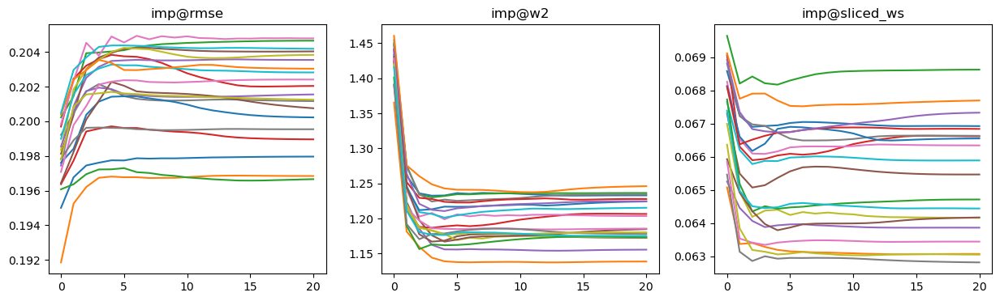

{'imp@rmse': 0.05138653136534872,
 'imp@ws': 0.2265759768904773,
 'imp@sliced_ws': 0.015177987242230833}

In [798]:
vis_imp(ret17)
ret10['imp_result']

In [799]:
sklearn_evaluation(ret17)

Accuracy imputed centralized MLP:0.5941 (0.013)
Accuracy imputed centralized LR:0.8227 (0.000)
Accuracy orignal centralized MLP:0.9335 (0.003)
Accuracy orignal centralized MLP:0.8711 (0.000)


## Missing Data Evaluation

In [269]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import RidgeCV

In [270]:
origin_data_centralized = rets['mnar_lr_simpleavg']['data']['origin_data'].reshape(-1, 21)
X_train, y_train = origin_data_centralized[:, :-1], origin_data_centralized[:, -1]
test_data = rets['mnar_lr_simpleavg']['data']['test_data']
X_test, y_test = test_data[:, :-1], test_data[:, -1]
missing_mask = rets['mnar_lr_simpleavg']['data']['missing_mask'].reshape(-1, 20)

In [272]:
cols = list(range(0, origin_data_centralized.shape[1] - 1))
print(cols)
missing_ratios = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
mechanisms = ['mcar', 'mary_sigmoid_left', 'mary_sigmoid_right', 'mnar_quantile_left', 'mnar_quantile_right']
seeds = [seed + i*10087 for i in range(1)]
def ms_evaluation_imp(mm, missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask):
    results = {}
    for missing_ratio in missing_ratios:
        imp_ret, pred_ret = [], []
        for seed in seeds:
            # simulate missing
            X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
            # imputation
            imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
            X_train_imp = imp.fit_transform(X_train_ms)

            imp_rmse = rmse(X_train_imp, X_train, missing_mask)
            imp_w2 = ws_cols(X_train_imp, X_train)
            imp_sliced_ws = sliced_ws(X_train_imp, X_train)
            imp_ret.append([imp_rmse, imp_w2, imp_sliced_ws])
            print("missing ratio {:.1f} imp rmse {:.4f} imp w2 {:.4f} imp sliced w2 {:.4f}".format(
                missing_ratio, imp_rmse, imp_w2, imp_sliced_ws
            ))

            # classification
            #mlp_accu, mlp_std = run_pred('MLP', X_train_imp, y_train, X_test, y_test)
            #lr_accu, lr_std = run_pred('LR', X_train_imp, y_train, X_test, y_test)
            # #print("mr {} lr {:.4f} ({:.3f}) mlp {:.4f} ({:.3f})".format(
            #     missing_ratio, lr_accu, lr_std, mlp_accu, mlp_std
            # ))
            # pred_ret.append([mlp_accu, mlp_std, lr_accu, lr_std])
        
        results[missing_ratio] = {
            'imp': imp_ret,
            'pred': pred_ret
        }
    return results

def ms_evaluation_pred(mm, missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask):
    results = {}
    for missing_ratio in missing_ratios:
        pred_ret = []
        for seed in seeds:
            # simulate missing
            X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
            # imputation
            imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
            X_train_imp = imp.fit_transform(X_train_ms)

            # classification
            mlp_accu, mlp_std = run_pred('MLP', X_train_imp, y_train, X_test, y_test)
            lr_accu, lr_std = run_pred('LR', X_train_imp, y_train, X_test, y_test)
            pred_ret.append([mlp_accu, mlp_std, lr_accu, lr_std])
        
        pred_ret = np.array(pred_ret)
        print(
            "missing ratio {:.1f} lr {:.4f} ({:.3f}) mlp {:.4f} ({:.3f})".format(
                missing_ratio, pred_ret[:, 2].mean(), pred_ret[:, 3].mean(), pred_ret[:, 0].mean(),
                pred_ret[:, 1].mean()
        ))

        results[missing_ratio] = {
            'pred': pred_ret
        }
    return results      


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


In [25]:
print(run_pred('MLP', X_train, y_train, X_test, y_test))
print(run_pred('LR', X_train, y_train, X_test, y_test))

(0.9335082797936838, 0.0026141301363160423)
(0.8711428829970138, 0.0)


### mcar

In [46]:
import warnings
warnings.filterwarnings('ignore')
result_mcar = ms_evaluation_imp('mcar', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 imp rmse 0.0619 imp w2 0.2520 imp sliced w2 0.0139
missing ratio 0.1 imp rmse 0.0624 imp w2 0.2502 imp sliced w2 0.0136
missing ratio 0.1 imp rmse 0.0616 imp w2 0.2524 imp sliced w2 0.0137
missing ratio 0.1 imp rmse 0.0610 imp w2 0.2516 imp sliced w2 0.0136
missing ratio 0.1 imp rmse 0.0611 imp w2 0.2522 imp sliced w2 0.0135
missing ratio 0.2 imp rmse 0.0869 imp w2 0.4955 imp sliced w2 0.0253
missing ratio 0.2 imp rmse 0.0872 imp w2 0.4961 imp sliced w2 0.0254
missing ratio 0.2 imp rmse 0.0878 imp w2 0.4893 imp sliced w2 0.0253
missing ratio 0.2 imp rmse 0.0883 imp w2 0.4919 imp sliced w2 0.0255
missing ratio 0.2 imp rmse 0.0868 imp w2 0.4930 imp sliced w2 0.0252
missing ratio 0.3 imp rmse 0.1094 imp w2 0.7115 imp sliced w2 0.0366
missing ratio 0.3 imp rmse 0.1085 imp w2 0.7031 imp sliced w2 0.0368
missing ratio 0.3 imp rmse 0.1091 imp w2 0.6984 imp sliced w2 0.0364
missing ratio 0.3 imp rmse 0.1076 imp w2 0.6889 imp sliced w2 0.0360
missing ratio 0.3 imp rmse 0.1085 

In [47]:
result_mcar_pred = ms_evaluation_pred('mcar', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 lr 0.8701 (0.000) mlp 0.9195 (0.006)
missing ratio 0.2 lr 0.8673 (0.000) mlp 0.9037 (0.005)
missing ratio 0.3 lr 0.8644 (0.000) mlp 0.8774 (0.015)
missing ratio 0.4 lr 0.8003 (0.000) mlp 0.8084 (0.020)
missing ratio 0.5 lr 0.6851 (0.000) mlp 0.7080 (0.014)
missing ratio 0.6 lr 0.6703 (0.000) mlp 0.6715 (0.025)
missing ratio 0.7 lr 0.6650 (0.000) mlp 0.6523 (0.029)


### mary_left

In [34]:
result_mary_left = ms_evaluation_imp('mary_sigmoid_left', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 imp rmse 0.0623 imp w2 0.2465 imp sliced w2 0.0132
missing ratio 0.1 imp rmse 0.0626 imp w2 0.2483 imp sliced w2 0.0134
missing ratio 0.1 imp rmse 0.0626 imp w2 0.2509 imp sliced w2 0.0136
missing ratio 0.1 imp rmse 0.0645 imp w2 0.2505 imp sliced w2 0.0136
missing ratio 0.1 imp rmse 0.0623 imp w2 0.2533 imp sliced w2 0.0135
missing ratio 0.2 imp rmse 0.0890 imp w2 0.4892 imp sliced w2 0.0252
missing ratio 0.2 imp rmse 0.0897 imp w2 0.4845 imp sliced w2 0.0252
missing ratio 0.2 imp rmse 0.0894 imp w2 0.4868 imp sliced w2 0.0254
missing ratio 0.2 imp rmse 0.0912 imp w2 0.4833 imp sliced w2 0.0252
missing ratio 0.2 imp rmse 0.0885 imp w2 0.4887 imp sliced w2 0.0250
missing ratio 0.3 imp rmse 0.1102 imp w2 0.6877 imp sliced w2 0.0363
missing ratio 0.3 imp rmse 0.1115 imp w2 0.6876 imp sliced w2 0.0363
missing ratio 0.3 imp rmse 0.1109 imp w2 0.6891 imp sliced w2 0.0368
missing ratio 0.3 imp rmse 0.1132 imp w2 0.6829 imp sliced w2 0.0364
missing ratio 0.3 imp rmse 0.1107 

In [50]:
result_maryleft_pred = ms_evaluation_pred('mary_sigmoid_left', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 lr 0.8667 (0.000) mlp 0.8975 (0.022)
missing ratio 0.2 lr 0.8657 (0.000) mlp 0.7765 (0.038)
missing ratio 0.3 lr 0.8475 (0.000) mlp 0.6959 (0.019)
missing ratio 0.4 lr 0.7402 (0.000) mlp 0.5510 (0.022)
missing ratio 0.5 lr 0.6761 (0.000) mlp 0.5260 (0.010)
missing ratio 0.6 lr 0.6430 (0.000) mlp 0.5133 (0.005)
missing ratio 0.7 lr 0.5381 (0.000) mlp 0.5023 (0.002)


### mary_right

In [35]:
result_mary_right = ms_evaluation_imp('mary_sigmoid_right', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 imp rmse 0.0608 imp w2 0.2545 imp sliced w2 0.0132
missing ratio 0.1 imp rmse 0.0612 imp w2 0.2528 imp sliced w2 0.0132
missing ratio 0.1 imp rmse 0.0609 imp w2 0.2510 imp sliced w2 0.0134
missing ratio 0.1 imp rmse 0.0629 imp w2 0.2569 imp sliced w2 0.0136
missing ratio 0.1 imp rmse 0.0604 imp w2 0.2557 imp sliced w2 0.0133
missing ratio 0.2 imp rmse 0.0865 imp w2 0.5104 imp sliced w2 0.0251
missing ratio 0.2 imp rmse 0.0881 imp w2 0.5122 imp sliced w2 0.0251
missing ratio 0.2 imp rmse 0.0870 imp w2 0.5067 imp sliced w2 0.0251
missing ratio 0.2 imp rmse 0.0877 imp w2 0.5118 imp sliced w2 0.0254
missing ratio 0.2 imp rmse 0.0868 imp w2 0.5116 imp sliced w2 0.0249
missing ratio 0.3 imp rmse 0.1065 imp w2 0.7768 imp sliced w2 0.0371
missing ratio 0.3 imp rmse 0.1072 imp w2 0.7756 imp sliced w2 0.0373
missing ratio 0.3 imp rmse 0.1074 imp w2 0.7656 imp sliced w2 0.0372
missing ratio 0.3 imp rmse 0.1080 imp w2 0.7663 imp sliced w2 0.0375
missing ratio 0.3 imp rmse 0.1069 

In [51]:
result_mary_right_pred = ms_evaluation_pred('mary_sigmoid_right', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 lr 0.8654 (0.000) mlp 0.9058 (0.011)
missing ratio 0.2 lr 0.8573 (0.000) mlp 0.7247 (0.035)
missing ratio 0.3 lr 0.8520 (0.000) mlp 0.6279 (0.027)
missing ratio 0.4 lr 0.8378 (0.000) mlp 0.5467 (0.015)
missing ratio 0.5 lr 0.8044 (0.000) mlp 0.5223 (0.012)
missing ratio 0.6 lr 0.6973 (0.000) mlp 0.5186 (0.008)
missing ratio 0.7 lr 0.6505 (0.000) mlp 0.5069 (0.007)


### mnar left

In [55]:
result_mnar_left = ms_evaluation_imp('mnar_quantile_left', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 imp rmse 0.1221 imp w2 0.6283 imp sliced w2 0.0823
missing ratio 0.2 imp rmse 0.1393 imp w2 1.2027 imp sliced w2 0.1060
missing ratio 0.3 imp rmse 0.1363 imp w2 1.5353 imp sliced w2 0.1246
missing ratio 0.4 imp rmse 0.1756 imp w2 2.2724 imp sliced w2 0.1778
missing ratio 0.5 imp rmse 0.1880 imp w2 2.5903 imp sliced w2 0.2032
missing ratio 0.6 imp rmse 0.2168 imp w2 3.1177 imp sliced w2 0.2344
missing ratio 0.7 imp rmse 0.2320 imp w2 3.6579 imp sliced w2 0.2687


In [53]:
result_mnar_left_pred = ms_evaluation_pred('mnar_quantile_left', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 lr 0.8322 (0.000) mlp 0.8191 (0.013)
missing ratio 0.2 lr 0.8061 (0.000) mlp 0.7564 (0.023)
missing ratio 0.3 lr 0.7371 (0.000) mlp 0.6641 (0.020)
missing ratio 0.4 lr 0.6748 (0.000) mlp 0.6295 (0.018)
missing ratio 0.5 lr 0.6801 (0.000) mlp 0.6598 (0.014)
missing ratio 0.6 lr 0.6808 (0.000) mlp 0.6042 (0.033)
missing ratio 0.7 lr 0.5740 (0.000) mlp 0.5739 (0.026)


### mnar right

In [56]:
result_mnar_right = ms_evaluation_imp('mnar_quantile_right', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 imp rmse 0.0872 imp w2 0.3109 imp sliced w2 0.0235
missing ratio 0.2 imp rmse 0.1273 imp w2 0.5792 imp sliced w2 0.0442
missing ratio 0.3 imp rmse 0.1762 imp w2 0.7904 imp sliced w2 0.0622
missing ratio 0.4 imp rmse 0.2010 imp w2 1.0300 imp sliced w2 0.0797
missing ratio 0.5 imp rmse 0.2226 imp w2 1.2896 imp sliced w2 0.0984
missing ratio 0.6 imp rmse 0.2366 imp w2 1.5757 imp sliced w2 0.1203
missing ratio 0.7 imp rmse 0.2576 imp w2 1.8816 imp sliced w2 0.1422


In [54]:
result_mnar_right_pred = ms_evaluation_pred('mnar_quantile_right', missing_ratios, seeds, cols, X_train, y_train, X_test, y_test, missing_mask)

missing ratio 0.1 lr 0.8702 (0.000) mlp 0.9132 (0.005)
missing ratio 0.2 lr 0.8712 (0.000) mlp 0.8972 (0.008)
missing ratio 0.3 lr 0.8366 (0.000) mlp 0.8343 (0.015)
missing ratio 0.4 lr 0.7682 (0.000) mlp 0.7931 (0.023)
missing ratio 0.5 lr 0.7578 (0.000) mlp 0.7474 (0.019)
missing ratio 0.6 lr 0.7581 (0.000) mlp 0.7185 (0.024)
missing ratio 0.7 lr 0.7285 (0.000) mlp 0.6795 (0.021)


## Missing Evaluation NN

In [293]:
def ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients, eval = 'central'):

    data_imp = np.concatenate([X_train_imp, y_train.reshape(-1, 1)], axis=1)
    test_data = np.concatenate([X_test, y_test.reshape(-1, 1)], axis=1)
    missing_mask = missing_mask
    data_true = np.concatenate([X_train, y_train.reshape(-1, 1)], axis=1)

    clients_ = {}
    sample_size = X_train.shape[0] // n_clients
    for client_id in range(n_clients):
        clients_[client_id] = SimpleClient(
            client_id=client_id,
            data_imp=data_imp[client_id*sample_size:(client_id+1)*sample_size],
            missing_mask=missing_mask[client_id*sample_size:(client_id+1)*sample_size],
            data_true=data_true[client_id*sample_size:(client_id+1)*sample_size],
            data_test=test_data
        )

    pred_config = server_config_tmpl.copy()
    if eval == 'central':
        server_name = 'central_mlp_pytorch_pred'
    elif eval == 'fedavg':
        server_name = 'fedavg_mlp_pytorch_pred'
    else:
        raise NotImplementedError
    
    server_pred_config = pred_config['server_pred_config']
    server_pred_config['train_params']['pred_round'] = 500
    server_config = pred_config['server_config']
    server_config['pred_rounds'] = 1
    server_ = load_server(
            server_name, clients=clients_, server_config=server_config, pred_config=server_pred_config,
            test_data=test_data
        )

    pred_ret = server_.prediction()
    print(pred_ret)
    return pred_ret

### MCAR

In [295]:
results_nn_mcar_central = {}
mm = 'mcar'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='central')
        print(ret)
        pred_ret.append(ret)
    results_nn_mcar_central[missing_ratio] = pred_ret

0.1


2023-07-20 09:42:15.502 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5105, train_loss: 0.6925 val_accu: 0.5010 val_f1: 0.3866
2023-07-20 09:42:27.421 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.8840, train_loss: 0.3627 val_accu: 0.8596 val_f1: 0.8595
2023-07-20 09:42:39.945 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.8578, train_loss: 0.3410 val_accu: 0.8288 val_f1: 0.8282
2023-07-20 09:42:51.854 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.8972, train_loss: 0.3241 val_accu: 0.8692 val_f1: 0.8691
2023-07-20 09:43:03.479 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.8977, train_loss: 0.3152 val_accu: 0.8625 val_f1: 0.8625


{'accu_mean': 0.9047145054746177, 'f1_mean': 0.9046955139696053, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.9047145054746177, 'f1_mean': 0.9046955139696053, 'accu_std': 0.0, 'f1_std': 0.0}
0.3


2023-07-20 09:43:16.486 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5075, train_loss: 0.6933 val_accu: 0.5067 val_f1: 0.4226
2023-07-20 09:43:27.642 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.8676, train_loss: 0.4620 val_accu: 0.7981 val_f1: 0.7976
2023-07-20 09:43:38.399 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.8744, train_loss: 0.4449 val_accu: 0.8096 val_f1: 0.8095
2023-07-20 09:43:50.008 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.8846, train_loss: 0.4324 val_accu: 0.8192 val_f1: 0.8180
2023-07-20 09:44:01.957 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.8893, train_loss: 0.4251 val_accu: 0.8029 val_f1: 0.8028


{'accu_mean': 0.8983802370826169, 'f1_mean': 0.8983186377501067, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.8983802370826169, 'f1_mean': 0.8983186377501067, 'accu_std': 0.0, 'f1_std': 0.0}
0.5


2023-07-20 09:44:15.859 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5052, train_loss: 0.6937 val_accu: 0.4990 val_f1: 0.3380
2023-07-20 09:44:26.859 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.7239, train_loss: 0.5826 val_accu: 0.7019 val_f1: 0.6961
2023-07-20 09:44:38.752 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.7569, train_loss: 0.5784 val_accu: 0.7077 val_f1: 0.7051
2023-07-20 09:44:49.572 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.8377, train_loss: 0.5704 val_accu: 0.7115 val_f1: 0.7100
2023-07-20 09:45:00.832 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.8215, train_loss: 0.5674 val_accu: 0.7173 val_f1: 0.7159


{'accu_mean': 0.857026513437698, 'f1_mean': 0.856613642740631, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.857026513437698, 'f1_mean': 0.856613642740631, 'accu_std': 0.0, 'f1_std': 0.0}
0.7


2023-07-20 09:45:14.114 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5023, train_loss: 0.6930 val_accu: 0.5125 val_f1: 0.4056
2023-07-20 09:45:25.947 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.6898, train_loss: 0.6258 val_accu: 0.6096 val_f1: 0.5949
2023-07-20 09:45:37.541 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.6951, train_loss: 0.6260 val_accu: 0.6087 val_f1: 0.6083
2023-07-20 09:45:49.020 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.6917, train_loss: 0.6209 val_accu: 0.6019 val_f1: 0.6016
2023-07-20 09:46:00.572 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.6842, train_loss: 0.6239 val_accu: 0.6058 val_f1: 0.6056


{'accu_mean': 0.7209302325581395, 'f1_mean': 0.7209256051067904, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.7209302325581395, 'f1_mean': 0.7209256051067904, 'accu_std': 0.0, 'f1_std': 0.0}


In [352]:
results_nn_mcar_f = {}
mm = 'mcar'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='fedavg')
        print(ret)
        pred_ret.append(ret)
    results_nn_mcar_f[missing_ratio] = pred_ret

0.1


2023-07-20 10:51:07.598 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8432, test_f1: 0.8431, val_loss: 0.4393, val_accu: 0.8048, val_f1: 0.8046
2023-07-20 10:51:50.333 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8544, test_f1: 0.8544, val_loss: 0.3975, val_accu: 0.8125, val_f1: 0.8124
2023-07-20 10:52:31.735 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8626, test_f1: 0.8626, val_loss: 0.3843, val_accu: 0.8269, val_f1: 0.8269
2023-07-20 10:53:12.393 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8709, test_f1: 0.8709, val_loss: 0.3746, val_accu: 0.8356, val_f1: 0.8356
2023-07-20 10:53:53.508 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8804, test_f1: 0.880

{'accu_mean': 0.9036286308931318, 'f1_mean': 0.9034309453862335, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6927823821703593, 'test_accu': 0.5081893041353723, 'test_f1': 0.41957394121734887, 'val_loss': 0.6931110752953423, 'val_accu': 0.5269230769230769, 'val_f1': 0.43261656376410473}, {'test_loss': 0.6919079861421694, 'test_accu': 0.5386842819654329, 'test_f1': 0.5345380880676639, 'val_loss': 0.692187229792277, 'val_accu': 0.5423076923076923, 'val_f1': 0.5373181199623155}, {'test_loss': 0.6908669608762894, 'test_accu': 0.5643833137272645, 'test_f1': 0.562001075972299, 'val_loss': 0.6913067499796549, 'val_accu': 0.5653846153846154, 'val_f1': 0.5631730172359319}, {'test_loss': 0.6897075361218946, 'test_accu': 0.5806714324495521, 'test_f1': 0.5801074766980439, 'val_loss': 0.6903500292036269, 'val_accu': 0.5778846153846153, 'val_f1': 0.5772275513256087}, {'test_loss': 0.6882288079152162, 'test_accu': 0.5960546556872681, 'test_f1': 0.5957049828052974, 'val_loss': 0.689070

2023-07-20 10:57:58.386 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8401, test_f1: 0.8401, val_loss: 0.5097, val_accu: 0.7865, val_f1: 0.7865
2023-07-20 10:58:37.536 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8410, test_f1: 0.8396, val_loss: 0.4653, val_accu: 0.7913, val_f1: 0.7897
2023-07-20 10:59:16.790 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8549, test_f1: 0.8541, val_loss: 0.4458, val_accu: 0.7885, val_f1: 0.7877
2023-07-20 10:59:55.981 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8603, test_f1: 0.8595, val_loss: 0.4402, val_accu: 0.7913, val_f1: 0.7904
2023-07-20 11:00:35.014 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8658, test_f1: 0.865

{'accu_mean': 0.8873405121708443, 'f1_mean': 0.8871038236972757, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6929163254540542, 'test_accu': 0.5082797936838295, 'test_f1': 0.430985178111826, 'val_loss': 0.6931821174091763, 'val_accu': 0.5230769230769231, 'val_f1': 0.4373252003787234}, {'test_loss': 0.6922708071511368, 'test_accu': 0.522124694597774, 'test_f1': 0.5209809286401801, 'val_loss': 0.6925844616360135, 'val_accu': 0.5423076923076923, 'val_f1': 0.5336129545257557}, {'test_loss': 0.6915221872000858, 'test_accu': 0.5472807890688626, 'test_f1': 0.5454674765853467, 'val_loss': 0.6920098662376404, 'val_accu': 0.5615384615384615, 'val_f1': 0.5527236099007435}, {'test_loss': 0.6907209459392504, 'test_accu': 0.5681838747624649, 'test_f1': 0.5665475184188264, 'val_loss': 0.6913667254977756, 'val_accu': 0.575, 'val_f1': 0.5692653673163419}, {'test_loss': 0.6897599265493196, 'test_accu': 0.582390733870238, 'test_f1': 0.5815947797906835, 'val_loss': 0.6906186673376296, 'val

2023-07-20 11:04:29.973 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.6751, test_f1: 0.6726, val_loss: 0.6067, val_accu: 0.6846, val_f1: 0.6829
2023-07-20 11:05:08.792 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.7422, test_f1: 0.7398, val_loss: 0.5776, val_accu: 0.7115, val_f1: 0.7110
2023-07-20 11:05:50.187 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.7694, test_f1: 0.7668, val_loss: 0.5682, val_accu: 0.7163, val_f1: 0.7156
2023-07-20 11:06:35.834 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.7941, test_f1: 0.7930, val_loss: 0.5656, val_accu: 0.7154, val_f1: 0.7153
2023-07-20 11:07:17.619 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.7913, test_f1: 0.789

{'accu_mean': 0.8430911229752963, 'f1_mean': 0.8430885211592655, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6929552520828686, 'test_accu': 0.5118993756221156, 'test_f1': 0.4117917563152679, 'val_loss': 0.6933992372618781, 'val_accu': 0.5096153846153846, 'val_f1': 0.3877437943262412}, {'test_loss': 0.6924360449286713, 'test_accu': 0.5337978463487467, 'test_f1': 0.5233906984746226, 'val_loss': 0.6928345428572761, 'val_accu': 0.5461538461538461, 'val_f1': 0.5268626506024097}, {'test_loss': 0.6919341738196625, 'test_accu': 0.5559677857207492, 'test_f1': 0.5351990767282171, 'val_loss': 0.6924501657485962, 'val_accu': 0.5509615384615385, 'val_f1': 0.5268006332967969}, {'test_loss': 0.6913818011338684, 'test_accu': 0.5891774500045245, 'test_f1': 0.5692486161259438, 'val_loss': 0.692000514931149, 'val_accu': 0.5644230769230769, 'val_f1': 0.5475216553223735}, {'test_loss': 0.690705593975111, 'test_accu': 0.5898108768437246, 'test_f1': 0.5811845501355852, 'val_loss': 0.69142341

2023-07-20 11:11:21.778 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.6486, test_f1: 0.6462, val_loss: 0.6592, val_accu: 0.5913, val_f1: 0.5906
2023-07-20 11:12:02.091 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.6830, test_f1: 0.6753, val_loss: 0.6381, val_accu: 0.5990, val_f1: 0.5932
2023-07-20 11:12:42.370 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.6851, test_f1: 0.6786, val_loss: 0.6345, val_accu: 0.6067, val_f1: 0.6027
2023-07-20 11:13:23.025 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.6884, test_f1: 0.6831, val_loss: 0.6340, val_accu: 0.6115, val_f1: 0.6079
2023-07-20 11:14:03.584 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.6879, test_f1: 0.682

{'accu_mean': 0.7220161071396254, 'f1_mean': 0.7217784271125047, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6930633838149323, 'test_accu': 0.5043887431001719, 'test_f1': 0.4587188712381104, 'val_loss': 0.6929182608922323, 'val_accu': 0.5009615384615385, 'val_f1': 0.43681076461891133}, {'test_loss': 0.6927475031765028, 'test_accu': 0.5001357343226858, 'test_f1': 0.49828604810413635, 'val_loss': 0.6925227112240262, 'val_accu': 0.5182692307692308, 'val_f1': 0.517990702837716}, {'test_loss': 0.6924315992443041, 'test_accu': 0.5076463668446295, 'test_f1': 0.5069743398917286, 'val_loss': 0.6923147704866197, 'val_accu': 0.5278846153846154, 'val_f1': 0.5251446261202073}, {'test_loss': 0.6921103466516254, 'test_accu': 0.5129852502036015, 'test_f1': 0.5123559167549201, 'val_loss': 0.6920617620150248, 'val_accu': 0.5278846153846154, 'val_f1': 0.5266553020928058}, {'test_loss': 0.6917805904629587, 'test_accu': 0.5226676318885168, 'test_f1': 0.5222770184850622, 'val_loss': 0.69180

In [366]:
results_nn_mcar_f[0.7][0]['accu_mean']

0.7220161071396254

### MARY Sigmoid Left

In [296]:
results = {}
mm = 'mary_sigmoid_left'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='central')
        print(ret)
        pred_ret.append(ret)
    results[missing_ratio] = pred_ret

0.1


2023-07-20 09:46:14.161 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5100, train_loss: 0.6927 val_accu: 0.5087 val_f1: 0.4102
2023-07-20 09:46:25.957 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.8882, train_loss: 0.3151 val_accu: 0.8731 val_f1: 0.8730
2023-07-20 09:46:37.498 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.8953, train_loss: 0.2836 val_accu: 0.8837 val_f1: 0.8836
2023-07-20 09:46:49.340 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.8979, train_loss: 0.2612 val_accu: 0.8894 val_f1: 0.8893
2023-07-20 09:47:01.105 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.9087, train_loss: 0.2403 val_accu: 0.8885 val_f1: 0.8885


{'accu_mean': 0.9119536693511899, 'f1_mean': 0.9119085865972437, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.9119536693511899, 'f1_mean': 0.9119085865972437, 'accu_std': 0.0, 'f1_std': 0.0}
0.3


2023-07-20 09:47:14.459 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5160, train_loss: 0.6925 val_accu: 0.5442 val_f1: 0.4705
2023-07-20 09:47:26.141 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.7054, train_loss: 0.3058 val_accu: 0.8721 val_f1: 0.8720
2023-07-20 09:47:38.011 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.7170, train_loss: 0.2600 val_accu: 0.8846 val_f1: 0.8846
2023-07-20 09:47:49.889 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.6380, train_loss: 0.2354 val_accu: 0.8654 val_f1: 0.8640
2023-07-20 09:48:01.671 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.6705, train_loss: 0.2250 val_accu: 0.8990 val_f1: 0.8990


{'accu_mean': 0.7911501221608904, 'f1_mean': 0.7858721268035689, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.7911501221608904, 'f1_mean': 0.7858721268035689, 'accu_std': 0.0, 'f1_std': 0.0}
0.5


2023-07-20 09:48:15.570 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5107, train_loss: 0.6915 val_accu: 0.5817 val_f1: 0.5207
2023-07-20 09:48:27.556 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.5000, train_loss: 0.2779 val_accu: 0.8885 val_f1: 0.8883
2023-07-20 09:48:39.508 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.5016, train_loss: 0.2467 val_accu: 0.8933 val_f1: 0.8933
2023-07-20 09:48:51.229 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.5017, train_loss: 0.2281 val_accu: 0.8952 val_f1: 0.8949
2023-07-20 09:49:03.495 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.5040, train_loss: 0.2146 val_accu: 0.9106 val_f1: 0.9106


{'accu_mean': 0.5248393810514885, 'f1_mean': 0.5212566402469617, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.5248393810514885, 'f1_mean': 0.5212566402469617, 'accu_std': 0.0, 'f1_std': 0.0}
0.7


2023-07-20 09:49:17.627 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5084, train_loss: 0.6911 val_accu: 0.5846 val_f1: 0.5150
2023-07-20 09:49:30.082 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.4978, train_loss: 0.3099 val_accu: 0.8673 val_f1: 0.8672
2023-07-20 09:49:43.086 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.4998, train_loss: 0.2831 val_accu: 0.8837 val_f1: 0.8837
2023-07-20 09:49:55.822 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.4999, train_loss: 0.2701 val_accu: 0.8817 val_f1: 0.8816
2023-07-20 09:50:08.898 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.4995, train_loss: 0.2587 val_accu: 0.8846 val_f1: 0.8846


{'accu_mean': 0.5163333634965162, 'f1_mean': 0.5094826217780564, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.5163333634965162, 'f1_mean': 0.5094826217780564, 'accu_std': 0.0, 'f1_std': 0.0}


In [353]:
resultsf = {}
mm = 'mary_sigmoid_left'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='fedavg')
        print(ret)
        pred_ret.append(ret)
    resultsf[missing_ratio] = pred_ret

0.1


2023-07-20 11:17:56.641 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8459, test_f1: 0.8458, val_loss: 0.4185, val_accu: 0.8327, val_f1: 0.8326
2023-07-20 11:18:35.936 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8657, test_f1: 0.8657, val_loss: 0.3555, val_accu: 0.8577, val_f1: 0.8577
2023-07-20 11:19:14.413 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8788, test_f1: 0.8788, val_loss: 0.3309, val_accu: 0.8673, val_f1: 0.8673
2023-07-20 11:19:54.298 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8887, test_f1: 0.8887, val_loss: 0.3144, val_accu: 0.8769, val_f1: 0.8769
2023-07-20 11:20:34.525 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8955, test_f1: 0.895

{'accu_mean': 0.9078816396706181, 'f1_mean': 0.9077601878590205, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6928055930411678, 'test_accu': 0.5101800742014297, 'test_f1': 0.42259694806529546, 'val_loss': 0.6929507123099433, 'val_accu': 0.5230769230769231, 'val_f1': 0.43223443223443225}, {'test_loss': 0.6919808161669764, 'test_accu': 0.5441136548728622, 'test_f1': 0.5396763465128834, 'val_loss': 0.6919456587897407, 'val_accu': 0.5490384615384616, 'val_f1': 0.5449146715009063}, {'test_loss': 0.6910788437415814, 'test_accu': 0.5691792597954937, 'test_f1': 0.5659853851194849, 'val_loss': 0.6910663909382291, 'val_accu': 0.5817307692307693, 'val_f1': 0.5782113138941333}, {'test_loss': 0.6899804883989794, 'test_accu': 0.5875486381322957, 'test_f1': 0.5870731578711617, 'val_loss': 0.6901086568832397, 'val_accu': 0.5932692307692308, 'val_f1': 0.5923643368831883}, {'test_loss': 0.6886197068225378, 'test_accu': 0.5775042982535518, 'test_f1': 0.5774668764873679, 'val_loss': 0.6889

2023-07-20 11:24:27.166 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.6840, test_f1: 0.6538, val_loss: 0.4432, val_accu: 0.8096, val_f1: 0.8092
2023-07-20 11:25:05.194 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.6493, test_f1: 0.6046, val_loss: 0.3434, val_accu: 0.8404, val_f1: 0.8397
2023-07-20 11:25:42.816 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.6613, test_f1: 0.6211, val_loss: 0.3145, val_accu: 0.8519, val_f1: 0.8515
2023-07-20 11:26:22.631 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.6658, test_f1: 0.6272, val_loss: 0.2944, val_accu: 0.8654, val_f1: 0.8651
2023-07-20 11:27:02.220 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.6687, test_f1: 0.631

{'accu_mean': 0.7015654691883088, 'f1_mean': 0.6822749658372907, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6929760212185739, 'test_accu': 0.5076463668446295, 'test_f1': 0.40260203002176487, 'val_loss': 0.6925622887081571, 'val_accu': 0.4951923076923077, 'val_f1': 0.3756967670011148}, {'test_loss': 0.6924083219177422, 'test_accu': 0.5296353271197177, 'test_f1': 0.5294002326262855, 'val_loss': 0.6911853088272942, 'val_accu': 0.5394230769230769, 'val_f1': 0.5376168929110106}, {'test_loss': 0.6918985932722859, 'test_accu': 0.5397701565469188, 'test_f1': 0.5387051199809854, 'val_loss': 0.6901559366120232, 'val_accu': 0.5759615384615384, 'val_f1': 0.5754807358556058}, {'test_loss': 0.6912707542550975, 'test_accu': 0.5602207944982355, 'test_f1': 0.5601551552066373, 'val_loss': 0.6890848477681478, 'val_accu': 0.5961538461538461, 'val_f1': 0.5961404040814968}, {'test_loss': 0.690495062148434, 'test_accu': 0.5550628902361777, 'test_f1': 0.5550530385226492, 'val_loss': 0.687832

2023-07-20 11:31:10.206 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.5017, test_f1: 0.3461, val_loss: 0.3801, val_accu: 0.8375, val_f1: 0.8375
2023-07-20 11:31:49.250 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.5000, test_f1: 0.3333, val_loss: 0.3147, val_accu: 0.8625, val_f1: 0.8625
2023-07-20 11:32:29.065 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.4999, test_f1: 0.3334, val_loss: 0.2900, val_accu: 0.8712, val_f1: 0.8712
2023-07-20 11:33:09.544 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.5000, test_f1: 0.3336, val_loss: 0.2751, val_accu: 0.8740, val_f1: 0.8740
2023-07-20 11:33:49.830 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.5003, test_f1: 0.334

{'accu_mean': 0.521581757307031, 'f1_mean': 0.5097545411424261, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6932250364073391, 'test_accu': 0.4963351732874853, 'test_f1': 0.3697268328047539, 'val_loss': 0.6917490031984117, 'val_accu': 0.49038461538461536, 'val_f1': 0.3434468563587505}, {'test_loss': 0.6929277537883013, 'test_accu': 0.5104515428468012, 'test_f1': 0.5094025708112061, 'val_loss': 0.6896408134036593, 'val_accu': 0.6192307692307693, 'val_f1': 0.6189926396305383}, {'test_loss': 0.6928073647378505, 'test_accu': 0.5093656682653154, 'test_f1': 0.5000185077821135, 'val_loss': 0.6878094209565057, 'val_accu': 0.6653846153846154, 'val_f1': 0.6646703036053131}, {'test_loss': 0.6926538635944498, 'test_accu': 0.5069224504569723, 'test_f1': 0.47964938487406306, 'val_loss': 0.6859237021870084, 'val_accu': 0.676923076923077, 'val_f1': 0.6768262682238393}, {'test_loss': 0.6923568762581924, 'test_accu': 0.5129852502036015, 'test_f1': 0.4973837904222659, 'val_loss': 0.683785

2023-07-20 11:37:54.722 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.5058, test_f1: 0.3977, val_loss: 0.3920, val_accu: 0.8144, val_f1: 0.8144
2023-07-20 11:38:35.199 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.4985, test_f1: 0.3518, val_loss: 0.3460, val_accu: 0.8452, val_f1: 0.8452
2023-07-20 11:39:15.763 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.5000, test_f1: 0.3359, val_loss: 0.3203, val_accu: 0.8567, val_f1: 0.8567
2023-07-20 11:39:56.169 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.5000, test_f1: 0.3335, val_loss: 0.3052, val_accu: 0.8702, val_f1: 0.8702
2023-07-20 11:40:37.013 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.5000, test_f1: 0.333

{'accu_mean': 0.5258347660845173, 'f1_mean': 0.5136526419049666, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6931622528481758, 'test_accu': 0.5005881820649715, 'test_f1': 0.3928050087278009, 'val_loss': 0.6918190254105462, 'val_accu': 0.44903846153846155, 'val_f1': 0.33479118457669294}, {'test_loss': 0.6928670557065942, 'test_accu': 0.5111754592344584, 'test_f1': 0.5109150469275757, 'val_loss': 0.6896347138616774, 'val_accu': 0.6519230769230769, 'val_f1': 0.6488046597188797}, {'test_loss': 0.6926862158994566, 'test_accu': 0.5098181160076011, 'test_f1': 0.50093950555608, 'val_loss': 0.6880977352460226, 'val_accu': 0.6740384615384616, 'val_f1': 0.6723343943864867}, {'test_loss': 0.6924771508951296, 'test_accu': 0.5183241335625736, 'test_f1': 0.5023153478852806, 'val_loss': 0.6864211095703973, 'val_accu': 0.6961538461538461, 'val_f1': 0.6934316919092982}, {'test_loss': 0.6923210429049086, 'test_accu': 0.5199529454348023, 'test_f1': 0.4899086261633965, 'val_loss': 0.684439

In [370]:
resultsf[0.7][0]['accu_mean']

0.5258347660845173

### MARY Sigmoid Right

In [297]:
results_maryr = {}
mm = 'mary_sigmoid_right'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='central')
        print(ret)
        pred_ret.append(ret)
    results_maryr[missing_ratio] = pred_ret

0.1


2023-07-20 09:50:22.495 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5093, train_loss: 0.6922 val_accu: 0.4981 val_f1: 0.3837
2023-07-20 09:50:35.674 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.8598, train_loss: 0.3216 val_accu: 0.8596 val_f1: 0.8594
2023-07-20 09:50:48.364 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.8610, train_loss: 0.2943 val_accu: 0.8769 val_f1: 0.8768
2023-07-20 09:51:01.448 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.8792, train_loss: 0.2536 val_accu: 0.8740 val_f1: 0.8740
2023-07-20 09:51:14.537 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.8489, train_loss: 0.2436 val_accu: 0.8788 val_f1: 0.8786


{'accu_mean': 0.906705275540675, 'f1_mean': 0.9066911437392913, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.906705275540675, 'f1_mean': 0.9066911437392913, 'accu_std': 0.0, 'f1_std': 0.0}


2023-07-20 09:51:27.797 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5088, train_loss: 0.6922 val_accu: 0.4981 val_f1: 0.3850
2023-07-20 09:51:40.791 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.8693, train_loss: 0.3129 val_accu: 0.8644 val_f1: 0.8644
2023-07-20 09:51:53.470 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.8353, train_loss: 0.2867 val_accu: 0.8606 val_f1: 0.8601
2023-07-20 09:52:06.261 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.9031, train_loss: 0.2516 val_accu: 0.8971 val_f1: 0.8971
2023-07-20 09:52:19.201 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.8977, train_loss: 0.2426 val_accu: 0.8952 val_f1: 0.8952


{'accu_mean': 0.9134919916749615, 'f1_mean': 0.9133868676341064, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.9134919916749615, 'f1_mean': 0.9133868676341064, 'accu_std': 0.0, 'f1_std': 0.0}
0.3


2023-07-20 09:52:33.607 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5133, train_loss: 0.6917 val_accu: 0.5038 val_f1: 0.3547
2023-07-20 09:52:45.801 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.6507, train_loss: 0.2544 val_accu: 0.8856 val_f1: 0.8856
2023-07-20 09:52:57.580 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.6303, train_loss: 0.2109 val_accu: 0.9029 val_f1: 0.9029
2023-07-20 09:53:09.921 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.6464, train_loss: 0.1933 val_accu: 0.9058 val_f1: 0.9057
2023-07-20 09:53:22.788 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.6293, train_loss: 0.1929 val_accu: 0.9087 val_f1: 0.9086


{'accu_mean': 0.790335716224776, 'f1_mean': 0.7901440210757793, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.790335716224776, 'f1_mean': 0.7901440210757793, 'accu_std': 0.0, 'f1_std': 0.0}


2023-07-20 09:53:36.628 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5057, train_loss: 0.6914 val_accu: 0.5038 val_f1: 0.3468
2023-07-20 09:53:49.185 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.6590, train_loss: 0.2670 val_accu: 0.8779 val_f1: 0.8778
2023-07-20 09:54:01.061 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.6230, train_loss: 0.2336 val_accu: 0.8721 val_f1: 0.8714
2023-07-20 09:54:13.836 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.6730, train_loss: 0.2023 val_accu: 0.8942 val_f1: 0.8942
2023-07-20 09:54:26.660 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.6612, train_loss: 0.1867 val_accu: 0.9010 val_f1: 0.9009


{'accu_mean': 0.7992941815220342, 'f1_mean': 0.7979148367704547, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.7992941815220342, 'f1_mean': 0.7979148367704547, 'accu_std': 0.0, 'f1_std': 0.0}
0.5


2023-07-20 09:54:40.662 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.4997, train_loss: 0.6911 val_accu: 0.4990 val_f1: 0.3445
2023-07-20 09:54:53.096 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.5646, train_loss: 0.2258 val_accu: 0.8962 val_f1: 0.8961
2023-07-20 09:55:05.435 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.5336, train_loss: 0.1948 val_accu: 0.9087 val_f1: 0.9086
2023-07-20 09:55:18.261 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.5497, train_loss: 0.1802 val_accu: 0.9173 val_f1: 0.9171
2023-07-20 09:55:30.534 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.5352, train_loss: 0.1712 val_accu: 0.9173 val_f1: 0.9173


{'accu_mean': 0.6035652882092118, 'f1_mean': 0.5429454322879367, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.6035652882092118, 'f1_mean': 0.5429454322879367, 'accu_std': 0.0, 'f1_std': 0.0}


2023-07-20 09:55:44.519 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.5014, train_loss: 0.6897 val_accu: 0.4952 val_f1: 0.3394
2023-07-20 09:55:56.872 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.5493, train_loss: 0.2097 val_accu: 0.8904 val_f1: 0.8903
2023-07-20 09:56:09.735 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.5525, train_loss: 0.1974 val_accu: 0.8942 val_f1: 0.8942
2023-07-20 09:56:22.555 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.5508, train_loss: 0.1782 val_accu: 0.8962 val_f1: 0.8961
2023-07-20 09:56:35.581 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.5273, train_loss: 0.1681 val_accu: 0.9000 val_f1: 0.8999


{'accu_mean': 0.5979549362048684, 'f1_mean': 0.5552418202441236, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.5979549362048684, 'f1_mean': 0.5552418202441236, 'accu_std': 0.0, 'f1_std': 0.0}
0.7


2023-07-20 09:56:49.714 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.4998, train_loss: 0.6888 val_accu: 0.5010 val_f1: 0.3355
2023-07-20 09:57:02.643 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.5001, train_loss: 0.2572 val_accu: 0.8865 val_f1: 0.8865
2023-07-20 09:57:15.339 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.5005, train_loss: 0.2502 val_accu: 0.8837 val_f1: 0.8837
2023-07-20 09:57:28.242 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.5014, train_loss: 0.2398 val_accu: 0.8904 val_f1: 0.8903
2023-07-20 09:57:40.950 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.5021, train_loss: 0.2354 val_accu: 0.8788 val_f1: 0.8786


{'accu_mean': 0.5195909872409736, 'f1_mean': 0.4960350360377619, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.5195909872409736, 'f1_mean': 0.4960350360377619, 'accu_std': 0.0, 'f1_std': 0.0}


2023-07-20 09:57:54.971 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 0, test_accu: 0.4996, train_loss: 0.6888 val_accu: 0.4981 val_f1: 0.3342
2023-07-20 09:58:08.462 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 100, test_accu: 0.5004, train_loss: 0.2746 val_accu: 0.8702 val_f1: 0.8702
2023-07-20 09:58:21.957 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 200, test_accu: 0.5007, train_loss: 0.2610 val_accu: 0.8817 val_f1: 0.8817
2023-07-20 09:58:35.037 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 300, test_accu: 0.5010, train_loss: 0.2464 val_accu: 0.8817 val_f1: 0.8816
2023-07-20 09:58:47.532 | INFO     | src.fed_imp.sub_modules.server.pred_server_central_pytorch:prediction:158 - Round: 400, test_accu: 0.5006, train_loss: 0.2452 val_accu: 0.8904 val_f1: 0.8904


{'accu_mean': 0.5361505746086327, 'f1_mean': 0.52125968933286, 'accu_std': 0.0, 'f1_std': 0.0}
{'accu_mean': 0.5361505746086327, 'f1_mean': 0.52125968933286, 'accu_std': 0.0, 'f1_std': 0.0}


In [354]:
results_maryrf = {}
mm = 'mary_sigmoid_right'
missing_ratios = [0.1, 0.3, 0.5, 0.7]
for missing_ratio in missing_ratios:
    print(missing_ratio)
    pred_ret = []
    for i in range(1):
        seed = new_seed + i*10087
        # simulate missing
        X_train_ms = simulate_nan_new(X_train, y_train, cols,  missing_ratio, mm, seed=seed)
        # imputation
        imp = IterativeImputer(max_iter=20, random_state=seed, estimator=RidgeCV(alphas=[0.1, 1.0, 10.0]))
        X_train_imp = imp.fit_transform(X_train_ms)

        # centralized prediction
        ret = ms_nn_eval(X_train, X_train_imp, y_train, X_test, y_test, missing_mask, n_clients=20, eval='fedavg')
        print(ret)
        pred_ret.append(ret)
    results_maryrf[missing_ratio] = pred_ret

0.1


2023-07-20 11:44:13.784 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.8382, test_f1: 0.8379, val_loss: 0.4261, val_accu: 0.8260, val_f1: 0.8256
2023-07-20 11:44:57.202 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.8612, test_f1: 0.8611, val_loss: 0.3720, val_accu: 0.8500, val_f1: 0.8499
2023-07-20 11:45:40.605 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.8726, test_f1: 0.8725, val_loss: 0.3481, val_accu: 0.8663, val_f1: 0.8663
2023-07-20 11:46:23.666 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.8806, test_f1: 0.8805, val_loss: 0.3297, val_accu: 0.8692, val_f1: 0.8691
2023-07-20 11:47:06.619 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.8789, test_f1: 0.878

{'accu_mean': 0.8943986969505022, 'f1_mean': 0.8943802617595423, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6928279571149542, 'test_accu': 0.506198534069315, 'test_f1': 0.4134715765182272, 'val_loss': 0.692807588312361, 'val_accu': 0.5298076923076923, 'val_f1': 0.4397335715883139}, {'test_loss': 0.6918419880428534, 'test_accu': 0.541670437064519, 'test_f1': 0.5328560707633817, 'val_loss': 0.6916598280270895, 'val_accu': 0.5605769230769231, 'val_f1': 0.5511140452531595}, {'test_loss': 0.6908021521294254, 'test_accu': 0.5684553434078364, 'test_f1': 0.5639443584987658, 'val_loss': 0.6905413998497857, 'val_accu': 0.5875, 'val_f1': 0.5823938223938224}, {'test_loss': 0.6895480683480186, 'test_accu': 0.5910777305221246, 'test_f1': 0.5892158302635582, 'val_loss': 0.6892036729388766, 'val_accu': 0.6048076923076923, 'val_f1': 0.6025141371393181}, {'test_loss': 0.6880382004825548, 'test_accu': 0.6206678128676137, 'test_f1': 0.6200405829909041, 'val_loss': 0.6877400146590339, 'va

2023-07-20 11:51:31.452 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.7387, test_f1: 0.7266, val_loss: 0.3911, val_accu: 0.8423, val_f1: 0.8423
2023-07-20 11:52:15.808 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.7113, test_f1: 0.6919, val_loss: 0.3305, val_accu: 0.8577, val_f1: 0.8577
2023-07-20 11:52:58.219 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.6975, test_f1: 0.6735, val_loss: 0.3054, val_accu: 0.8692, val_f1: 0.8692
2023-07-20 11:53:38.705 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.6865, test_f1: 0.6590, val_loss: 0.2908, val_accu: 0.8760, val_f1: 0.8759
2023-07-20 11:54:19.552 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.6831, test_f1: 0.654

{'accu_mean': 0.7508822730974573, 'f1_mean': 0.7424115867614534, 'accu_std': 0.0, 'f1_std': 0.0, 'history': [[{'test_loss': 0.6929120832476122, 'test_accu': 0.5059270654239435, 'test_f1': 0.43113713855545044, 'val_loss': 0.692451900906033, 'val_accu': 0.5394230769230769, 'val_f1': 0.44708787702211494}, {'test_loss': 0.6920173935506536, 'test_accu': 0.5337978463487467, 'test_f1': 0.5283564269456006, 'val_loss': 0.6909064186943902, 'val_accu': 0.5913461538461539, 'val_f1': 0.5770816529026838}, {'test_loss': 0.6911433681674387, 'test_accu': 0.5508098814586915, 'test_f1': 0.5486921960486363, 'val_loss': 0.6895588702625699, 'val_accu': 0.6096153846153847, 'val_f1': 0.5999075193583966}, {'test_loss': 0.6899891783451212, 'test_accu': 0.5617591168220071, 'test_f1': 0.5607487907807397, 'val_loss': 0.6879667507277595, 'val_accu': 0.625, 'val_f1': 0.619413656819214}, {'test_loss': 0.6886845169396236, 'test_accu': 0.6021174554338974, 'test_f1': 0.6020848727172273, 'val_loss': 0.6860651307635837, '

2023-07-20 11:57:49.397 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 50, test_accu: 0.5495, test_f1: 0.4381, val_loss: 0.3947, val_accu: 0.8365, val_f1: 0.8365
2023-07-20 11:58:31.000 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 100, test_accu: 0.5609, test_f1: 0.4592, val_loss: 0.3190, val_accu: 0.8587, val_f1: 0.8587
2023-07-20 11:59:11.839 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 150, test_accu: 0.5632, test_f1: 0.4634, val_loss: 0.2875, val_accu: 0.8798, val_f1: 0.8798
2023-07-20 11:59:53.206 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 200, test_accu: 0.5601, test_f1: 0.4575, val_loss: 0.2673, val_accu: 0.8865, val_f1: 0.8865
2023-07-20 12:00:34.399 | INFO     | src.fed_imp.sub_modules.server.pred_server_fedavg_pytorch:prediction:139 - Round: 250, test_accu: 0.5571, test_f1: 0.451

KeyboardInterrupt: 

### MARY LEFT Quantile

### MARY RIGHT Quantile

## Exploration of Training Process

In [30]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances

In [31]:
def vis_local_model_sim(tracker, iteration, model = 'local', metric = 'cos'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        if metric == 'cos':
            cosine_sim = 1 - (cosine_similarity(X) + 1)/2
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        elif metric == 'l2':
            cosine_sim = euclidean_distances(X)
            sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax)
        else:
            raise NotImplementedError
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

def vis_local_model_sim_t(tracker, iteration, model = 'local'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2.5))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        cosine_sim = 1 - (cosine_similarity(X) + 1)/2
        cosine_sim = np.where(cosine_sim > 0.4, 1, 0)
        sns.heatmap(cosine_sim, annot=False, cmap="crest", ax = ax, vmin = 0, vmax =1)
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

def vis_local_model(tracker, iteration, model = 'local', decomp = 'PCA'):
    n_cols = 5
    n_rows = 4
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 2))

    for feature_idx in range(n_rows * n_cols):
        clients_records = [item for item in tracker.records if item.iteration == iteration and item.feature_idx == feature_idx]
        if model == 'local':
            X = clients_records[0].local_imp_model_params
        elif model == 'mm':
            X = clients_records[0].local_mm_model_params
        # tsne = TSNE(n_components=2, verbose=0, perplexity=4, n_iter=500)
        # decomp_results = tsne.fit_transform(X)
        if decomp == 'PCA':
            pca = PCA(n_components=2)
            decomp_results = pca.fit_transform(X)
        else:
            raise NotImplementedError
        ax = axes[feature_idx // n_cols, feature_idx % n_cols]
        sns.scatterplot(
            x=decomp_results[:,0], y=decomp_results[:,1],
            palette=sns.color_palette("hls", 10),
            legend="full",
            ax=ax
        )
        ax.title.set_text("feature {}".format(feature_idx))
    
    fig.suptitle("{}".format(model))
    plt.tight_layout()
    plt.show()

def calculate_dis(iteration, tracker1, tracker2, what = 'data_imp'):
    n = 20
    if what == 'data_imp':
        for i in range(n):
            print(np.linalg.norm(tracker1.client_infos[i].data_imp[iteration] - tracker2.client_infos[i].data_imp[iteration]))
    elif what == 'local_model':
        for feature_idx in range(20):
            record1 = [item for item in tracker1.records if item.iteration == iteration and item.feature_idx == feature_idx][0]
            record2 = [item for item in tracker2.records if item.iteration == iteration and item.feature_idx == feature_idx][0]
            print(np.linalg.norm(record1.local_imp_model_params - record2.local_imp_model_params))

### MNAR LR

In [33]:
##tracker0 = trackers['mnar_lr_local']
##tracker = trackers['mnar_lr_simpleavg']
#tracker2 = trackers['mnar_lr_complementary']
tracker3 = trackers['mnar_lr_fedmechw']
#tracker4 = trackers['mnar_lr_local2']

#### Local Model

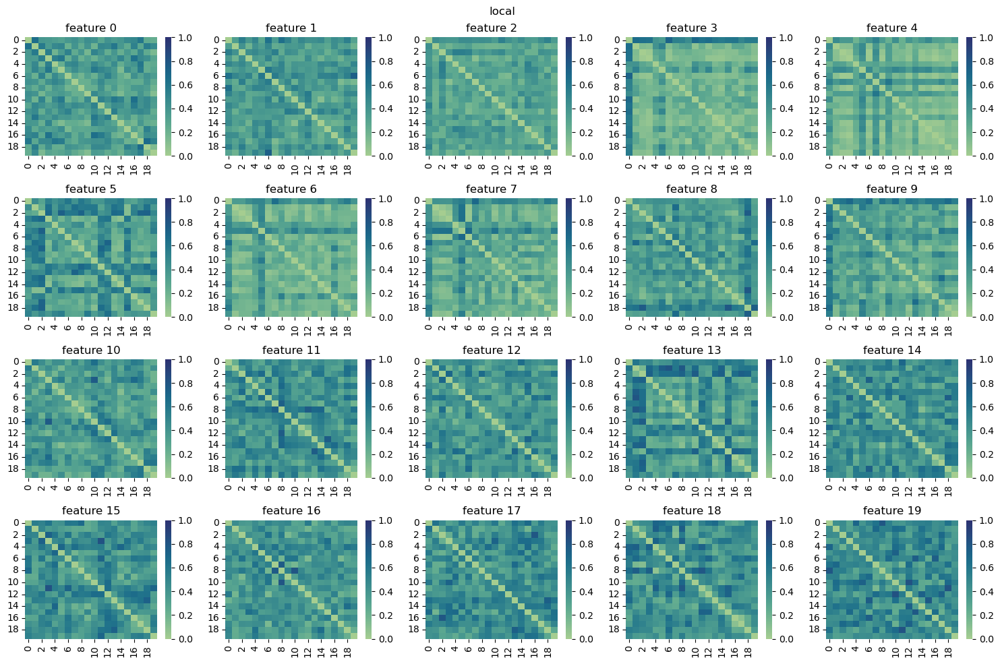

In [801]:
vis_local_model_sim(tracker0, iteration = 20, model='local')

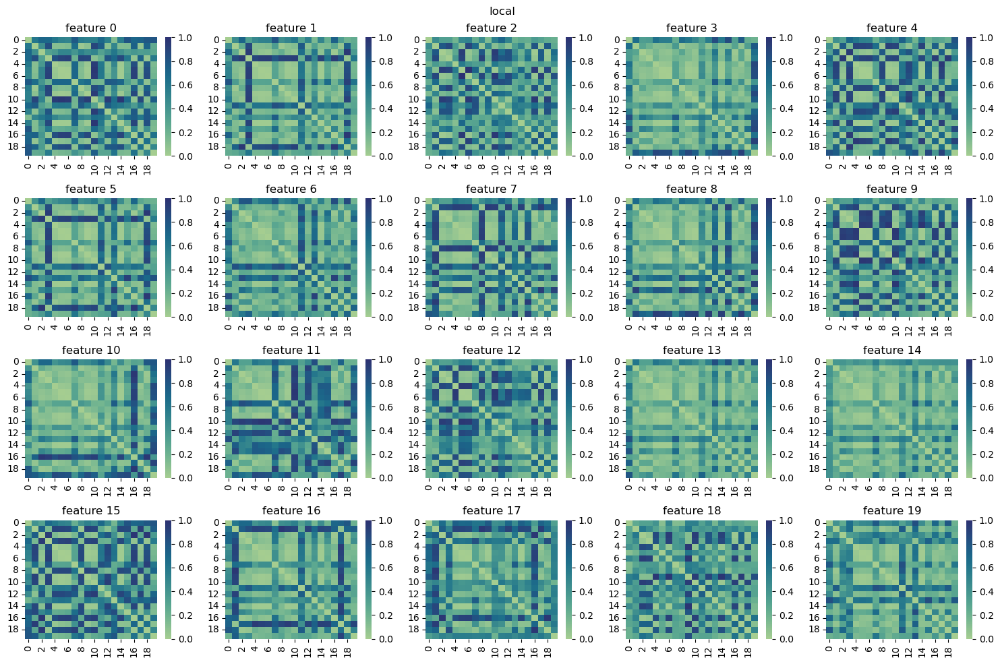

In [715]:
vis_local_model_sim(tracker4, iteration = 20, model='local', metric = 'cos')

In [601]:
coeff = [item for item in tracker4.records if item.feature_idx == 4 and item.iteration == 20][0]
coeff.local_imp_model_params.shape

(20, 20)

In [602]:
modela = coeff.local_imp_model_params[14]
modelb = coeff.local_imp_model_params[19]
print(np.dot(modela, modelb)/(np.linalg.norm(modela)*np.linalg.norm(modelb)))
1 - (np.dot(modela, modelb)/(np.linalg.norm(modela)*np.linalg.norm(modelb)) + 1)/2

-0.7665629970868363


0.8832814985434181

In [603]:
data_t = rets['mnar_lr_local2']['data']['imputed_data']
data_t1 = rets['mnar_lr_local2']['data']['origin_data']
msk_t = rets['mnar_lr_local2']['data']['missing_mask']
data_t = rets['mnar_lr_local2']['data']['imputed_data']
data_t1 = rets['mnar_lr_local2']['data']['origin_data']
msk_t = rets['mnar_lr_local2']['data']['missing_mask']
x14 = data_t[14, :, 4]
x14t = data_t1[14, :, 4]
m14 = msk_t[14, :, 4]
x19 = data_t[19, :, 4]
x19t = data_t1[19, :, 4]
m19 = msk_t[19, :, 4]

In [615]:
np.quantile(x14t, q = 0.5)

0.508101510837643

In [634]:
total_missing = int(missing_ratio * x14t.shape[0])
total_missing

645

In [631]:
end_indices = np.where(x14t == q)[0]
add_up_indices = np.random.choice(
					end_indices, size=total_missing - len(indices), replace=False
				)
na_indices = np.concatenate((indices, add_up_indices))

In [635]:
from src.fed_imp.sub_modules.missing_simulate.ms_simulate.mnar_simulate import simulate_nan_mnar_quantile

In [642]:
X = data_t1[14]
X_imp = simulate_nan_mnar_quantile(X, [4], 0.5, 'right', seed = 1)

In [646]:
msk = np.isnan(X_imp)
x14t = X[:, 4]

<Axes: ylabel='Count'>

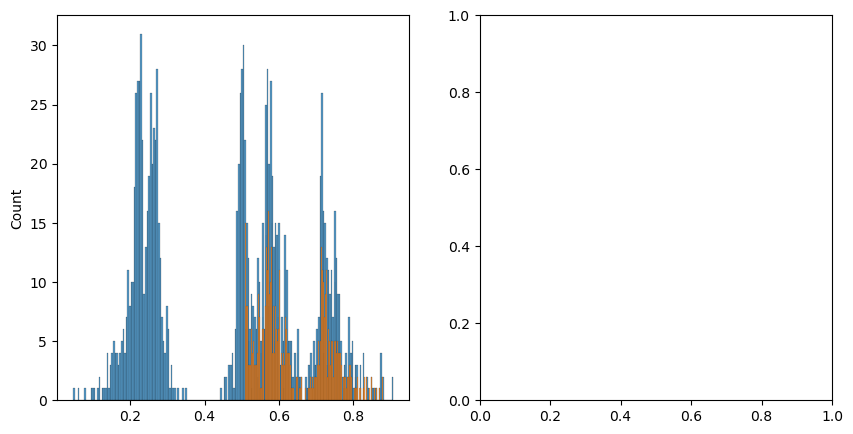

In [649]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.histplot(x = x14t, bins = 200, ax = ax[0])
sns.histplot(x = x14t[msk[:, 4]], bins = 200, ax = ax[0])

<Axes: ylabel='Count'>

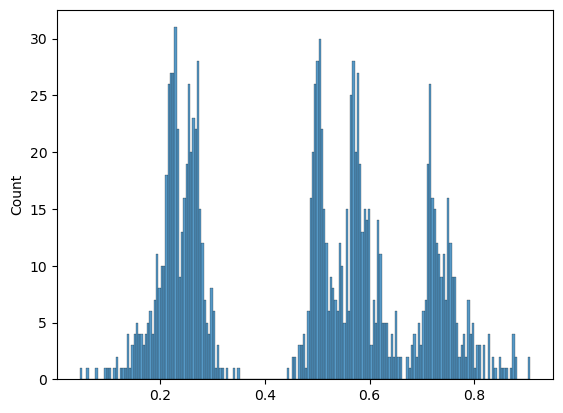

In [606]:
sns.histplot(x = x19t, bins = 200)

In [574]:
data14 = data_t[14]
x = data14[:, :-1]
print(x.shape)
x_ = np.delete(x, 4, axis=1)
x_ = x_[m14 == 1]
print(x_.shape)
x_ = np.concatenate([x_, np.ones(x_.shape[0]).reshape(-1,1)], axis=1)
print(x_.shape)
imputed14 = x_@modela
imputed14_ = x_@modelb
print(imputed14.shape)
print(imputed14_.shape)

(1290, 20)
(650, 19)
(650, 20)
(650,)
(650,)


In [577]:
print(np.mean(abs(imputed14 - x14[m14])))
print(np.mean(abs(imputed14_ - x14[m14])))

0.0009407086610696447
0.27718427230024695


In [559]:
data19 = data_t[19]
x1 = data19[:, :-1]
print(x1.shape)
x1_ = np.delete(x1, 4, axis=1)
print(x1_.shape)
x1_ = np.concatenate([x1_, np.ones(x1_.shape[0]).reshape(-1,1)], axis=1)
print(x1_.shape)
imputed19 = x1_@modelb
imputed19_ = x1_@modela
print(imputed19.shape)

(1290, 20)
(1290, 19)
(1290, 20)
(1290,)


In [553]:
data_t = rets['mnar_lr_local2']['data']['imputed_data']
data_t1 = rets['mnar_lr_local2']['data']['origin_data']
msk_t = rets['mnar_lr_local2']['data']['missing_mask']
x14 = data_t[14, :, 4]
x14t = data_t1[14, :, 4]
m14 = msk_t[14, :, 4]
x19 = data_t[19, :, 4]
x19t = data_t1[19, :, 4]
m19 = msk_t[19, :, 4]

In [587]:
print(np.mean(imputed14 - x14[m14]))
print(np.mean(imputed14_ - x14[m14]))
# print(np.mean(imputed19_[m19] - x19[m19]))
# print(np.mean(imputed14 - x14t))
# print(np.mean(imputed14_ - x14t))
# print(np.mean(imputed19 - x19t))
abs(x14 - x19)[m14&m19][0:10]

-7.997146616176172e-05
0.011285173673500577


array([0.19332482, 0.14889582, 0.23502049, 0.2244214 , 0.14421803,
       0.14190096, 0.15927668, 0.12195078, 0.09475234, 0.08357951])

In [571]:
print(x_[m14][0:10]@modela)
print(x_[m14][0:10]@modelb)

[0.22733894 0.34543996 0.48686648 0.50337852 0.66328734 0.32248817
 0.46773045 0.22217764 0.36629912 0.43619056]
[-0.03119907  0.96108286 -0.01190617  0.17546759  0.32601026  0.49384357
  0.71598779  0.04918428  0.98419777  0.46419465]


In [506]:
np.mean(x19[(m19==1)&(m14==1)] - x14[(m19==1)&(m14==1)])

-0.009311017329282724

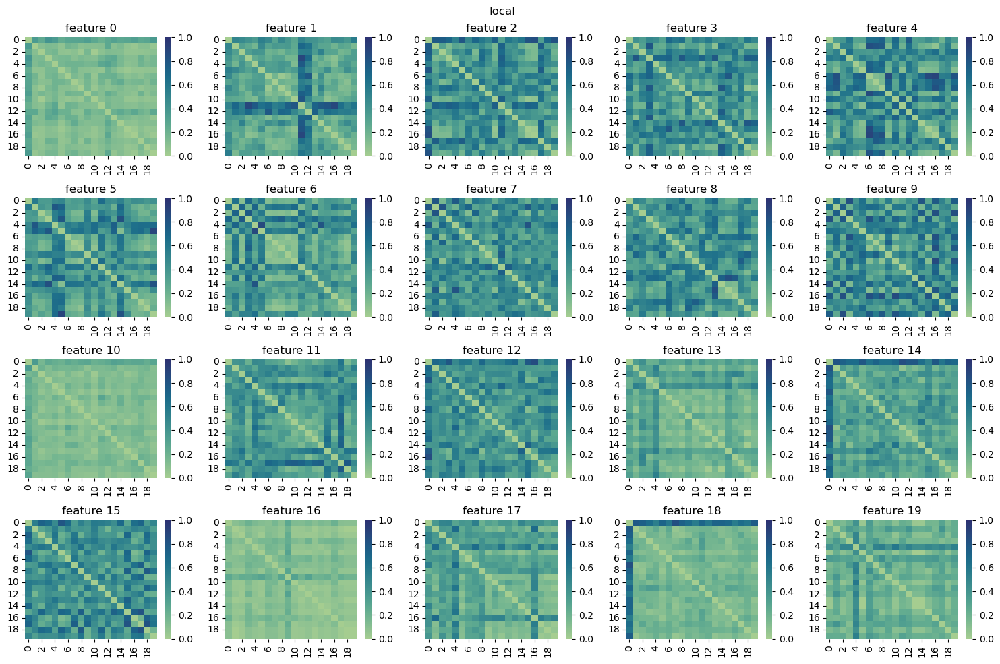

In [303]:
vis_local_model_sim(tracker0, iteration = 4, model='local')

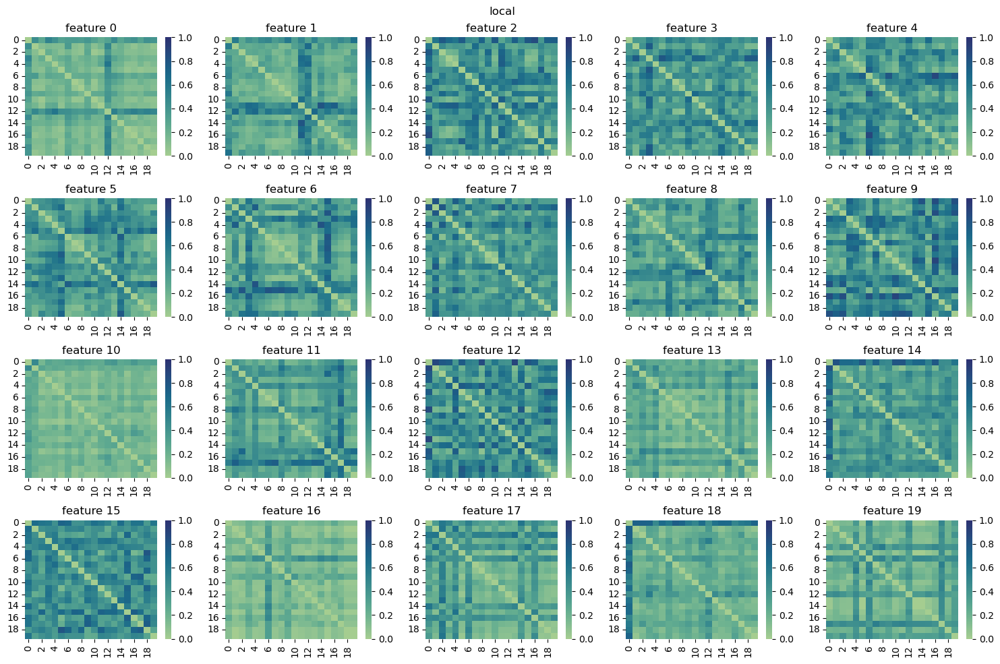

In [304]:
vis_local_model_sim(tracker0, iteration = 20, model='local')

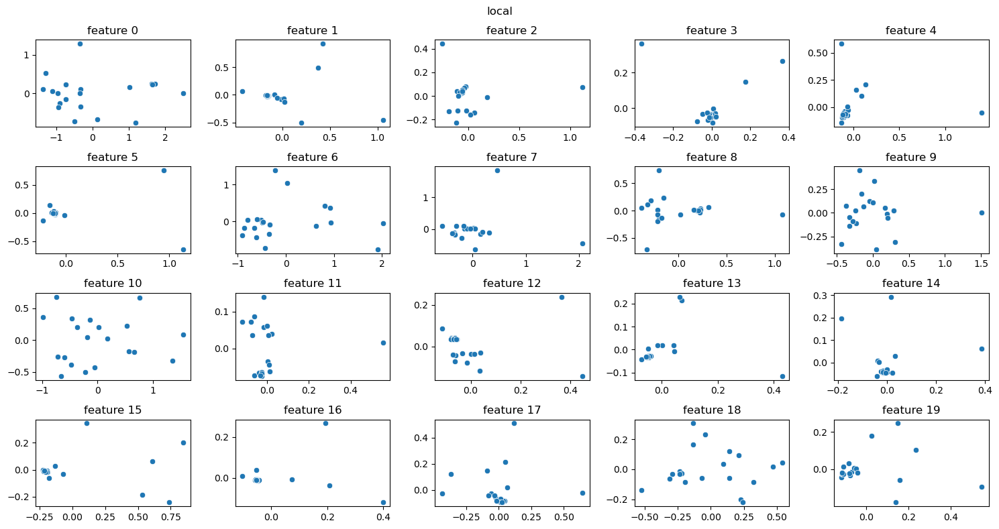

In [187]:
vis_local_model(tracker, iteration = 1, model = 'local', decomp = 'PCA')

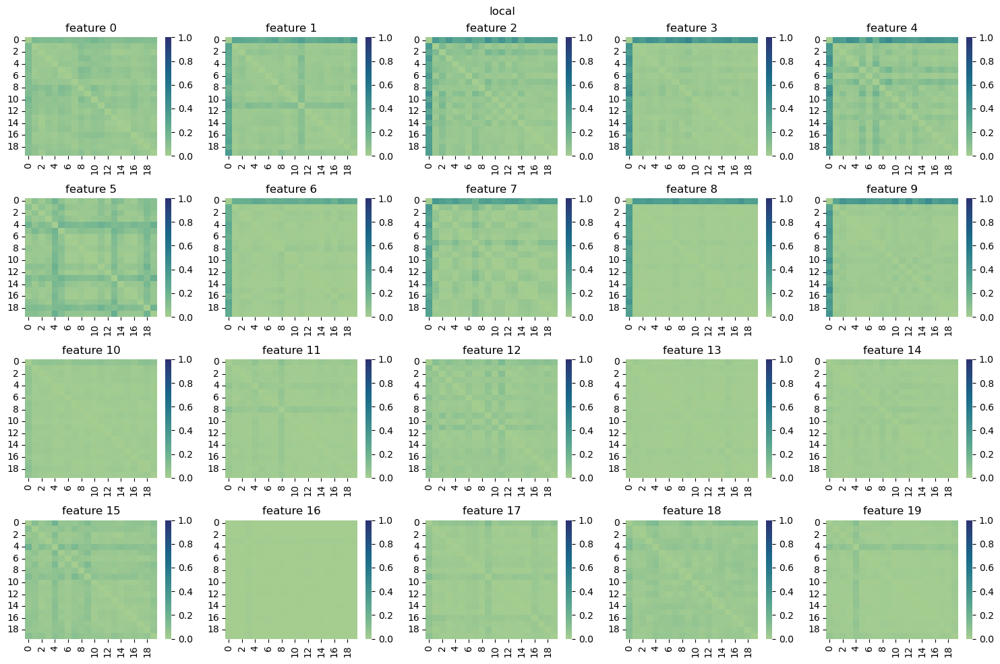

In [802]:
vis_local_model_sim(tracker, iteration = 1, model = 'local')

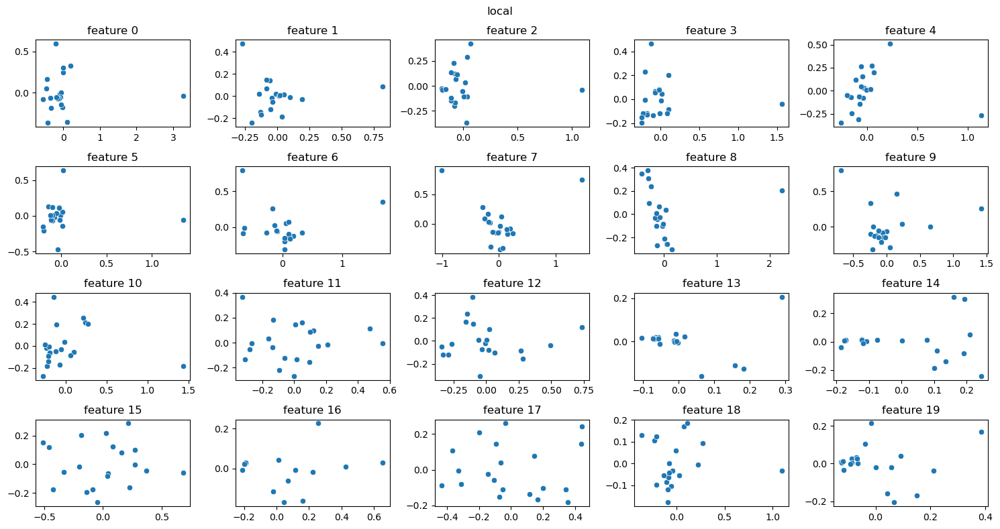

In [190]:
vis_local_model(tracker, iteration = 20, model = 'local', decomp = 'PCA')

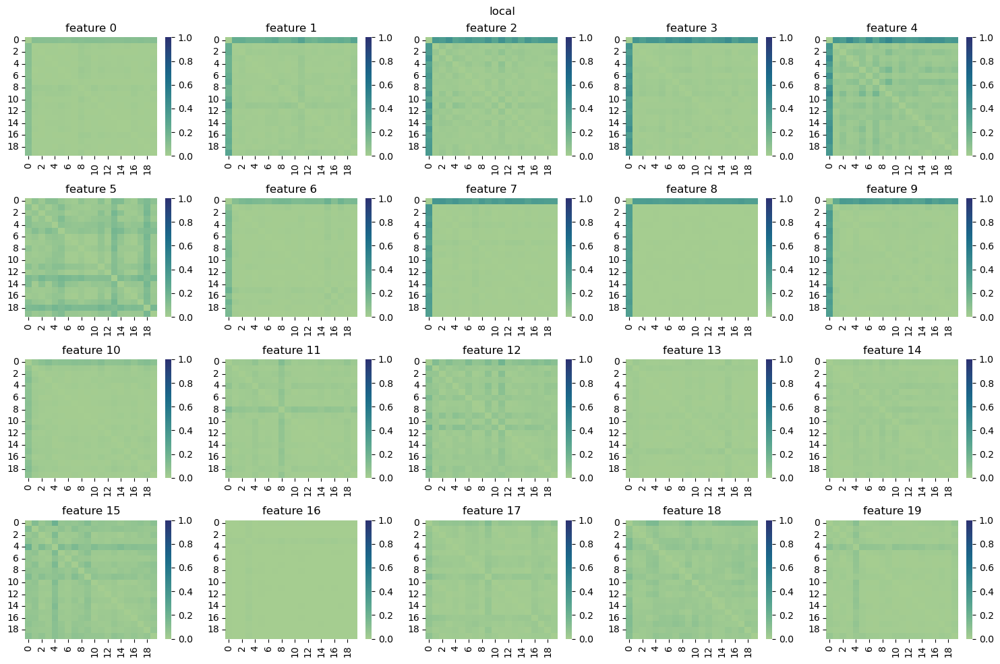

In [803]:
vis_local_model_sim(tracker, iteration = 20, model = 'local')

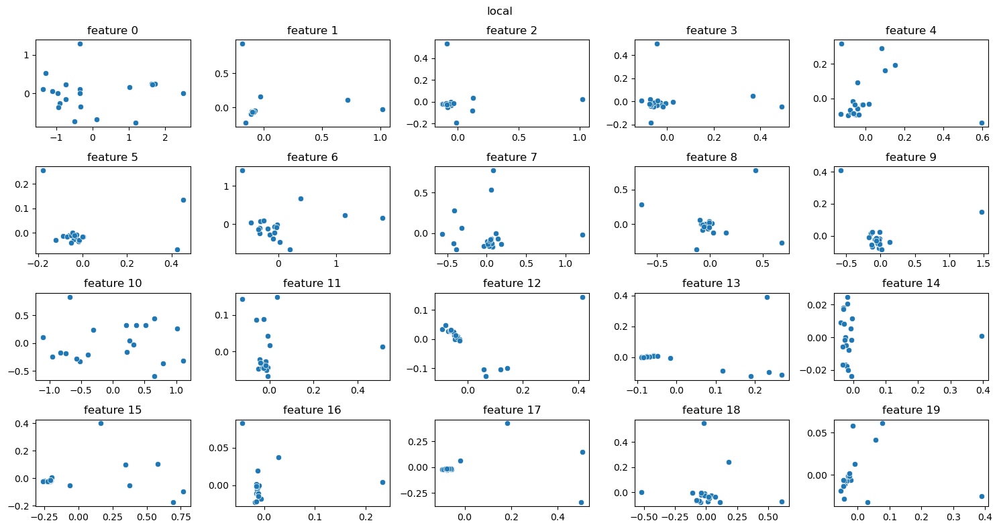

In [232]:
vis_local_model(tracker2, iteration = 1, model = 'local', decomp = 'PCA')

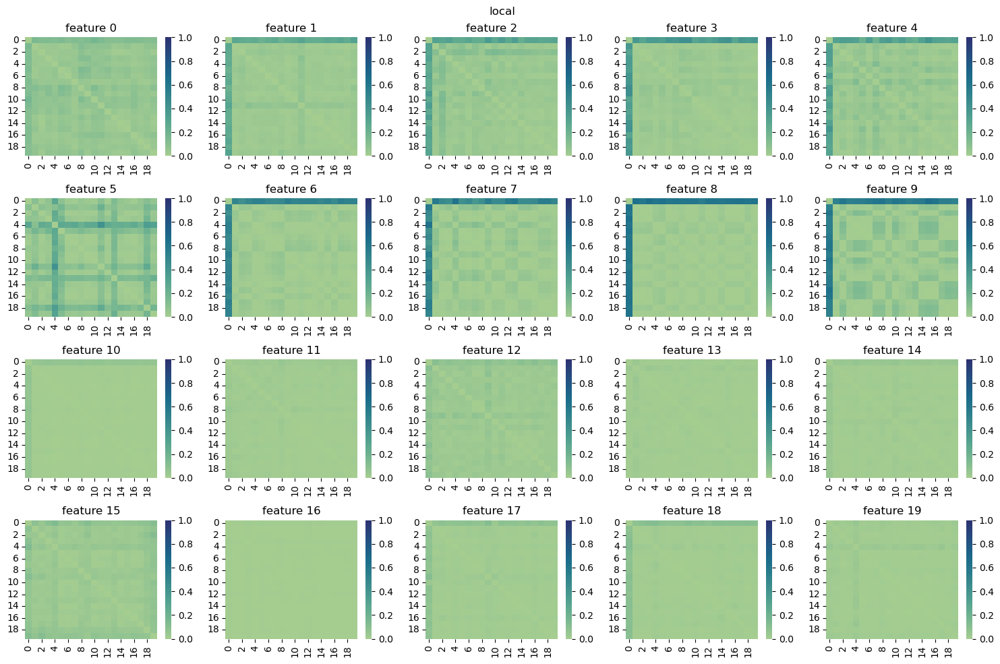

In [804]:
vis_local_model_sim(tracker2, iteration = 1, model = 'local')

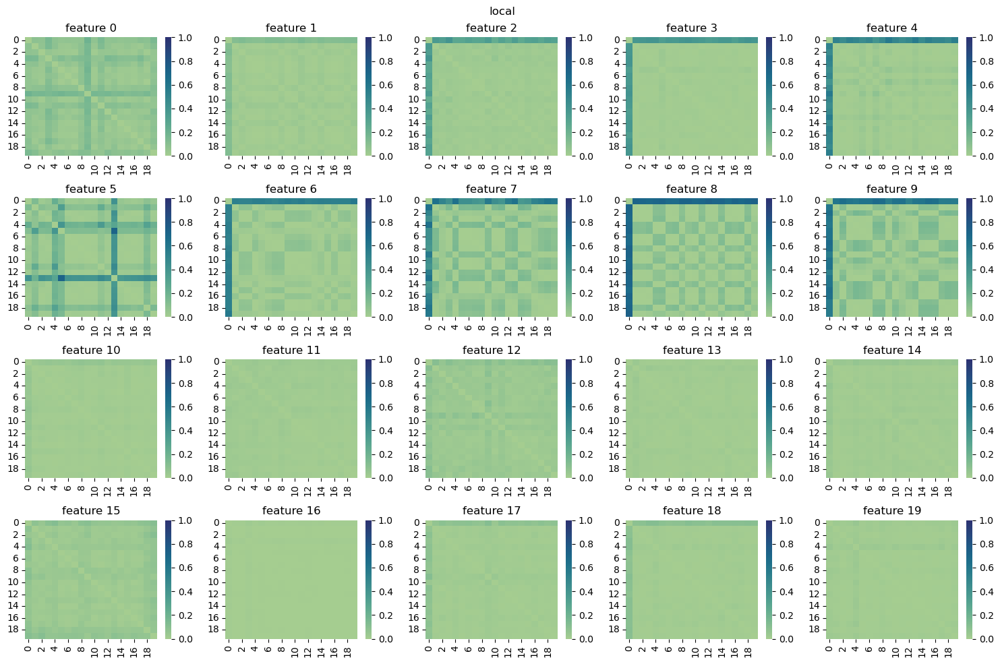

In [805]:
vis_local_model_sim(tracker2, iteration = 5, model = 'local')

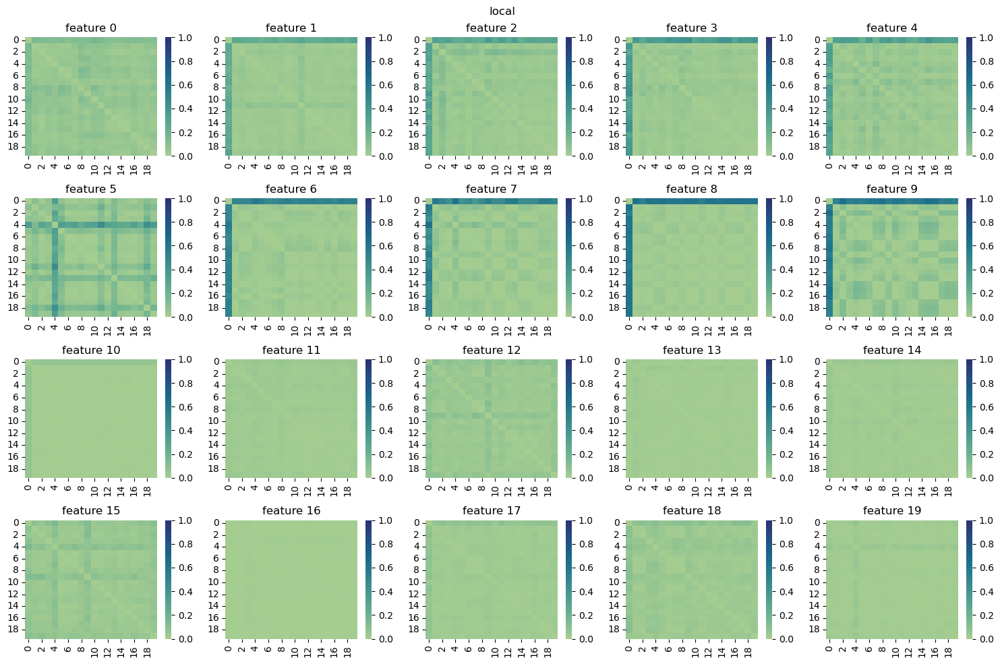

In [806]:
vis_local_model_sim(tracker3, iteration = 1, model='local')

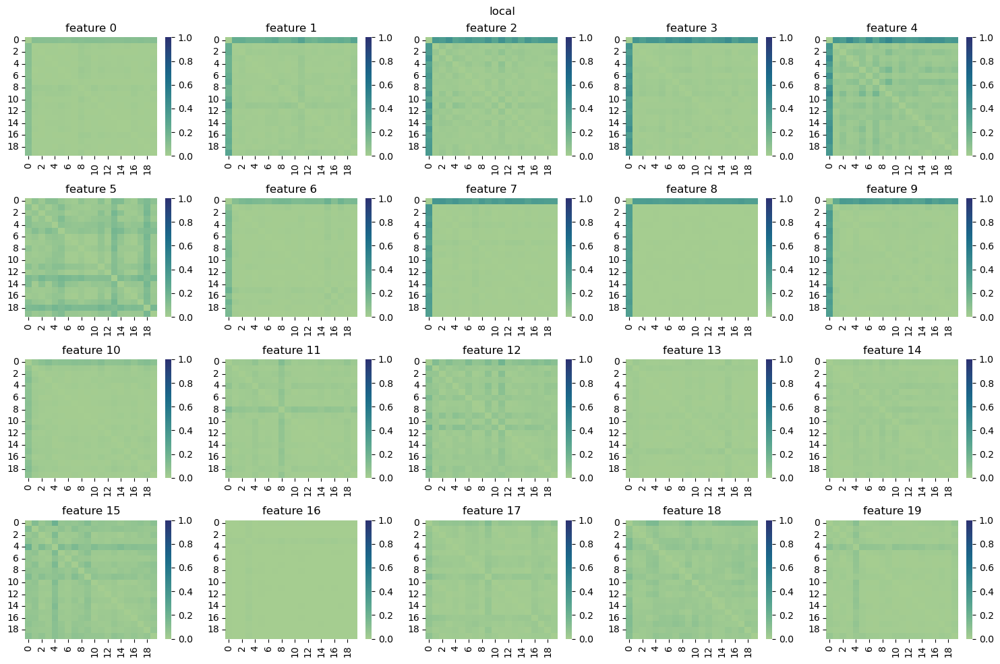

In [807]:
vis_local_model_sim(tracker, iteration = 20, model = 'local')

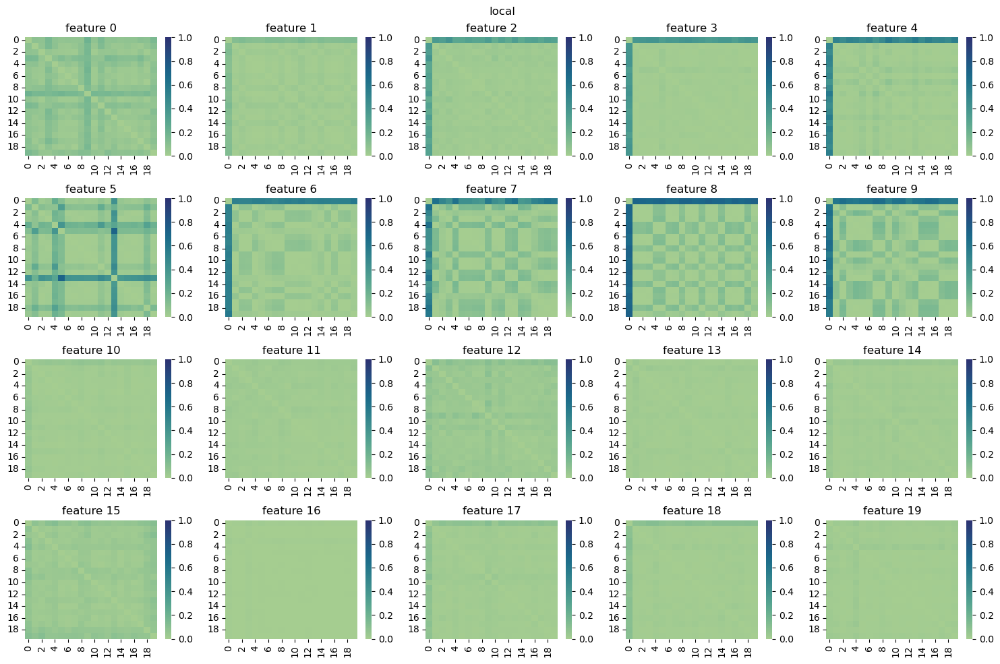

In [808]:
vis_local_model_sim(tracker2, iteration = 20, model = 'local')

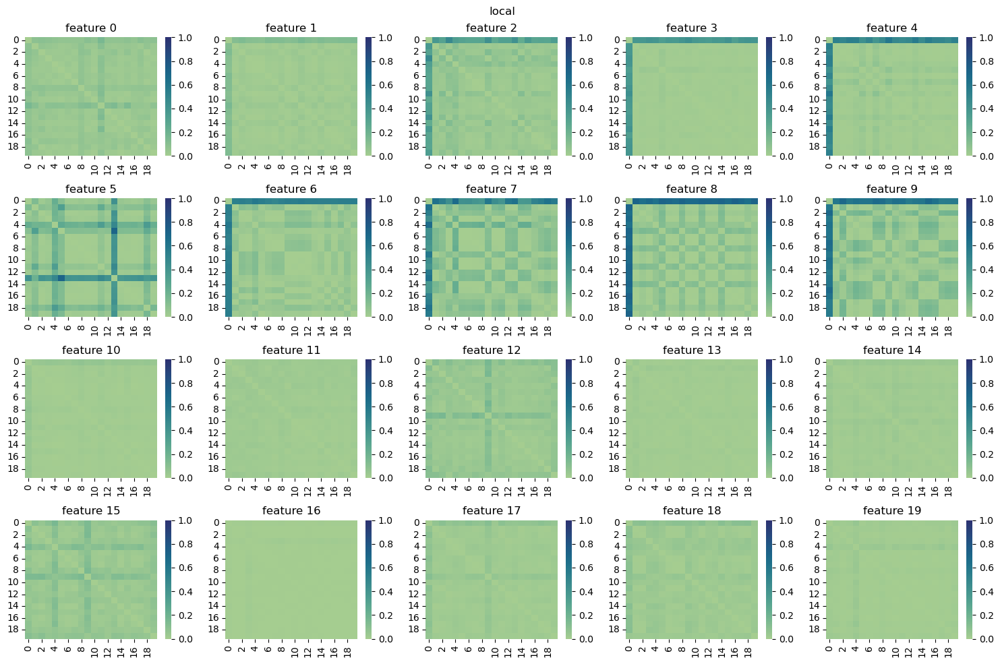

In [809]:
vis_local_model_sim(tracker3, iteration = 20, model = 'local')

#### Debug

In [221]:
def calculate_dis(iteration, tracker1, tracker2, what = 'data_imp'):
    n = 20
    if what == 'data_imp':
        for i in range(n):
            print(np.linalg.norm(tracker1.client_infos[i].data_imp[iteration] - tracker2.client_infos[i].data_imp[iteration]))
    elif what == 'local_model':
        for feature_idx in range(20):
            record1 = [item for item in tracker1.records if item.iteration == iteration and item.feature_idx == feature_idx][0]
            record2 = [item for item in tracker2.records if item.iteration == iteration and item.feature_idx == feature_idx][0]
            print(np.linalg.norm(record1.local_imp_model_params - record2.local_imp_model_params))

In [218]:
calculate_dis(0, tracker, tracker2)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [224]:
calculate_dis(1, tracker, tracker2, what = 'local_model')

0.0
1.6337764897152576
1.5702846497335994
0.5004458163916409
1.3448007010580283
1.9703069642747753
7.092822298471598
4.107754167615582
2.3113705599253667
2.6584593576326214
3.5720236606869196
0.6173539228937241
0.8044787428567401
0.5814388400454863
0.5877724712278766
1.1204952547227718
0.7345322421861542
1.1153722099686756
2.1486559810471793
0.793473354314416


#### Mechanism Model

##### Local

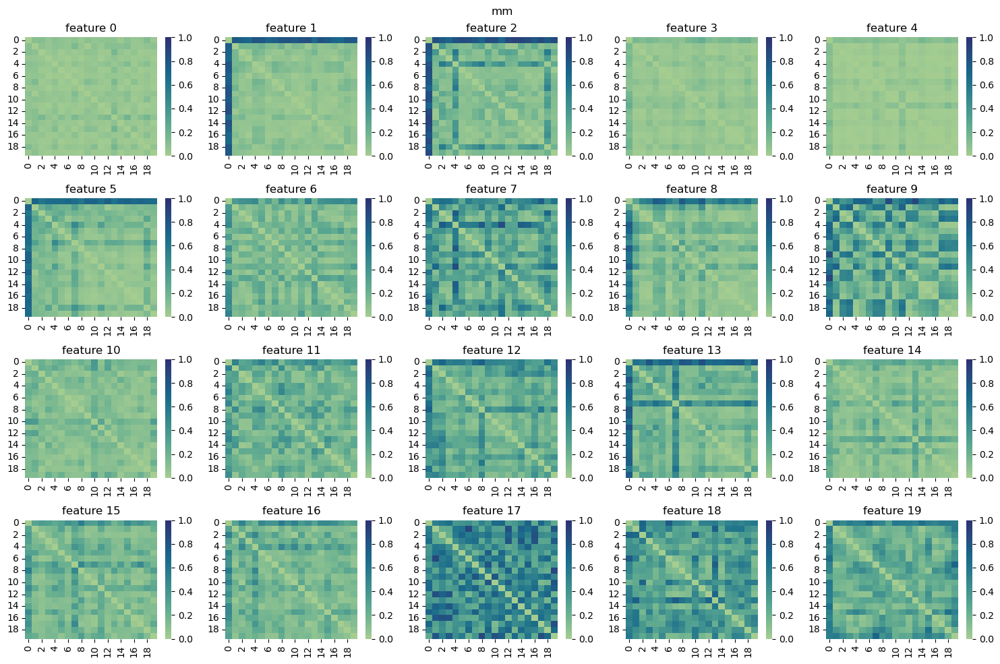

In [810]:
vis_local_model_sim(tracker0, iteration = 1, model = 'mm')

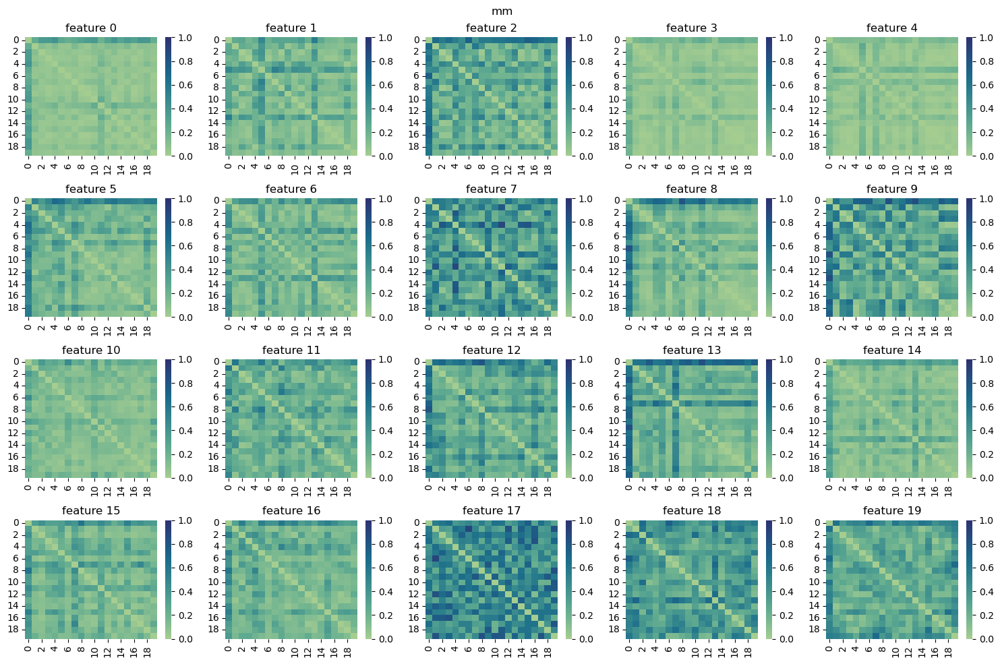

In [811]:
vis_local_model_sim(tracker0, iteration = 4, model = 'mm')

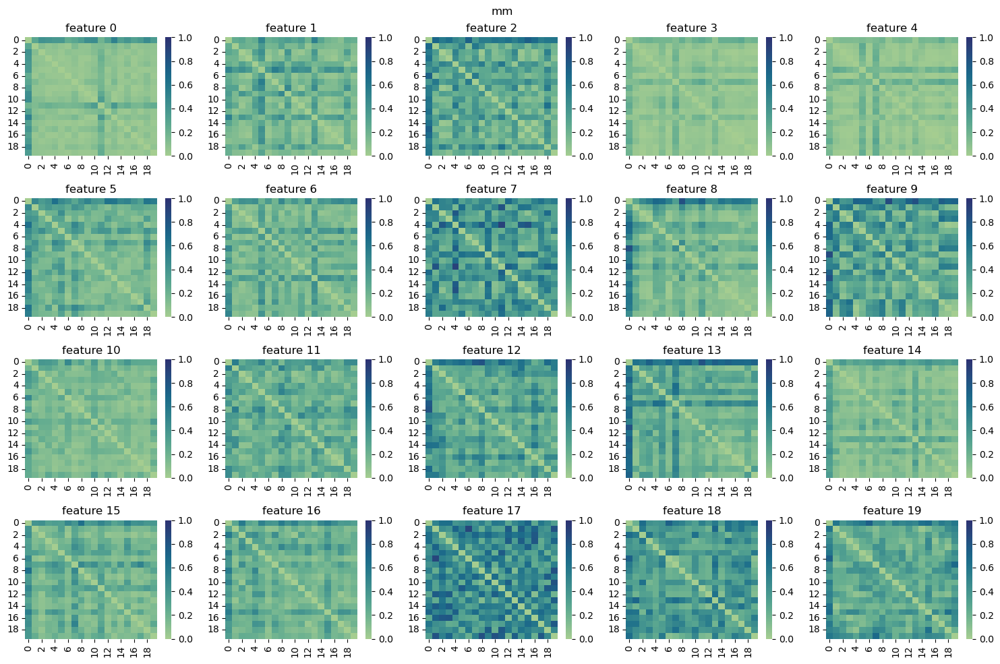

In [812]:
vis_local_model_sim(tracker0, iteration = 20, model='mm')

##### SimpleAVG

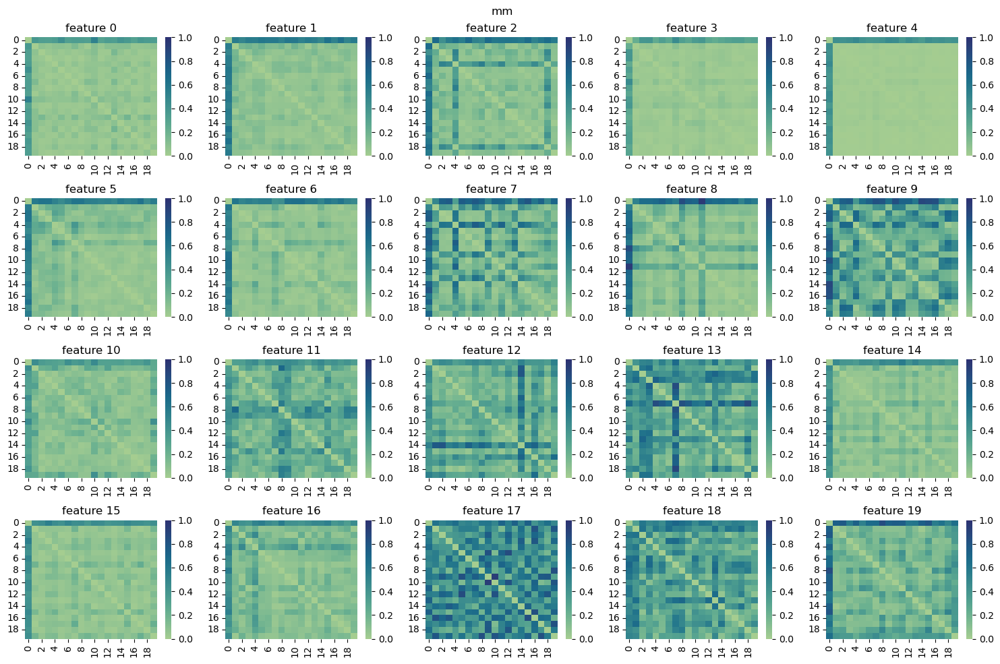

In [813]:
vis_local_model_sim(tracker, iteration = 1, model='mm')

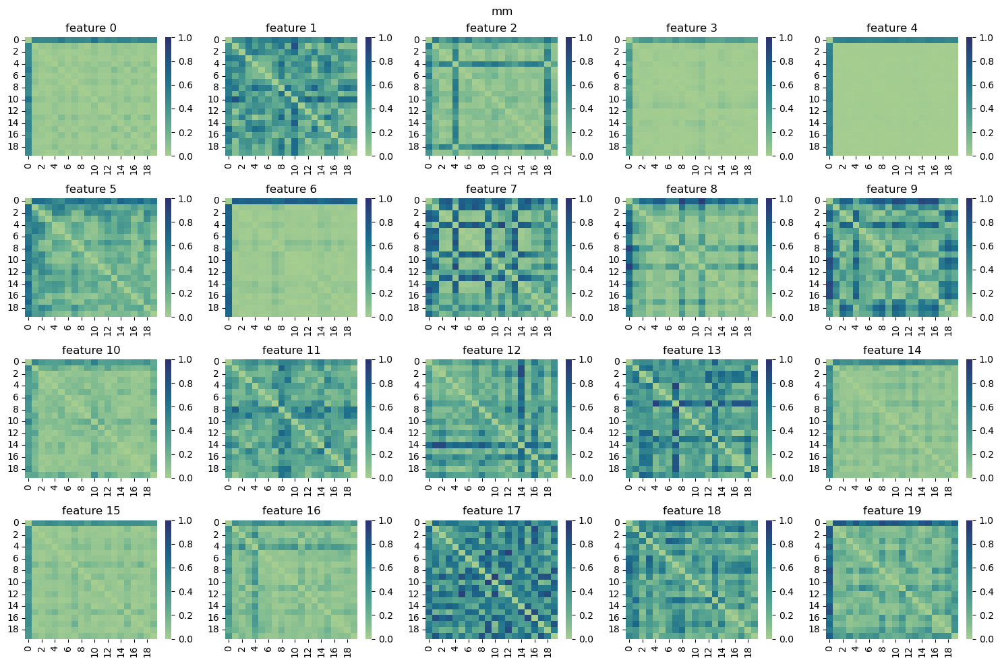

In [814]:
vis_local_model_sim(tracker, iteration = 3, model='mm')

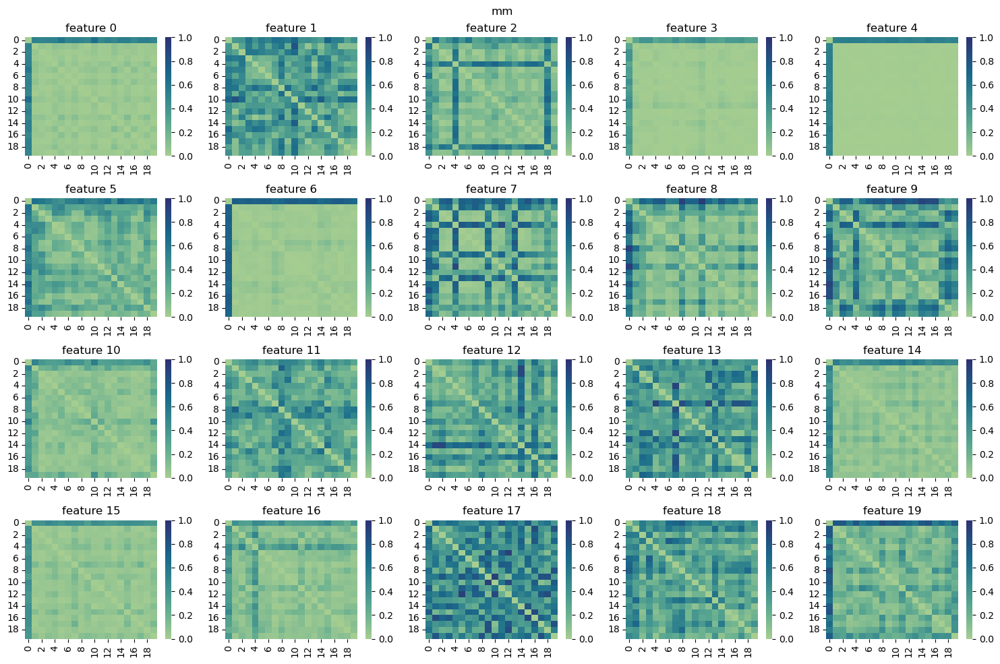

In [815]:
vis_local_model_sim(tracker, iteration = 5, model='mm')

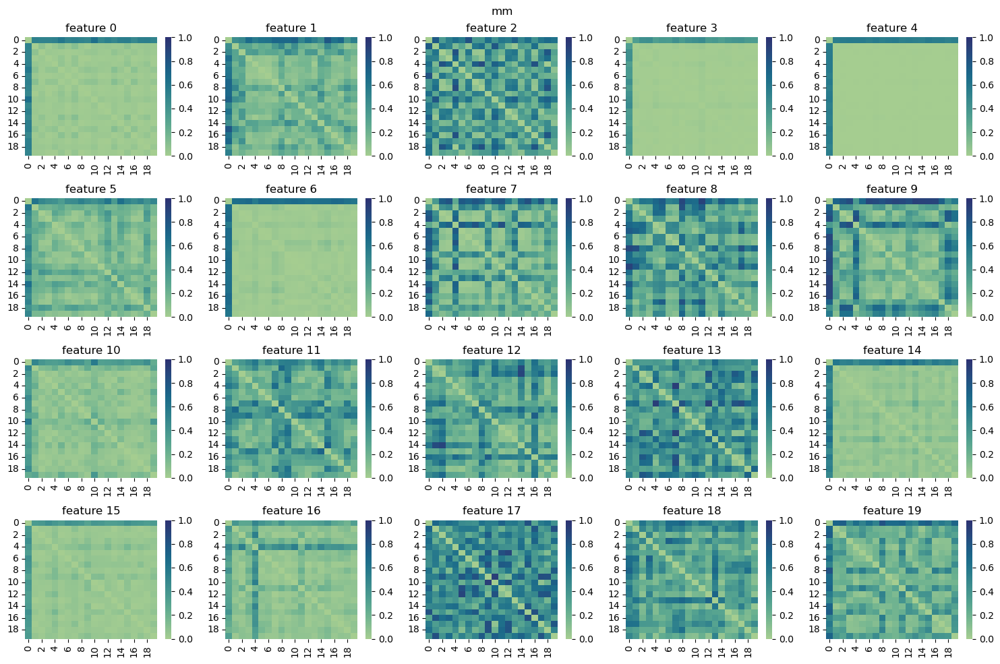

In [816]:
vis_local_model_sim(tracker, iteration = 20, model='mm')

##### Complementary

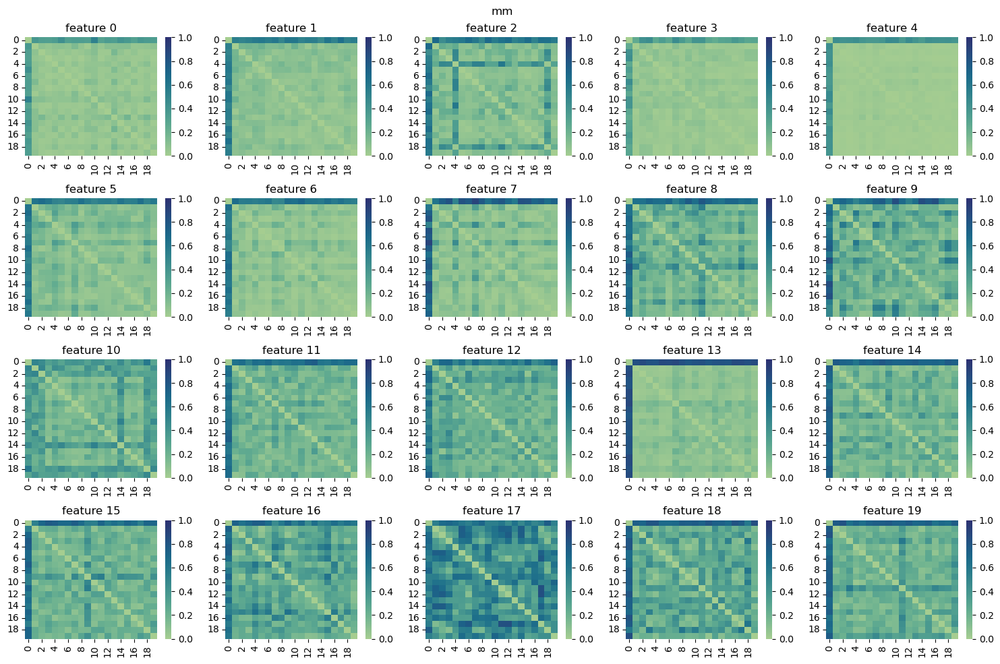

In [817]:
vis_local_model_sim(tracker2, iteration = 1, model='mm')

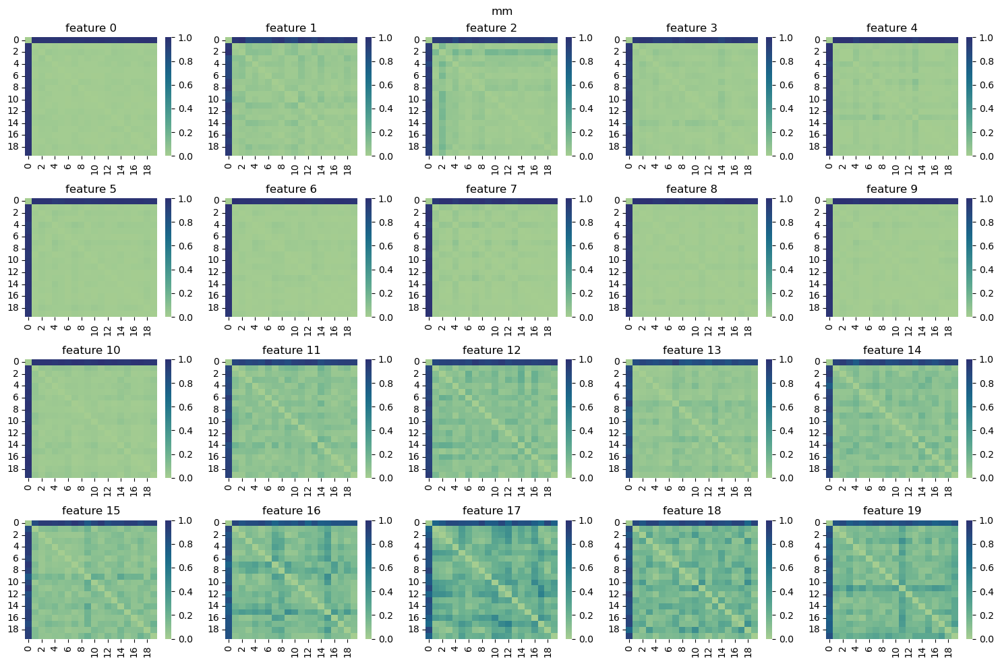

In [818]:
vis_local_model_sim(tracker2, iteration = 5, model='mm')

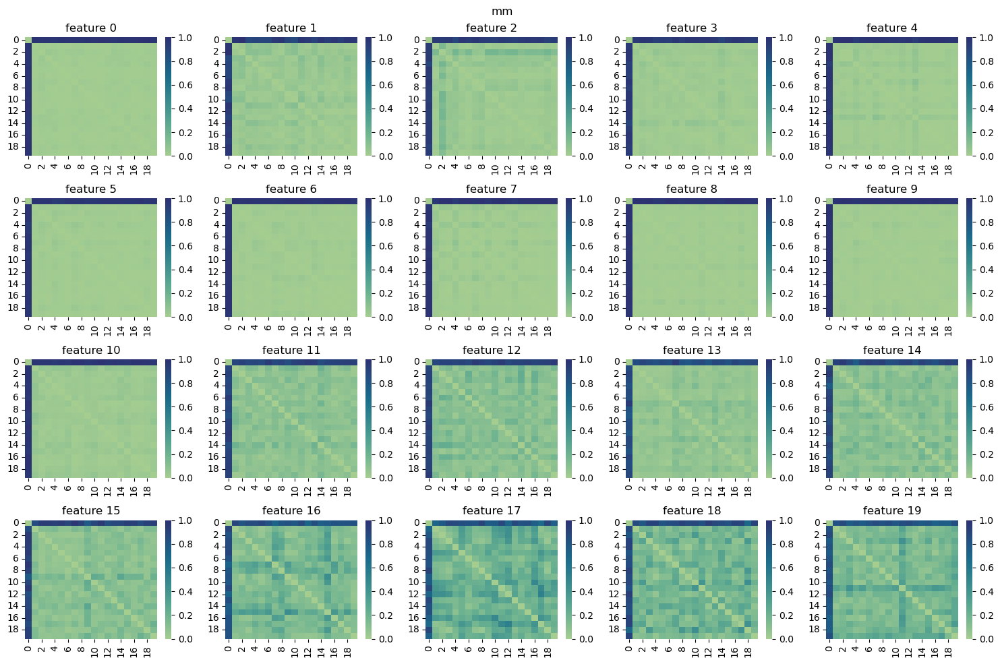

In [819]:
vis_local_model_sim(tracker2, iteration = 20, model='mm')

##### Ours

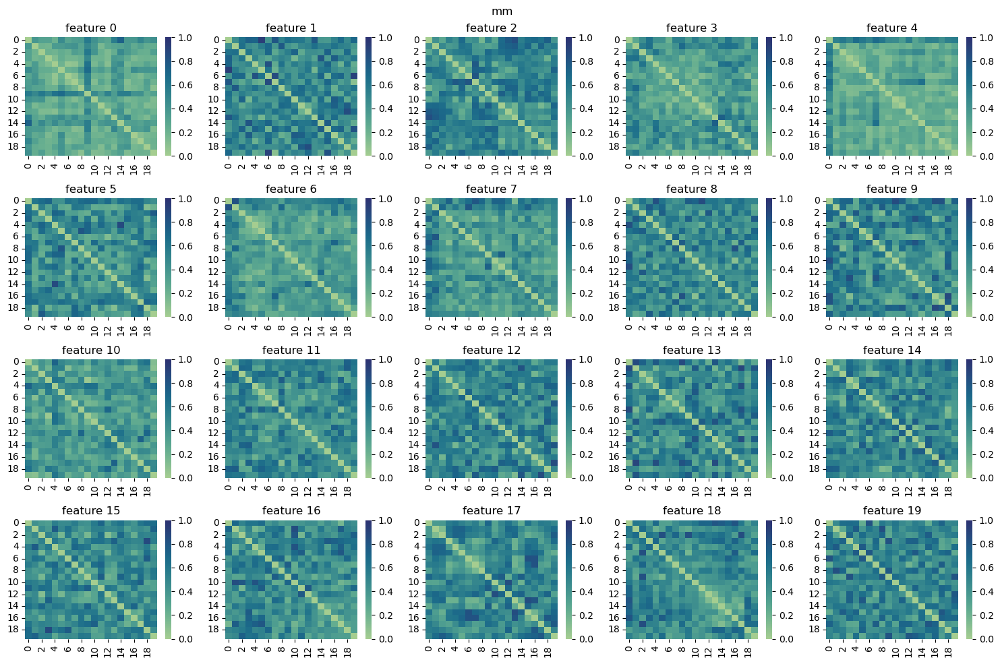

In [34]:
vis_local_model_sim(tracker3, iteration = 1, model='mm')

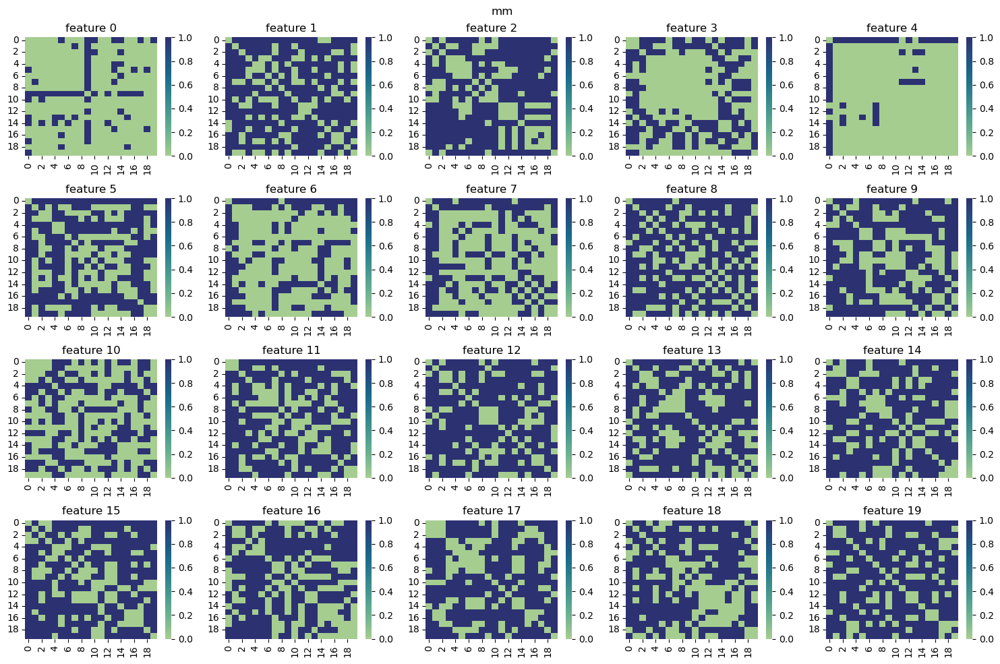

In [36]:
vis_local_model_sim_t(tracker3, iteration = 1, model='mm')

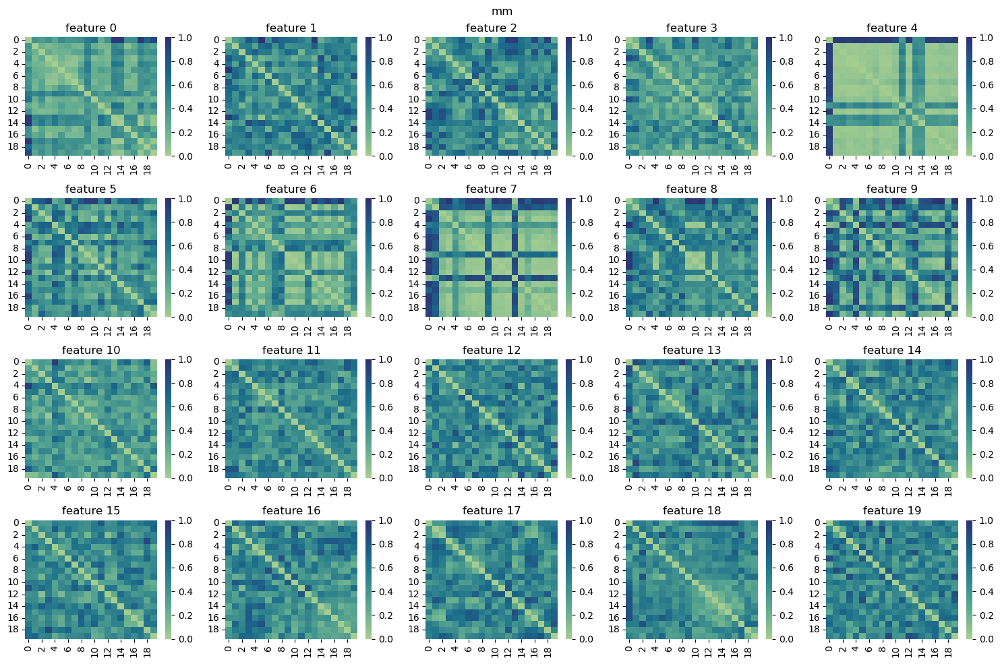

In [35]:
vis_local_model_sim(tracker3, iteration = 2, model='mm')

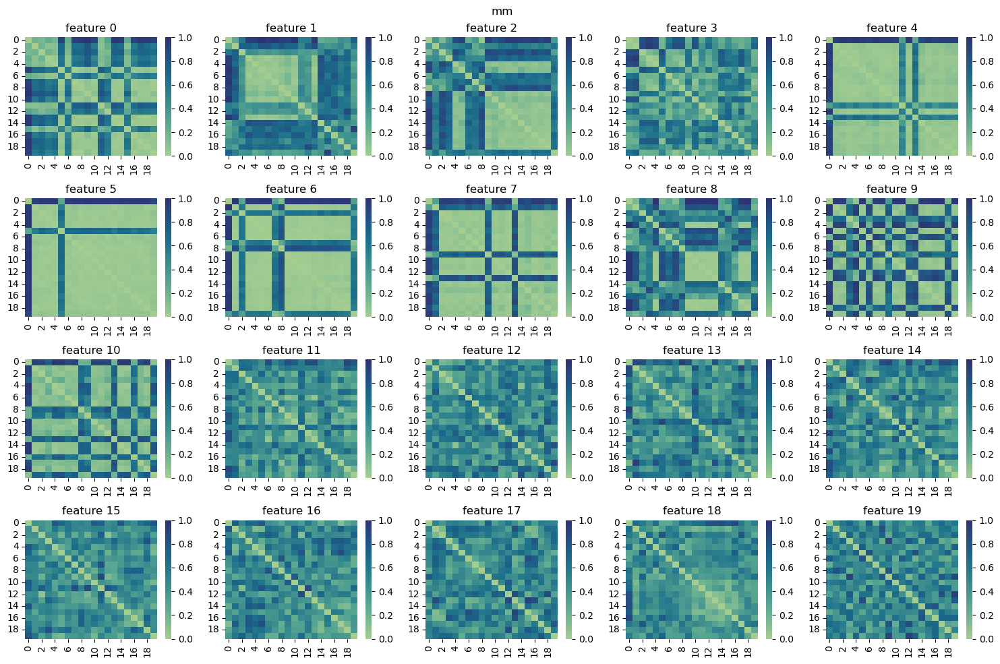

In [37]:
vis_local_model_sim(tracker3, iteration = 20, model='mm')

### MARY

In [824]:
trackery0 = trackers['mary_sigmoid_lr_local']
trackery1 = trackers['mary_sigmoid_lr_simpleavg']
trackery2 = trackers['mary_sigmoid_lr_complementary']
trackery3 = trackers['mary_sigmoid_lr_fedmechw']

#### Local

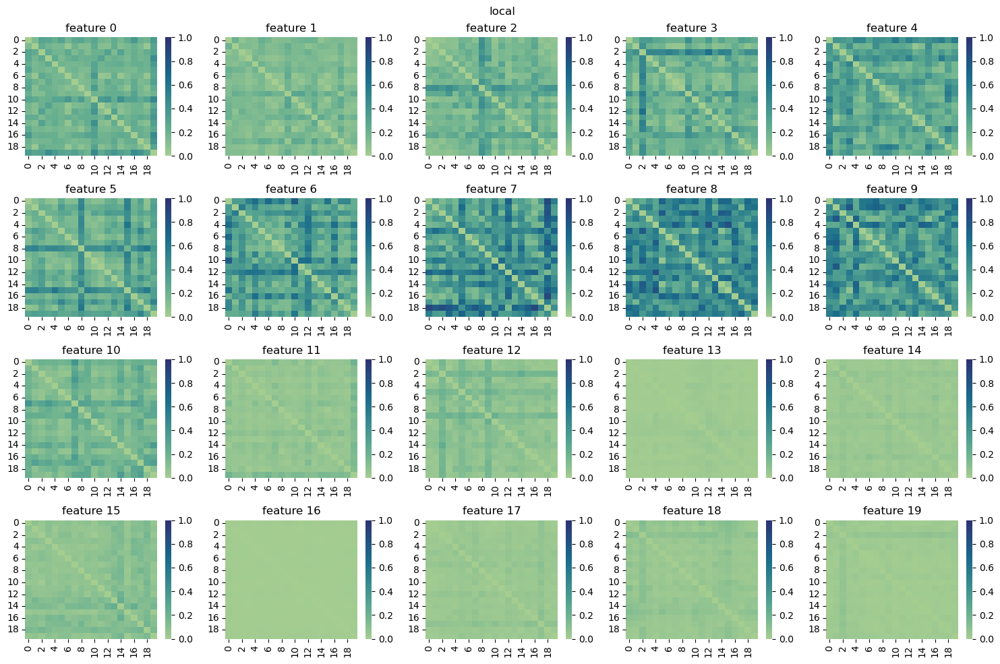

In [825]:
vis_local_model_sim(trackery0, iteration = 1, model='local')

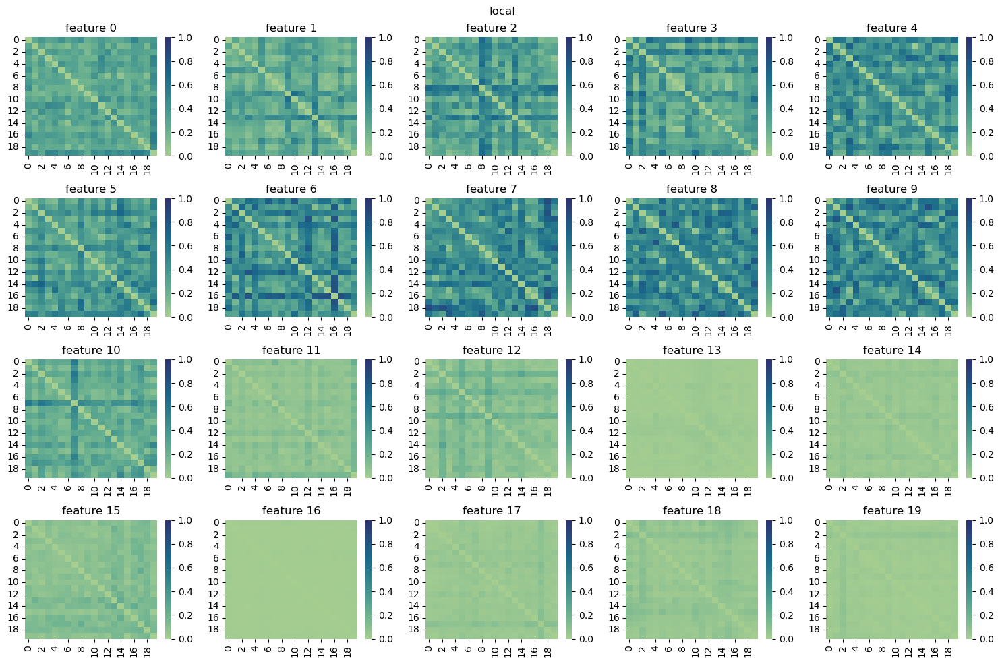

In [826]:
vis_local_model_sim(trackery0, iteration = 20, model='local')

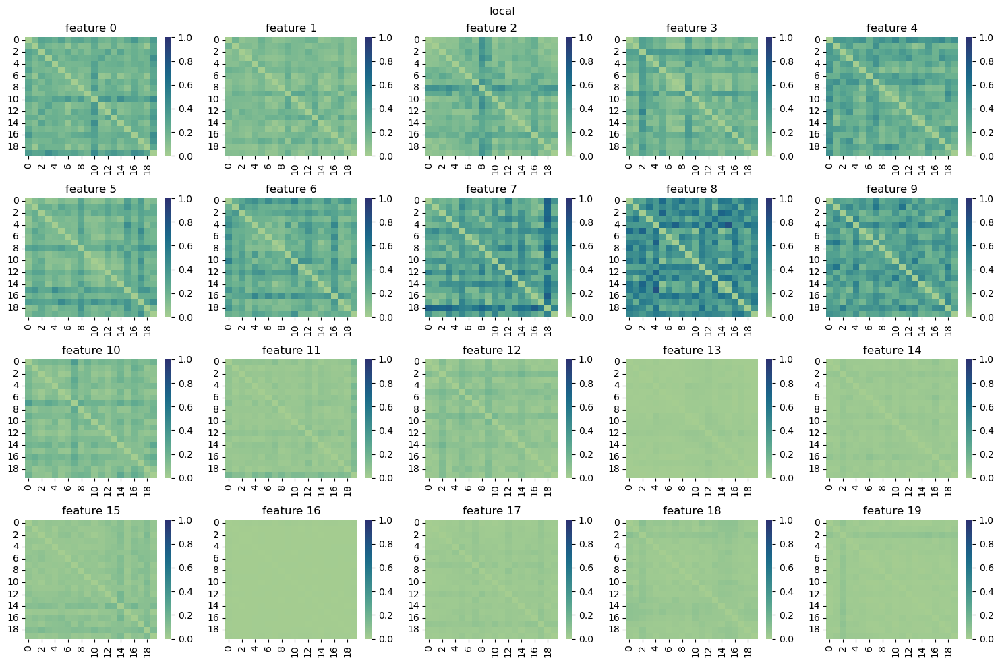

In [827]:
vis_local_model_sim(trackery1, iteration = 1, model='local')

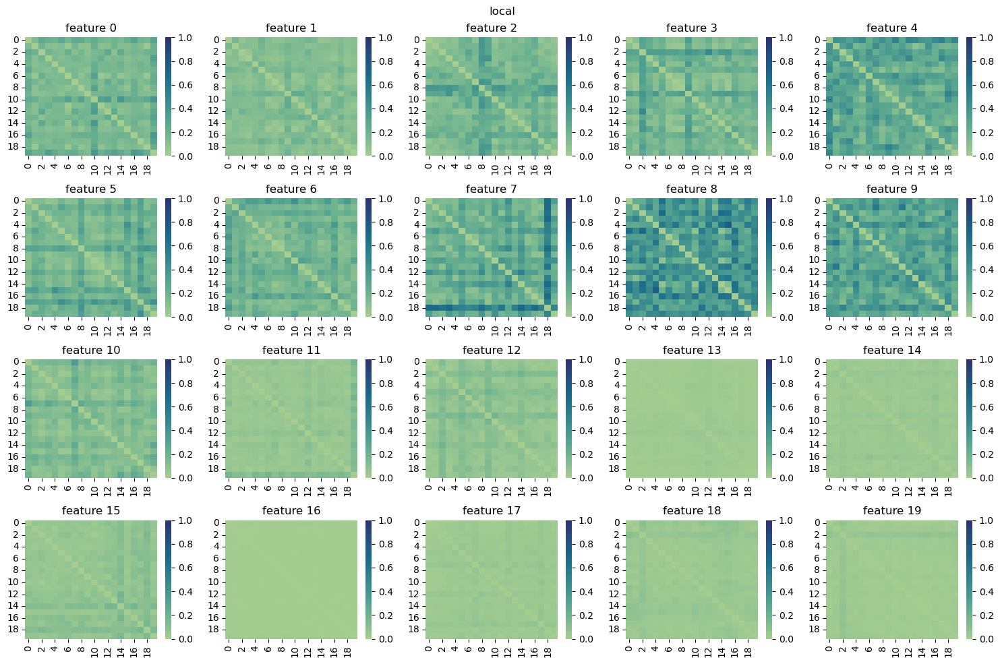

In [828]:
vis_local_model_sim(trackery1, iteration = 20, model='local')

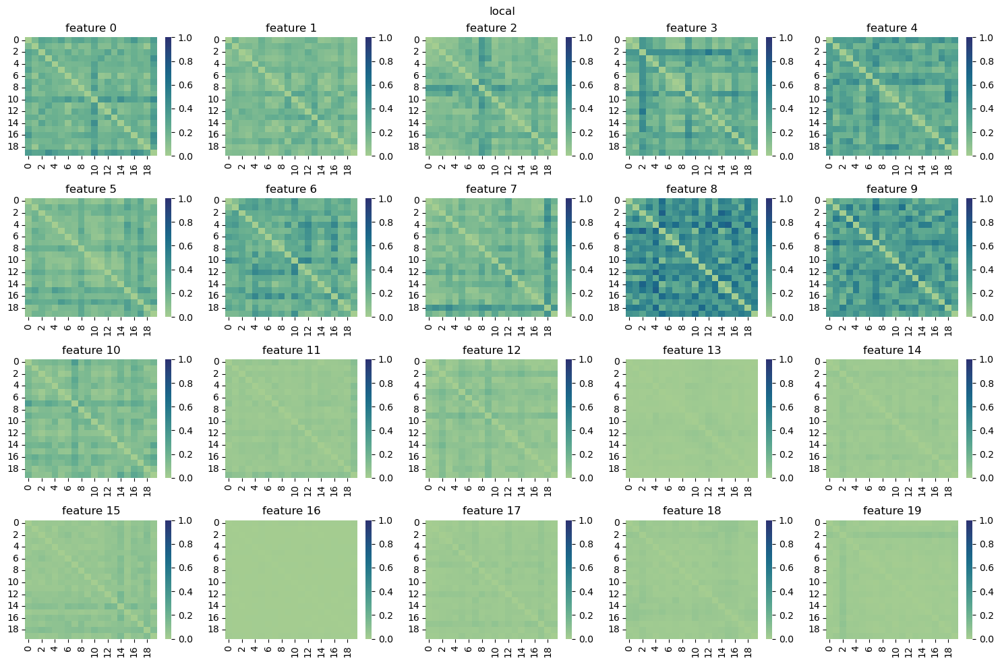

In [829]:
vis_local_model_sim(trackery2, iteration = 1, model='local')

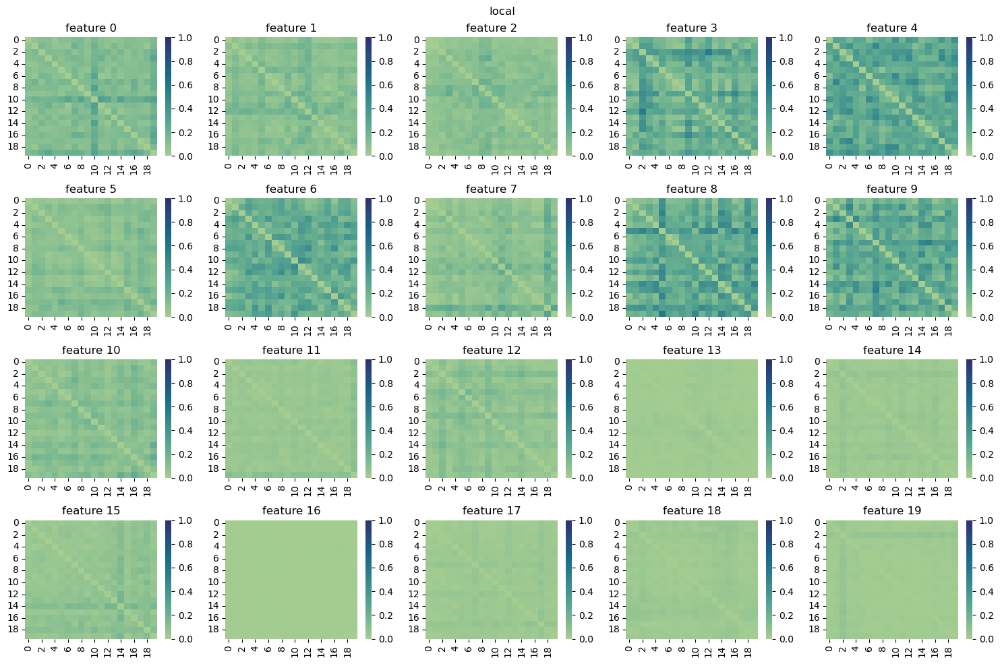

In [830]:
vis_local_model_sim(trackery2, iteration = 20, model='local')

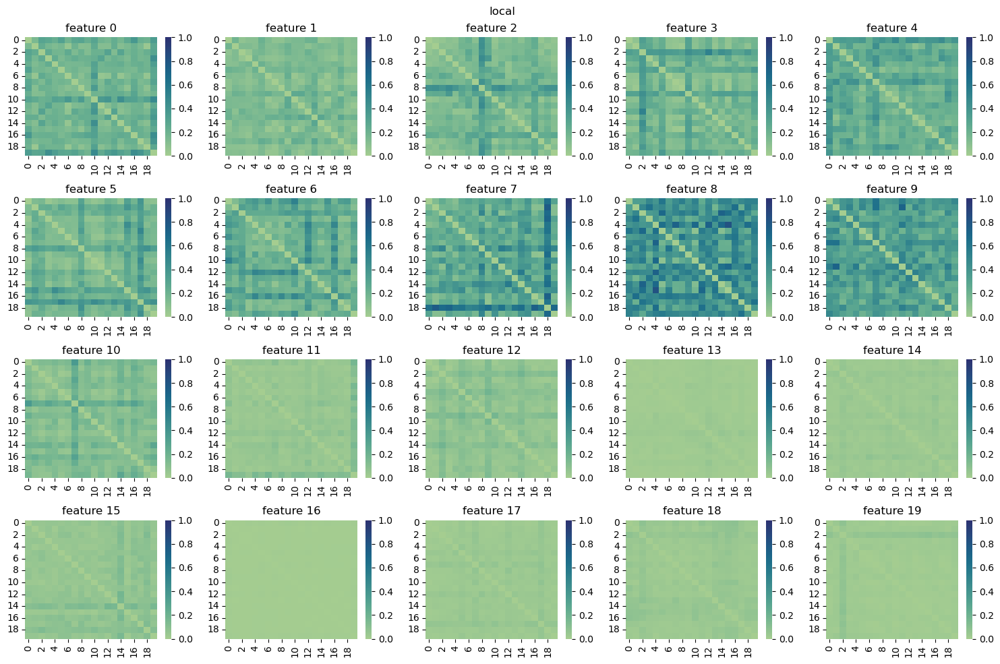

In [831]:
vis_local_model_sim(trackery3, iteration = 1, model='local')

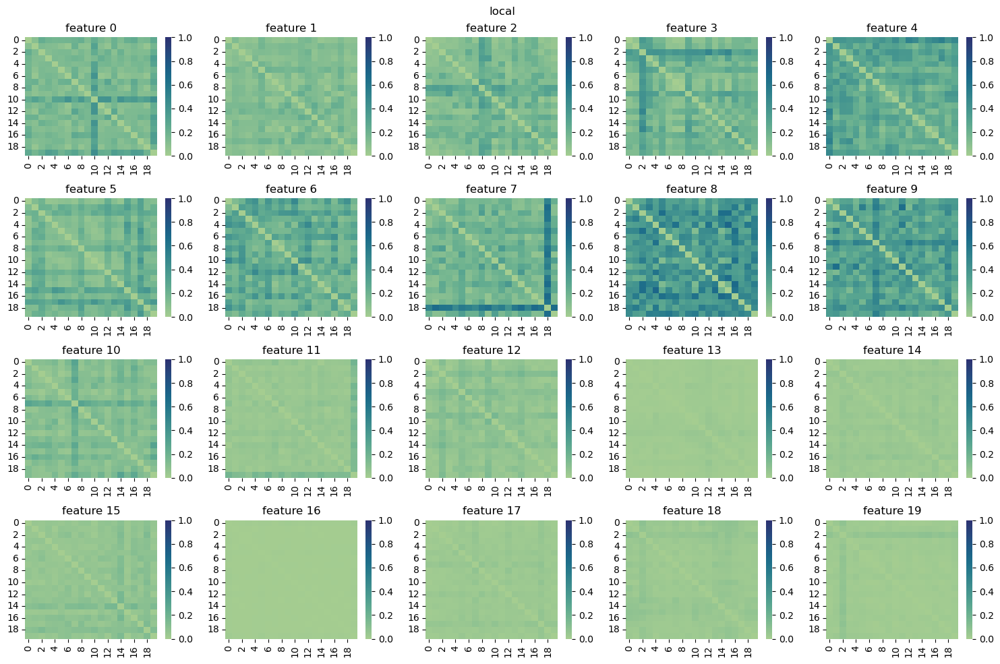

In [832]:
vis_local_model_sim(trackery3, iteration = 20, model='local')

#### Mechanism

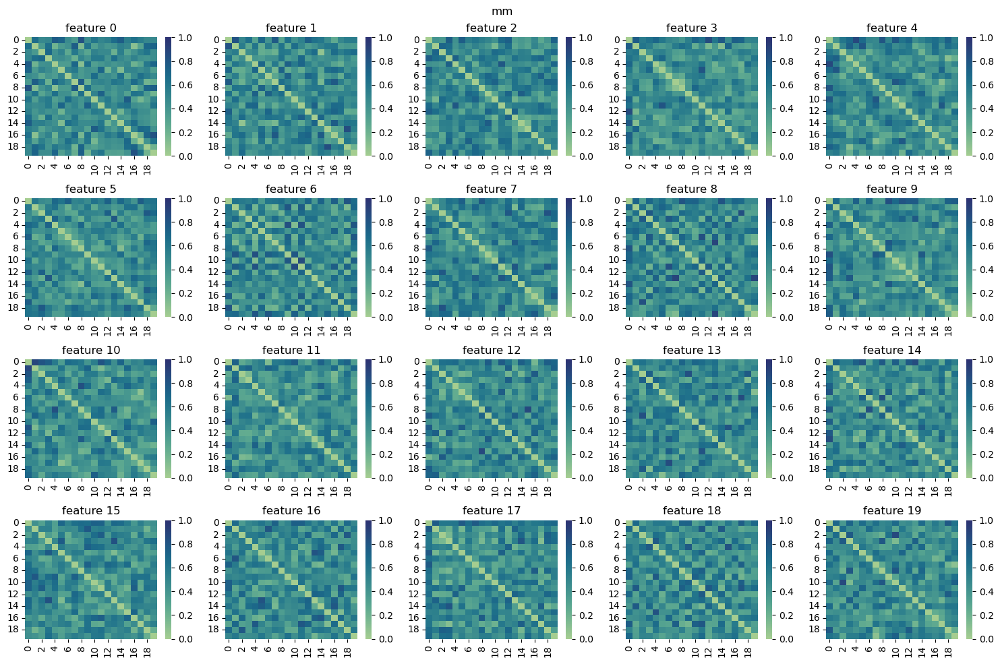

In [833]:
vis_local_model_sim(trackery1, iteration = 1, model='mm')

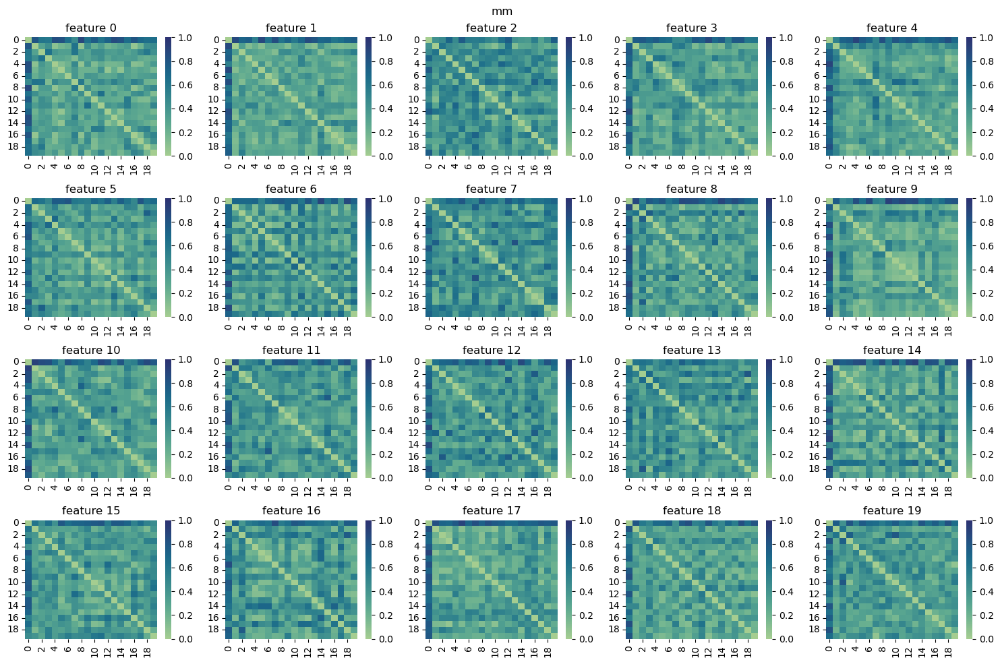

In [835]:
vis_local_model_sim(trackery2, iteration = 20, model='mm')

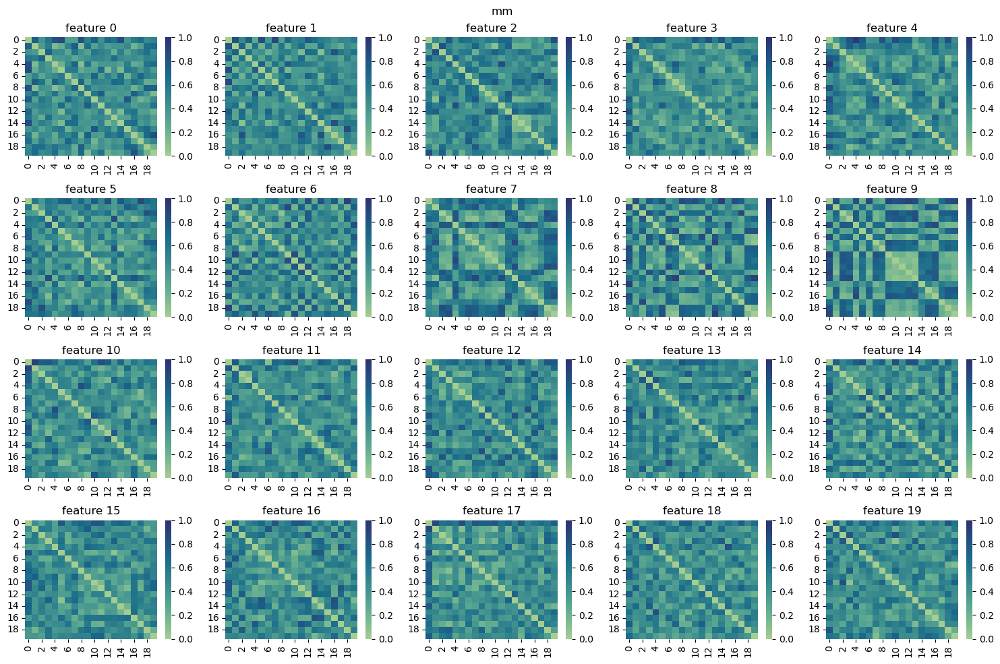

In [834]:
vis_local_model_sim(trackery3, iteration = 20, model='mm')